# Tangling Identification: Imbalance (TI-I).

In [9]:
import os
import sys
import logging
from copy import copy
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import keras
from keras.models import load_model
import pandas as pd

from utils.mnistutil import MNISTUitl
from utils.sliceutil3 import Slice
from keras.models import load_model

from utils.logger import setup_logger

sx = 28
sy = 28
path = "data/intermediate"

setup_logger('TI-I_FMNIST-3')
# from keras.models import load_model
# from datetime import datetime

accuracyCheck=[]
labs = [0,1,2,3,4,5,6,7,8,9]

In [167]:
def concat_series(param, path):
    result = pd.DataFrame()
    for index, file in [(file.split('_')[0], file) for file in os.listdir(path) if param in file]:
        df = pd.read_csv(os.path.join(path, file))
        
        if type(df) == pd.core.frame.DataFrame:
            df = df.drop(columns=['Unnamed: 0']).assign(digit=index)
            result = pd.concat([result, df])
        else:
            df = df['0'].rename(index)
            result = pd.concat([result, df], axis=1)
        
    
    return result

def plot_neuron_weights(W, neuron, pad=0, subplot_sizex=10, subplot_sizey=10, figsize=(20, 20)):
    fig, axes = plt.subplots(subplot_sizex, subplot_sizey, figsize=figsize)

    for i, ax in enumerate(axes.flat):
        W[W.neuron == (i+pad)][['digit', str(neuron)]].set_index('digit').plot(ax=ax)
        ax.set_title(f'Weight {i+pad}')
        ax.legend().remove()

    plt.tight_layout()  # Adjust the spacing between subplots
    plt.show()

# Loading the data and training the model

In [3]:
mn = MNISTUitl()
X, Y, x, y = mn.getdata2(0,0,sx,sy)
xt, yt, xT, yT = mn.trainData(X, Y, x,y,sx,sy,10,50)

x_train shape: (48000, 28, 28, 1)
(48000, 28, 28, 1) 48000 train samples (48000,)
8000 test samples
(48000,) (48000,)


# Concern Identification (CI)

In [4]:
j = 2

In [5]:
slicingModel=load_model('emnist.h5')
model=load_model('emnist.h5')

digit  = []
slc = Slice()
W1, W2, W3, W4, b1, b2, b3, b4 = slc.getweights(slicingModel)

In [6]:
digit_idxs = []
for i in range(0,len(yt)):
    if yT[i] == j and model.predict(xT[i:i+1])[0][j] >.9:
        digit.append(xT[i])
        digit_idxs.append(i)
digit = digit[0:1000]
digit_idxs = digit_idxs[:1000]

1/1 [==============================] - 0s 21ms/step


In [7]:
mc = 0
for x in xT[digit_idxs]:
    W1, W2, W3, W4, b1, b2, b3, b4= slc.modifyThroughInterSection(slicingModel,x, mc, sx,sy, debug=True)
    mc=mc+1
    if np.count_nonzero(slc.D4) < 45:
        logging.info(f"Output Layer's valid weights are below threshold! Reseting weights.")
        #print("Breaking at mc ", mc,np.count_nonzero(slc.D2))
        slc.first = True

In [10]:
d1 = concat_series('dd1', path)
print(f"Shape of d1: {d1.shape}")
d2 = concat_series('dd2', path)
print(f"Shape of d2: {d2.shape}")
d3 = concat_series('dd3', path)
print(f"Shape of d3: {d3.shape}")
d4 = concat_series('dd4', path)
print(f"Shape of d4: {d4.shape}")


X1 = concat_series('X1', path)
print(f"Shape of X1: {X1.shape}")
X2 = concat_series('X2', path)
print(f"Shape of X2: {X2.shape}")
X3 = concat_series('X3', path)
print(f"Shape of X3: {X3.shape}")
X4 = concat_series('X4', path)
print(f"Shape of X4: {X4.shape}")

D1 = concat_series('D1', path)
print(f"Shape of D1: {D1.shape}")
D2 = concat_series('D2', path)
print(f"Shape of D2: {D2.shape}")
D3 = concat_series('D3', path)
print(f"Shape of D3: {D3.shape}")
D4 = concat_series('D4', path)
print(f"Shape of D4: {D4.shape}")

W1,b1 = model.layers[1].get_weights()
W2,b2 = model.layers[2].get_weights()
W3,b3 = model.layers[3].get_weights()
W4,b4 = model.layers[4].get_weights()
W1 = np.vstack([W1])
W2 = np.vstack([W2])
W3 = np.vstack([W3])
W4 = np.vstack([W4])

D1_before_TII = copy(slc.D1)
D2_before_TII = copy(slc.D2)
D3_before_TII = copy(slc.D3)
D4_before_TII = copy(slc.D4)

Shape of d1: (35623, 2)
Shape of d2: (35623, 2)
Shape of d3: (35623, 2)
Shape of d4: (7270, 2)
Shape of X1: (35623, 2)
Shape of X2: (35623, 2)
Shape of X3: (35623, 2)
Shape of X4: (7270, 2)
Shape of D1: (569968, 50)
Shape of D2: (35623, 50)
Shape of D3: (35623, 50)
Shape of D4: (35623, 11)


<Axes: >

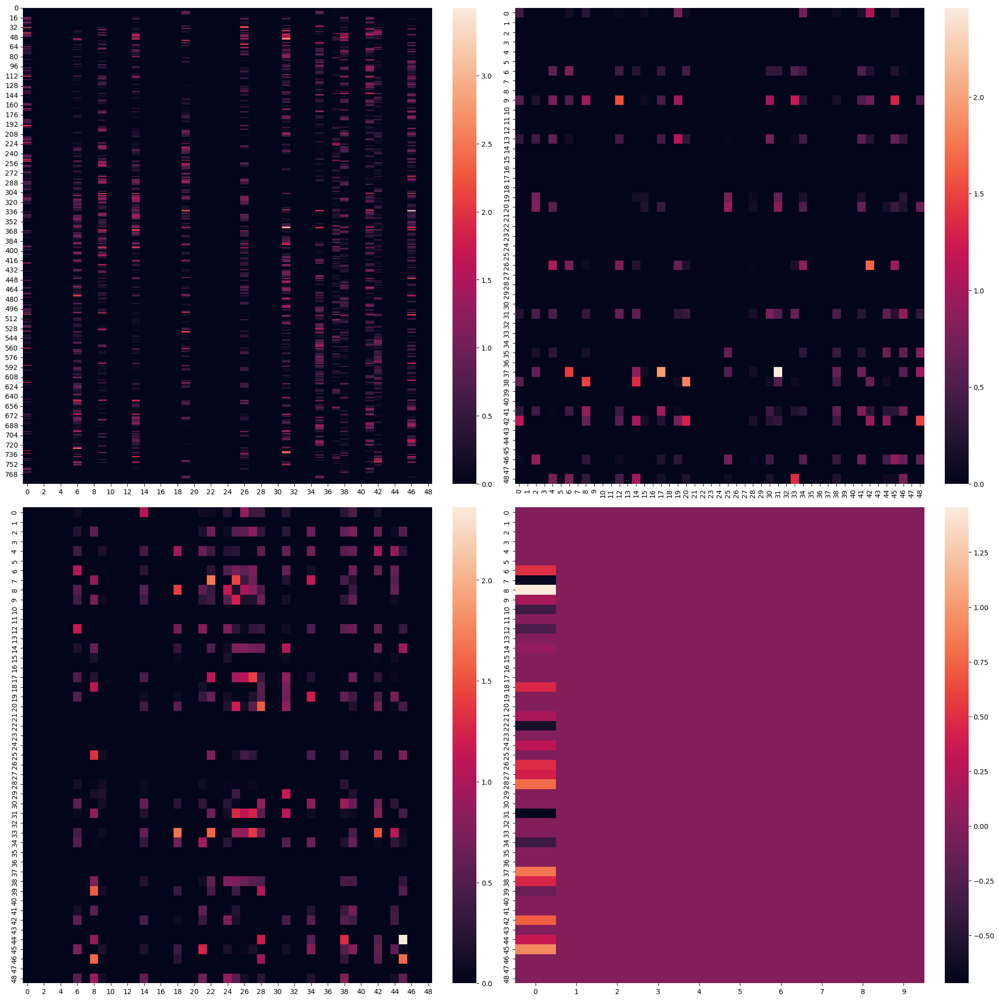

In [13]:
fig, axs = plt.subplots(nrows=2, ncols=2, constrained_layout=True, figsize=(20,20))
sns.heatmap(pd.DataFrame(slc.D1), ax=axs[0,0])
sns.heatmap(pd.DataFrame(slc.D2), ax=axs[0,1])
sns.heatmap(pd.DataFrame(slc.D3), ax=axs[1,0])
sns.heatmap(pd.DataFrame(slc.D4), ax=axs[1,1])

# Tangling Identification: Imbalance (TI-I).

First, the algorithm gets the examples that do not belong to the module.

In [14]:
digit=[]
for k in labs:
    if(k!=j):
        temp=xT[yT==k]
        temp=temp[0:1]
        for u in temp:
            digit.append(u)
np.random.shuffle(digit)

In [15]:
len(digit)

9

For each class, the algorithm gets only one example.
- shuffle should have happened before.

In [16]:
mc = 0
for x in digit:
    W1, W2, W3, W4, b1, b2, b3, b4= slc.dynamicmodify(slicingModel,x, mc,sx,sy, debug=True)
    mc=mc+1
    if np.count_nonzero(slc.D4) < 45:
        logging.info(f"Output Layer's valid weights are below threshold! Reseting weights.")
        #print("Breaking at mc ", mc,np.count_nonzero(slc.D2))
        slc.first = True

In the dynamicmodify method, the algorithm computes the neurons values - without using the model.

```python
X = x.reshape(img_rows*img_cols,)
X1 = np.dot(X,self.W1)
X1 = np.add(X1, self.b1)
X2 = np.dot(X1,self.W2)
X2 = np.add(X2,self.b2)
X3 = np.dot(X2,self.W3)
X3 = np.add(X3,self.b3)
X4 = np.dot(X3,self.W4)
X4 = np.add(X4,self.b4)
```

Notice that the input of the next layer does not consider the activation function. It is computed only afterwards:

```python
X4 = self.softmax(X4)
X1[X1<0]=0
for i in range(X1.shape[0]):
    ...

X2[X2<0]=0
for i in range(X2.shape[0]):
    ...

X3[X3<0]=0
for i in range(X3.shape[0]):
    ...

for i in range(X4.shape[0]):
```

In [17]:
import pandas as pd
path = "data/intermediate"

def concat_series_tii(param, path):
    result = pd.DataFrame()
    for index, file in [(file.split('_')[0], file) for file in os.listdir(path) if param in file and '_tii' in file]:
        df = pd.read_csv(os.path.join(path, file))
        
        if type(df) == pd.core.frame.DataFrame:
            df = df.drop(columns=['Unnamed: 0']).assign(digit=index)
            result = pd.concat([result, df])
        else:
            df = df['0'].rename(index)
            result = pd.concat([result, df], axis=1)
        
    
    return result


tii_d1 = concat_series_tii('dd1', path)
print(f"Shape of d1: {tii_d1.shape}")
tii_d2 = concat_series_tii('dd2', path)
print(f"Shape of d2: {tii_d2.shape}")
tii_d3 = concat_series_tii('dd3', path)
print(f"Shape of d3: {tii_d3.shape}")
tii_d4 = concat_series_tii('dd4', path)
print(f"Shape of d4: {tii_d4.shape}")

tii_X1 = concat_series_tii('X1', path)
print(f"Shape of X1: {tii_X1.shape}")
tii_X2 = concat_series_tii('X2', path)
print(f"Shape of X2: {tii_X2.shape}")
tii_X3 = concat_series_tii('X3', path)
print(f"Shape of X3: {tii_X3.shape}")
tii_X4 = concat_series_tii('X4', path)
print(f"Shape of X4: {tii_X4.shape}")

tii_D1 = concat_series_tii('D1', path)
print(f"Shape of D1: {tii_D1.shape}")
tii_D2 = concat_series_tii('D2', path)
print(f"Shape of D2: {tii_D2.shape}")
tii_D3 = concat_series_tii('D3', path)
print(f"Shape of D3: {tii_D3.shape}")
tii_D4 = concat_series_tii('D4', path)
print(f"Shape of D4: {tii_D4.shape}")

Shape of d1: (441, 2)
Shape of d2: (441, 2)
Shape of d3: (441, 2)
Shape of d4: (90, 2)
Shape of X1: (441, 2)
Shape of X2: (441, 2)
Shape of X3: (441, 2)
Shape of X4: (90, 2)
Shape of D1: (7056, 50)
Shape of D2: (441, 50)
Shape of D3: (441, 50)
Shape of D4: (441, 11)


In [18]:
def fix_outputs_df(df):
    df['output'] = df['0']
    df = df.reset_index(names=['neuron']).drop(columns=['0'])
    df.digit = df.digit.astype(int)
    return df

def fix_updated_weights_df(df):
    df = df.reset_index(names=['neuron'])
    df.digit = df.digit.astype('int')
    df['weight'] = df.groupby('digit')['digit'].transform('cumcount')
    df = df.sort_values(['digit', 'weight'])
    return df

In [19]:
tii_X1 = fix_outputs_df(tii_X1)
tii_X2 = fix_outputs_df(tii_X2)
tii_X3 = fix_outputs_df(tii_X3)
tii_X4 = fix_outputs_df(tii_X4)

tii_D1 = fix_updated_weights_df(tii_D1)
tii_D2 = fix_updated_weights_df(tii_D2)
tii_D3 = fix_updated_weights_df(tii_D3)
tii_D4 = fix_updated_weights_df(tii_D4)

## Neurons Outputs

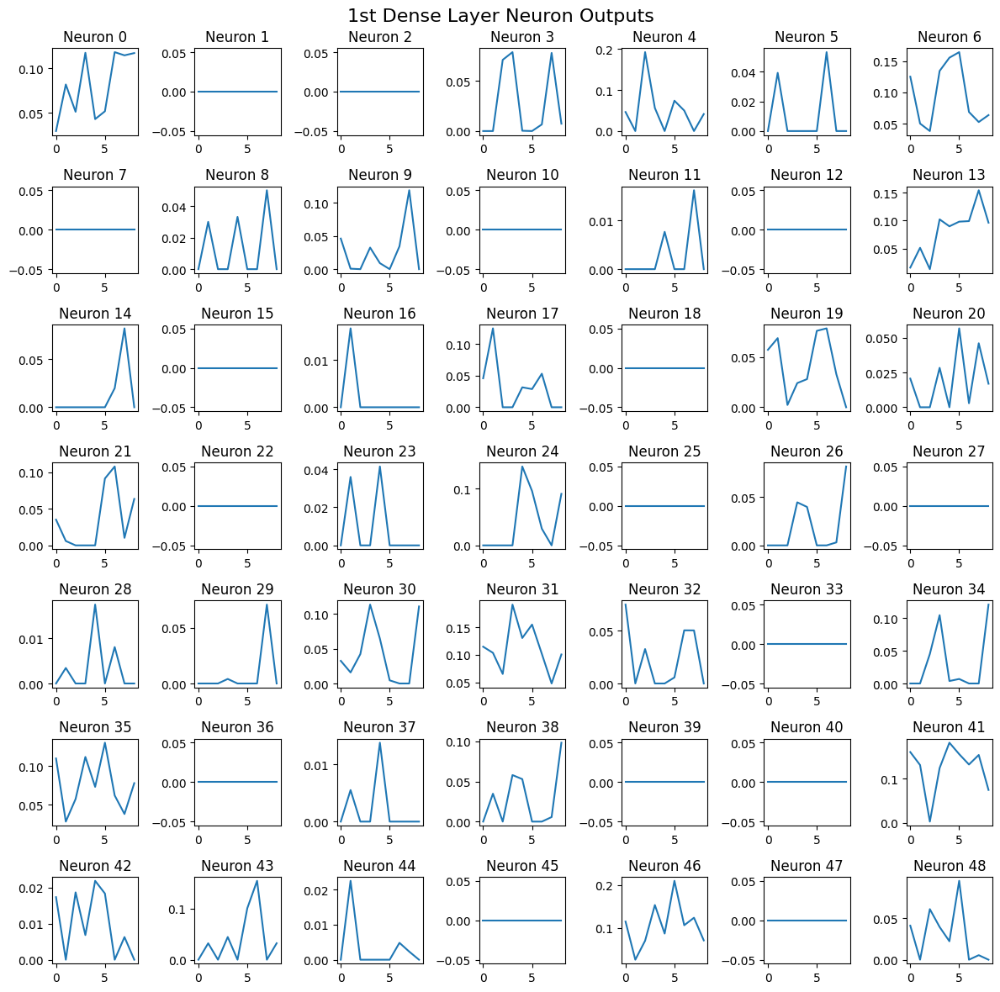

In [14]:
fig, axes = plt.subplots(7, 7, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    tii_X1[tii_X1.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("1st Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

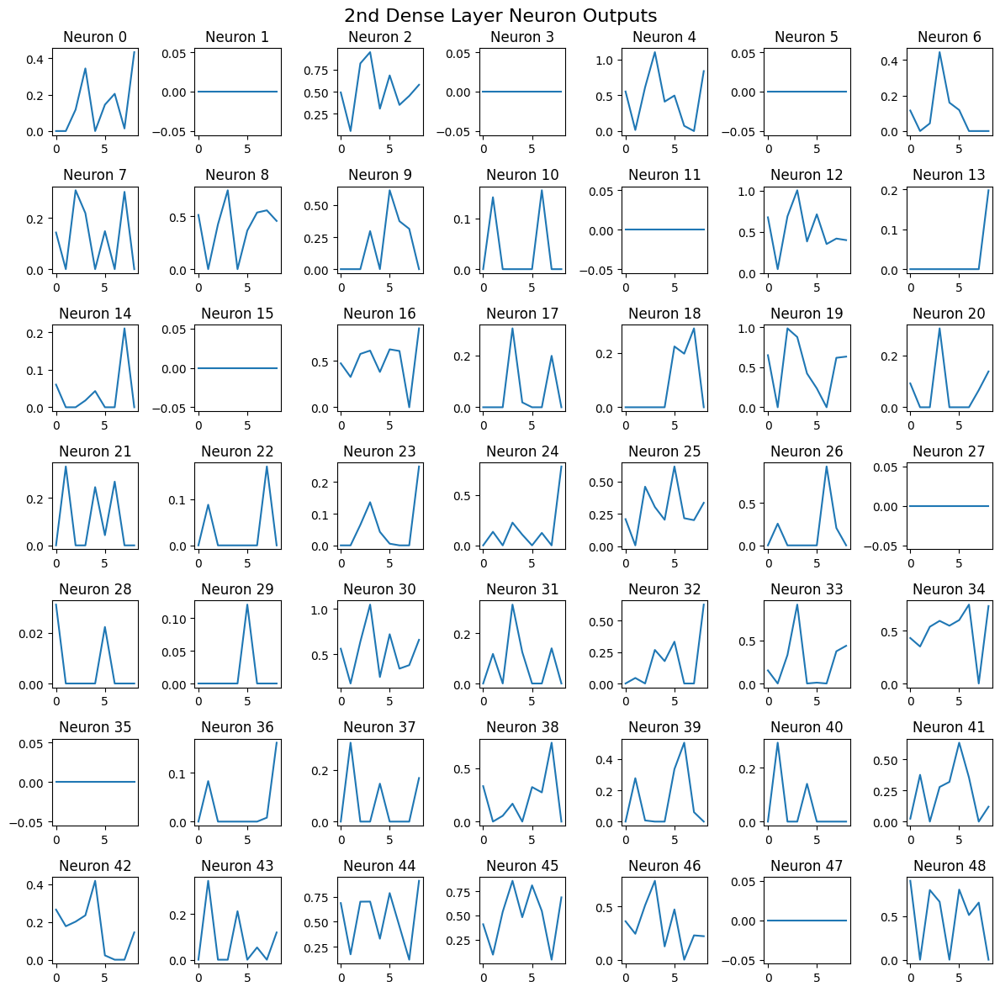

In [15]:
fig, axes = plt.subplots(7, 7, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    tii_X2[tii_X2.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("2nd Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

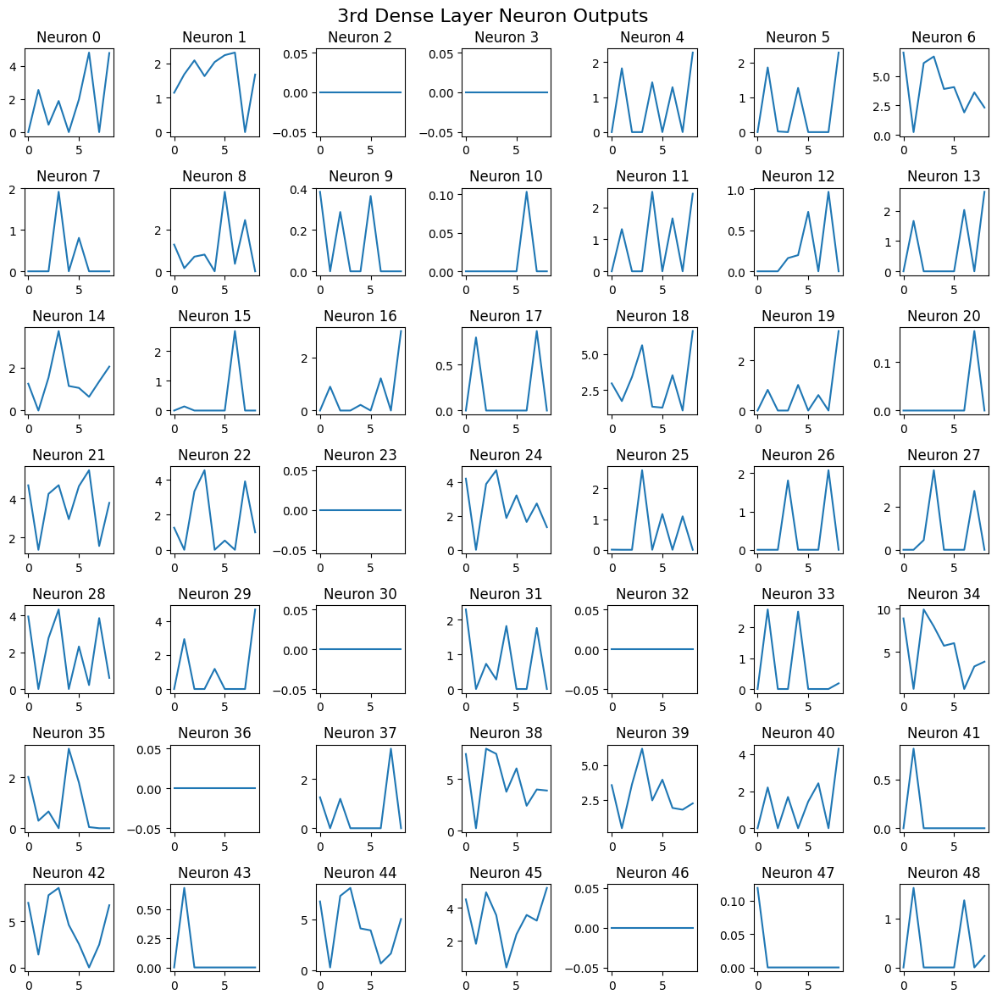

In [16]:
fig, axes = plt.subplots(7, 7, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    tii_X3[tii_X3.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("3rd Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

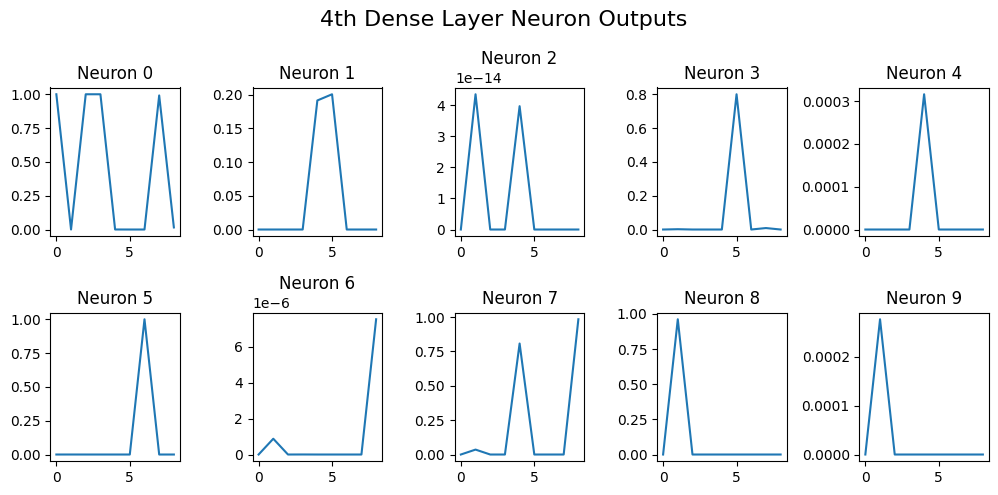

In [17]:
fig, axes = plt.subplots(2, 5, figsize=(10, 5))

for i, ax in enumerate(axes.flat):
    tii_X4[tii_X4.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("4th Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

- Some neurons are not activated at all. 
- Because of the ReLU function, no output value is below zero. 
- Some Neurons behave as expected
- More neurons hit zero.
- In the output layer, the values of the neuron 2 are the smallest, since the digits were chosen avoiding this label.

# 1st Dense Layer

## Neurons Outputs

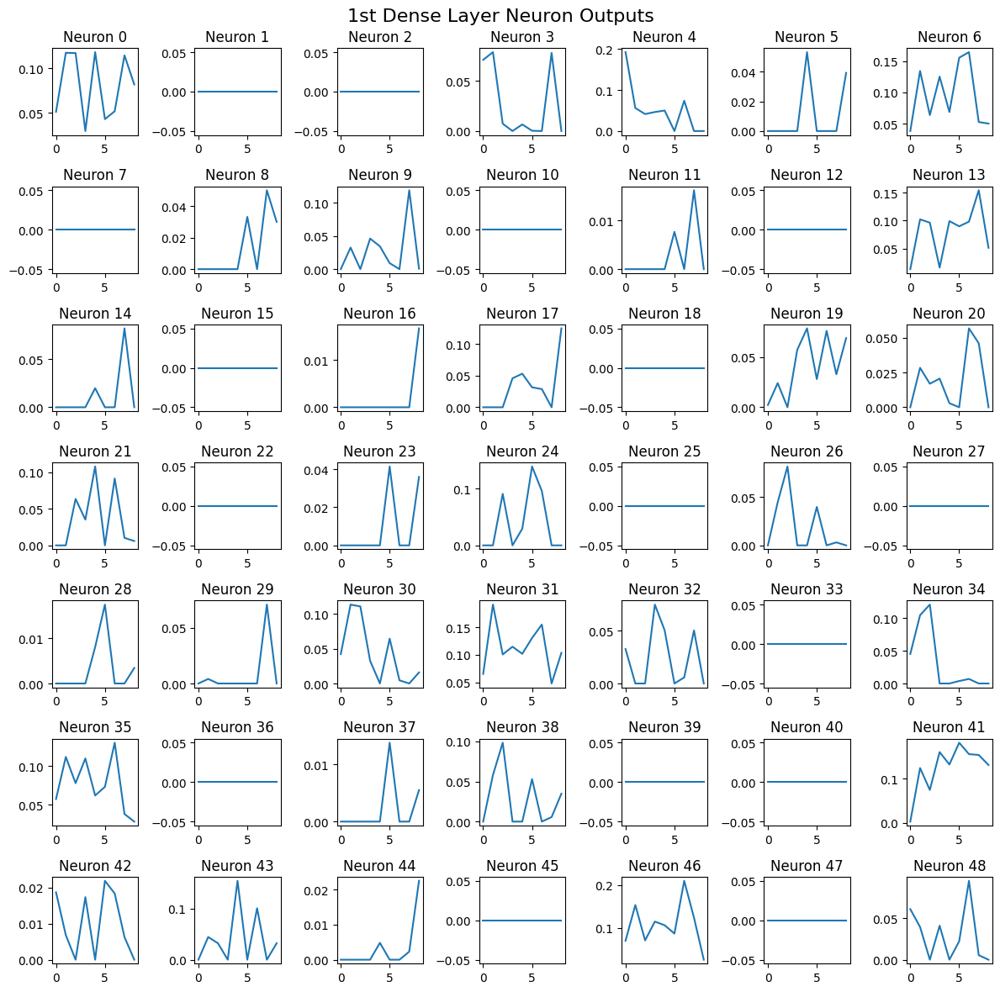

In [26]:
fig, axes = plt.subplots(7, 7, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    tii_X1[tii_X1.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("1st Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

## Regular Neuron

In [18]:
r_neuron = 0

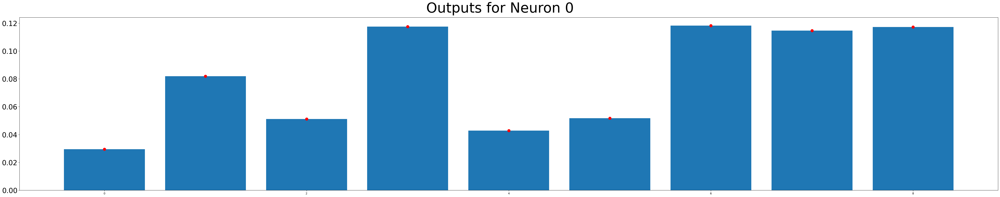

In [19]:
output_r = tii_X1[tii_X1.neuron == r_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_r.plot(kind='bar', ax=axes)
plt.bar(output_r.digit, output_r.output)
plt.scatter(output_r.digit, output_r.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {r_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

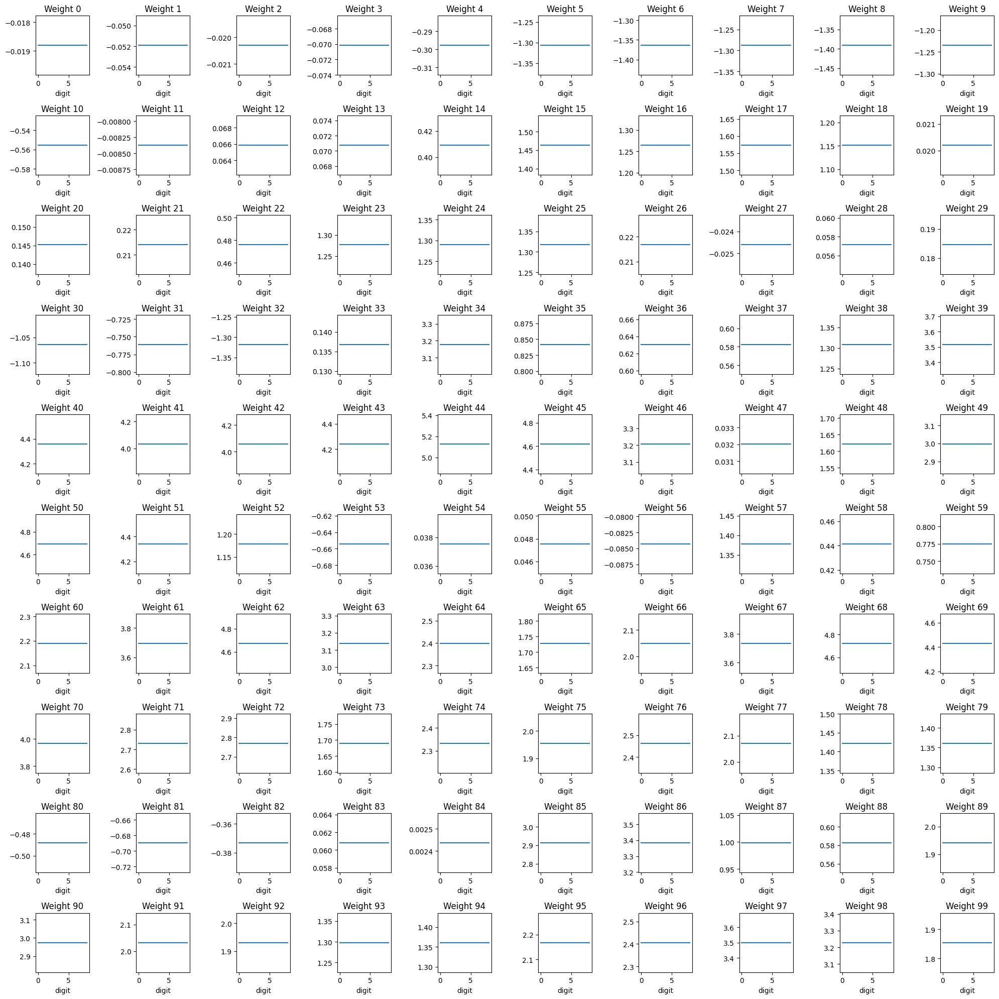

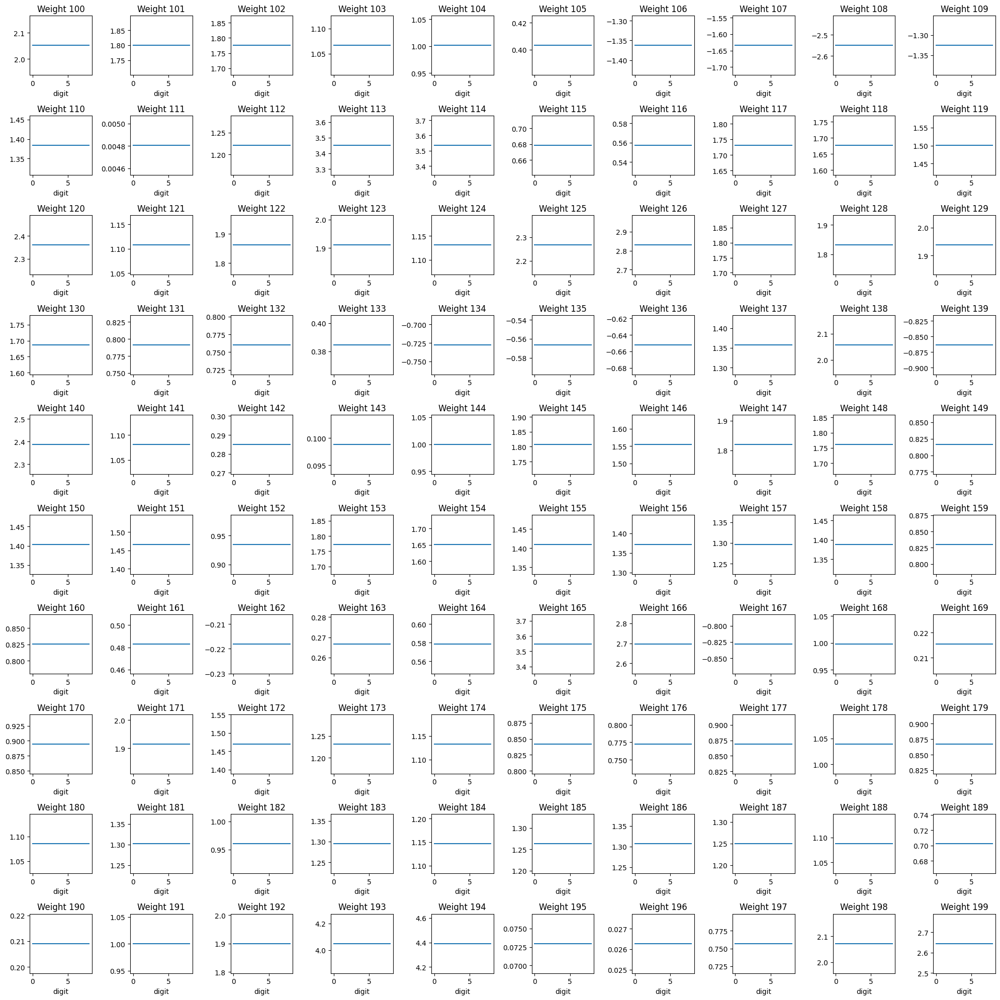

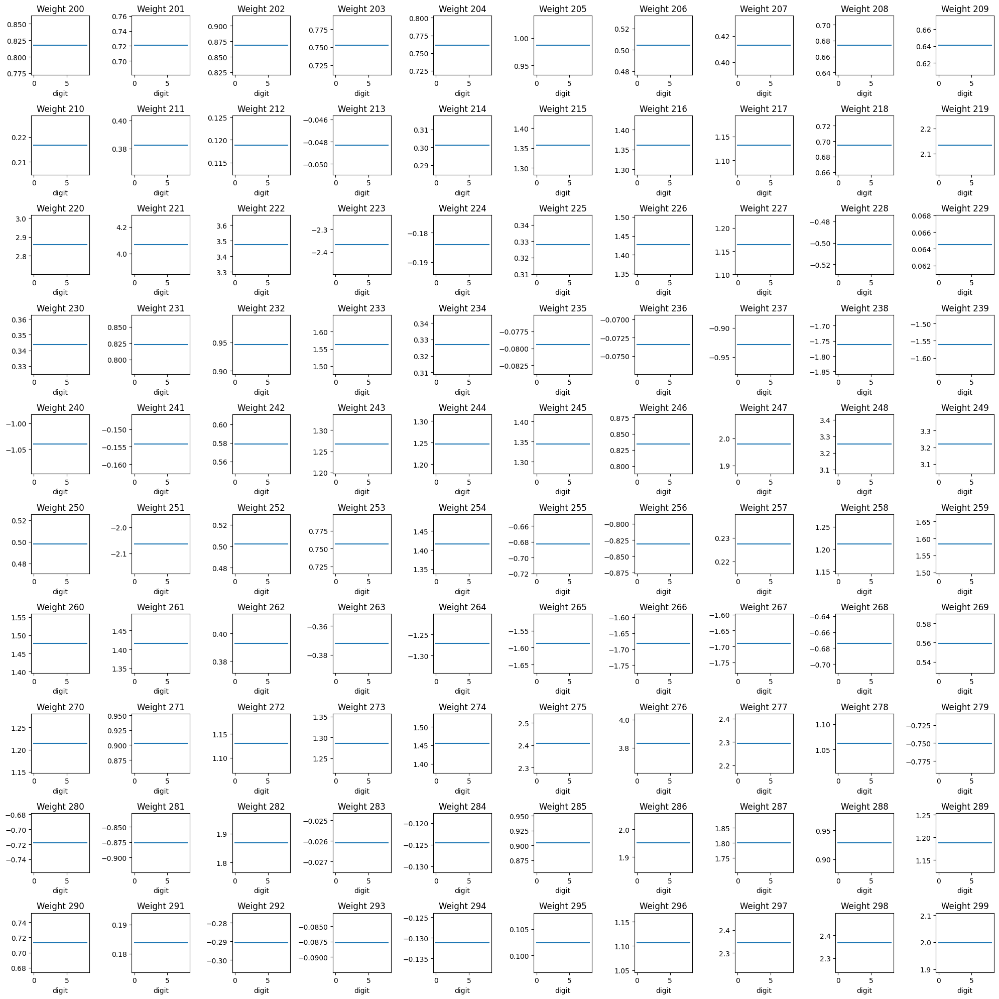

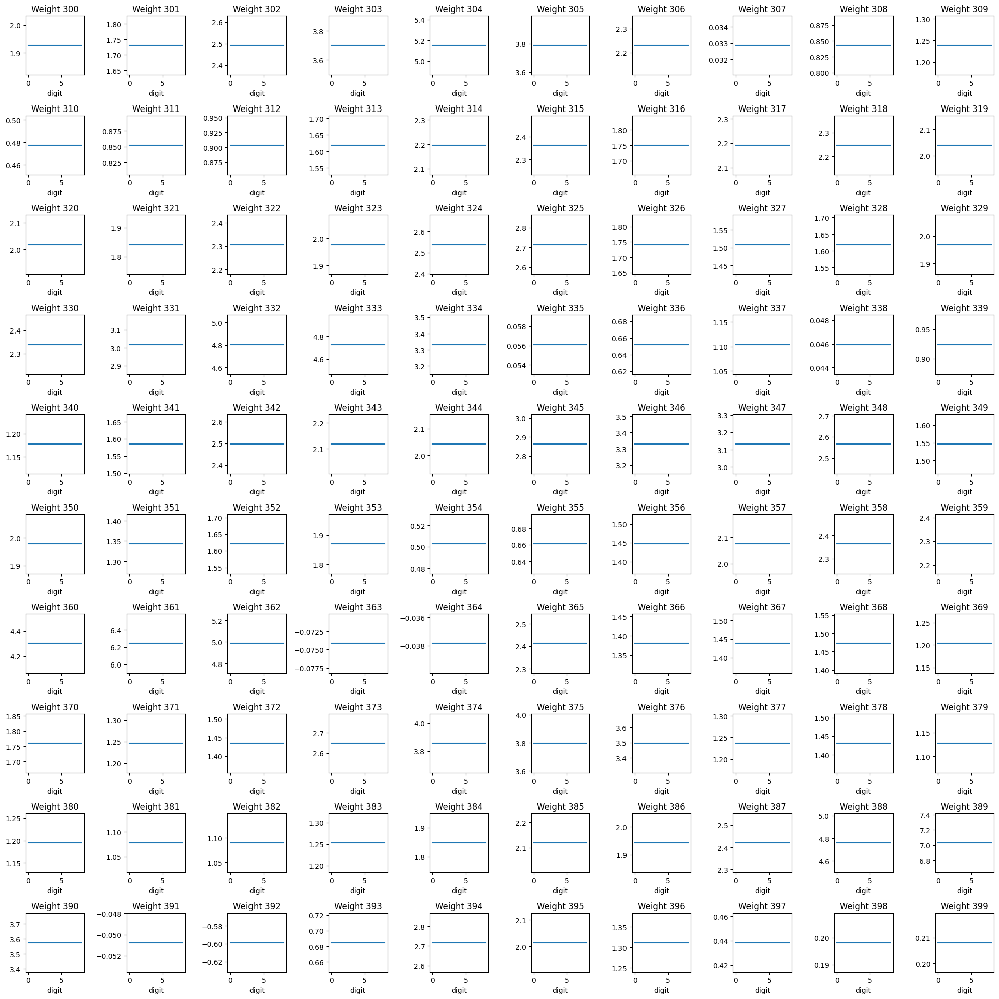

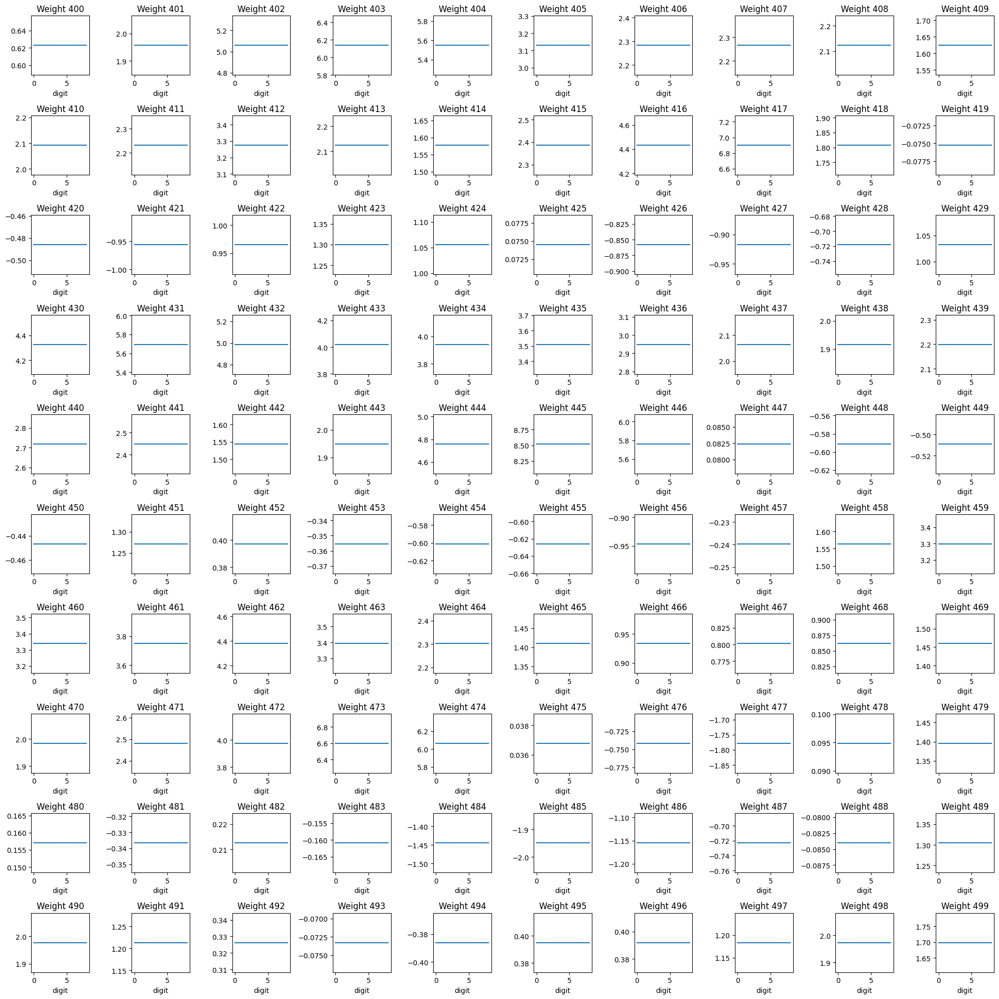

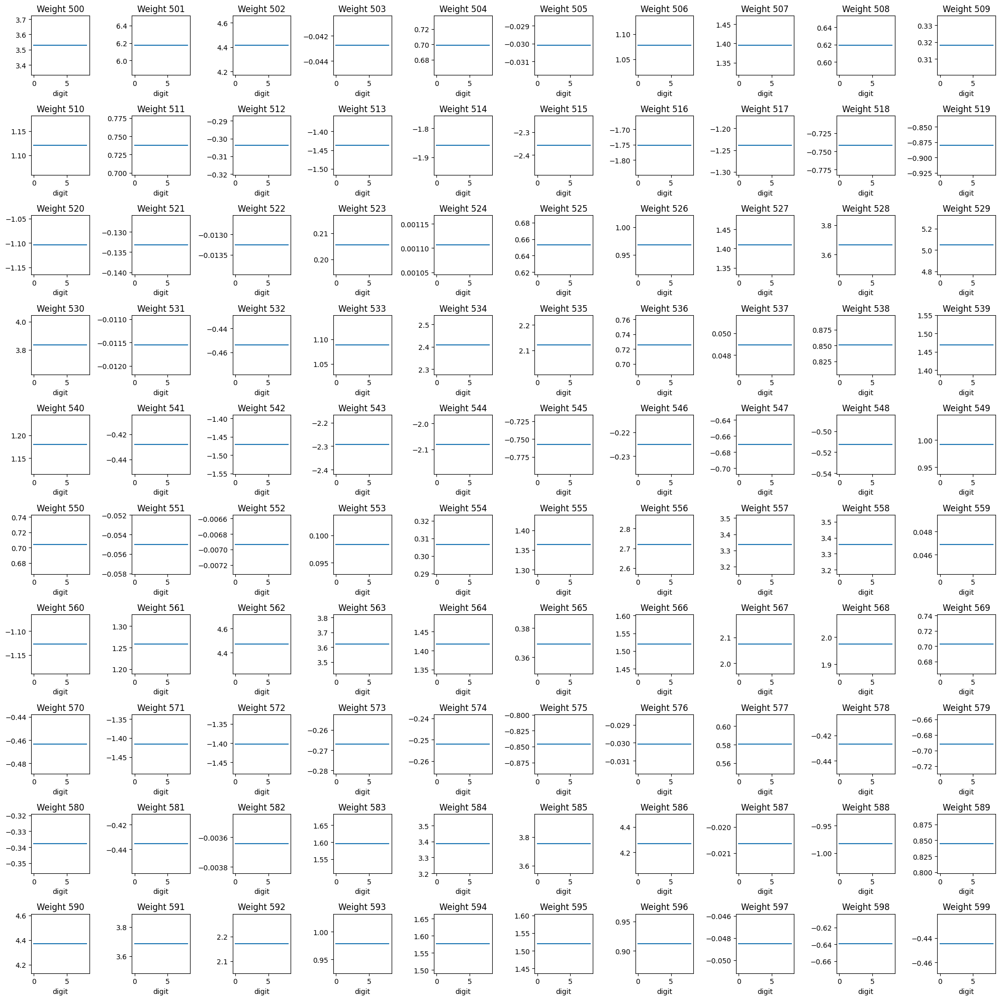

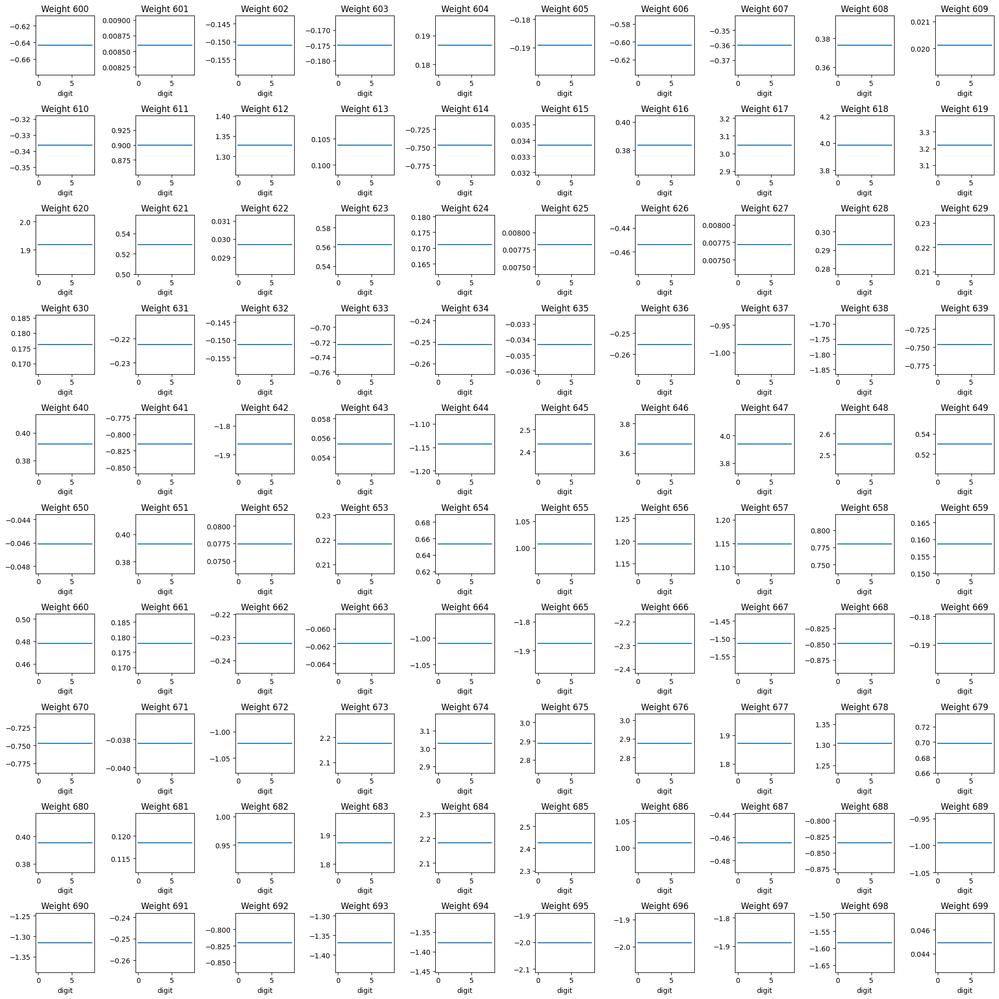

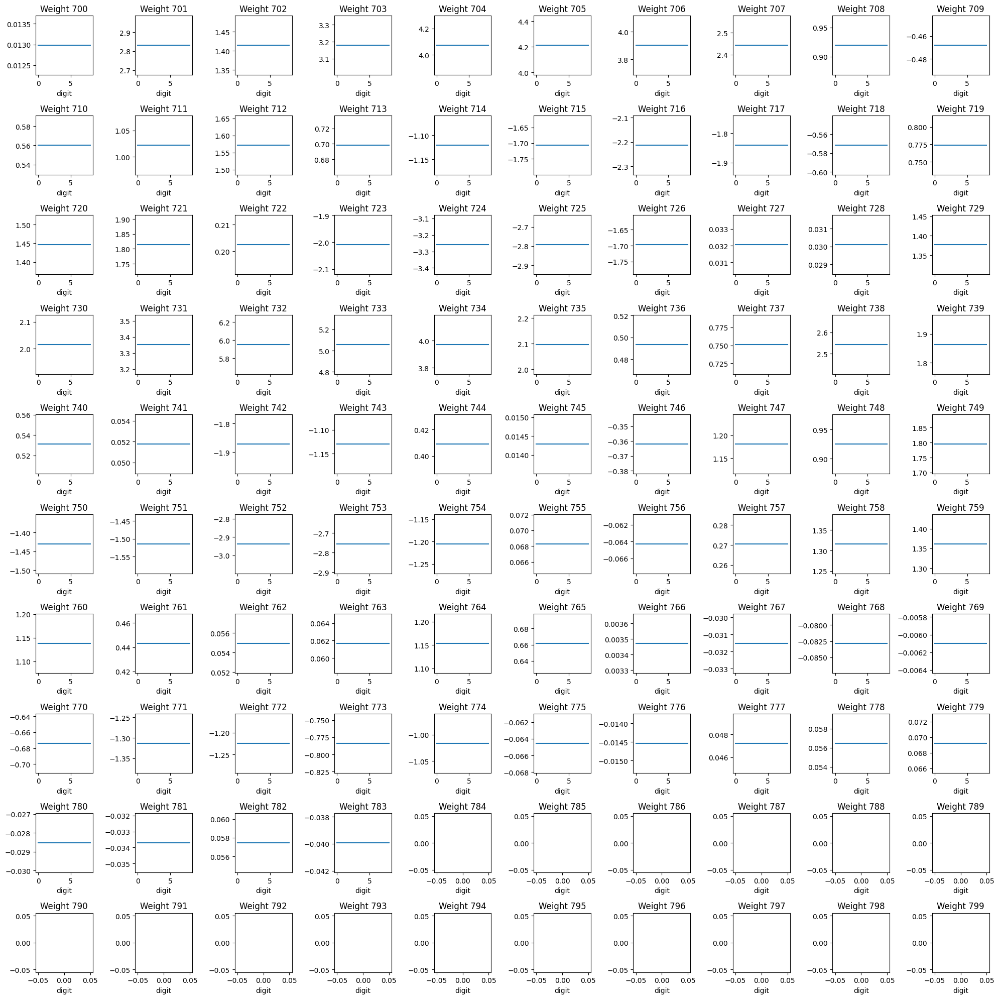

In [ ]:
plot_neuron_weights(tii_D1, r_neuron)
plot_neuron_weights(tii_D1, r_neuron, pad=100)
plot_neuron_weights(tii_D1, r_neuron, pad=200)
plot_neuron_weights(tii_D1, r_neuron, pad=300)
plot_neuron_weights(tii_D1, r_neuron, pad=400)
plot_neuron_weights(tii_D1, r_neuron, pad=500)
plot_neuron_weights(tii_D1, r_neuron, pad=600)
plot_neuron_weights(tii_D1, r_neuron, pad=700)

From the code, if the output of the neuron is greater than zero, the weights are set back to the model weights. Else, they receive the value of the updated weight.
- The CI result is kept only in cases where all the outputs are zero. If a single output is greater than zero, all the weights go back to their original values for that neuron.

## Nonactivated Neuron

In [21]:
na_neuron = 10

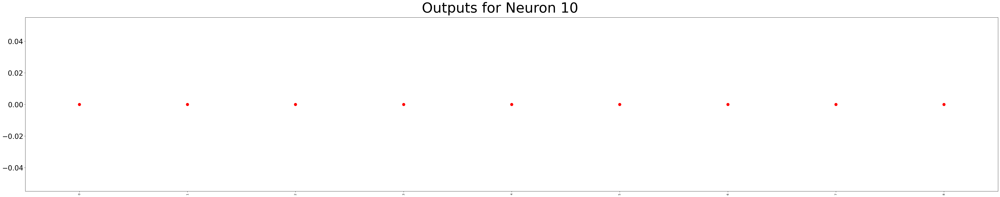

In [22]:
output_na = tii_X1[tii_X1.neuron == na_neuron].output.reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
output_na.plot(kind='bar', ax=axes)
plt.scatter(output_na.index, output_na.values, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {na_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

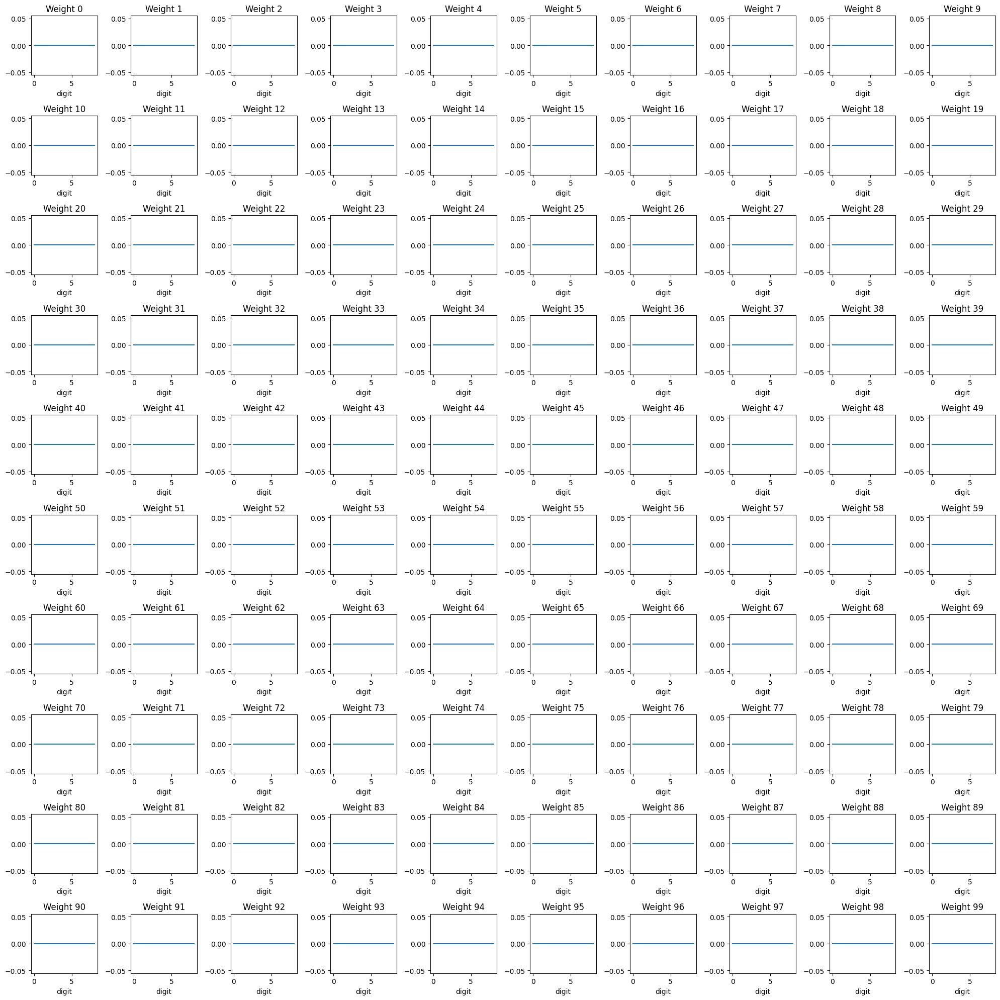

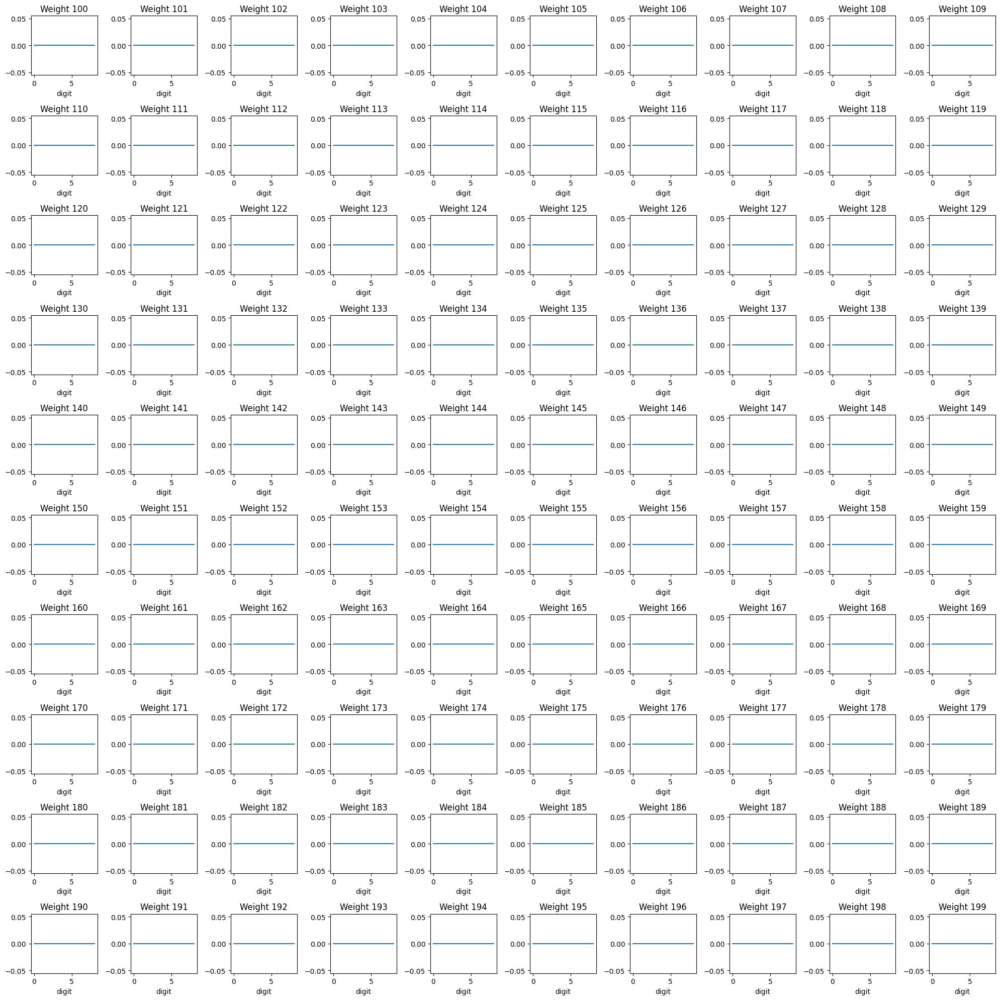

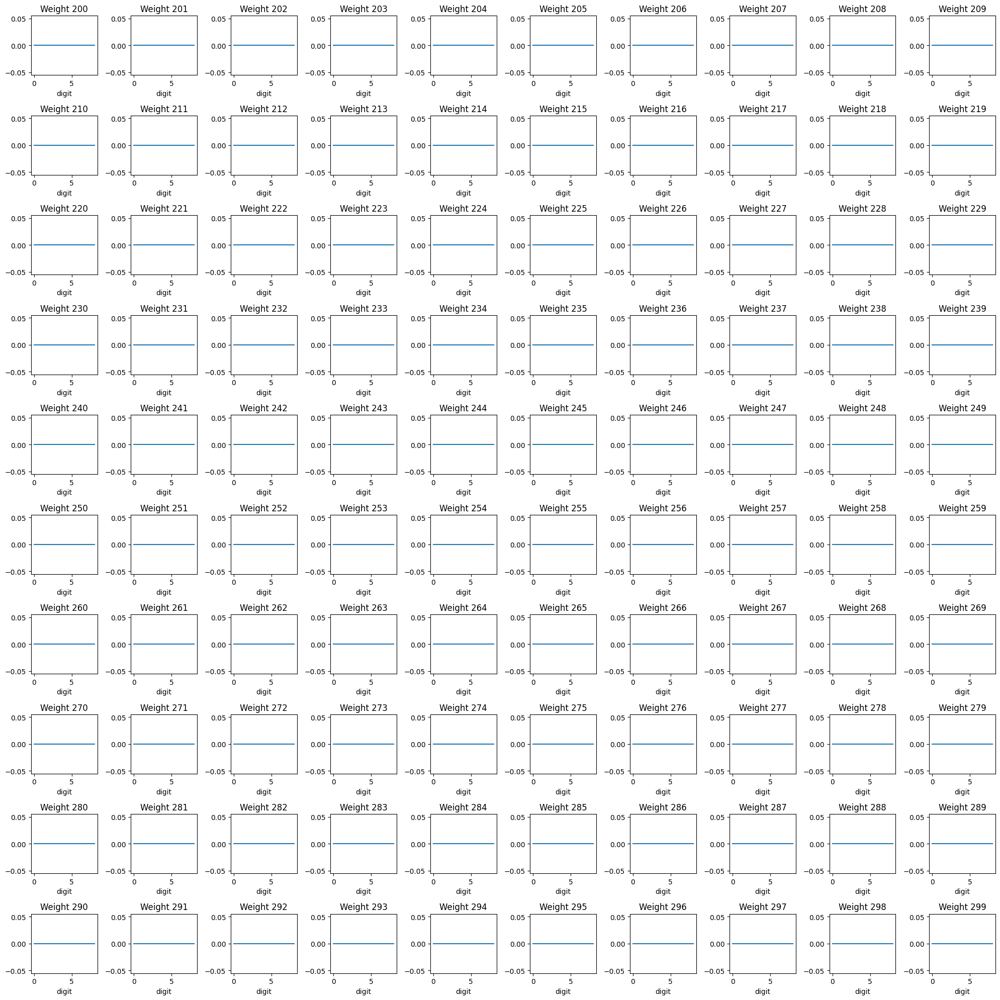

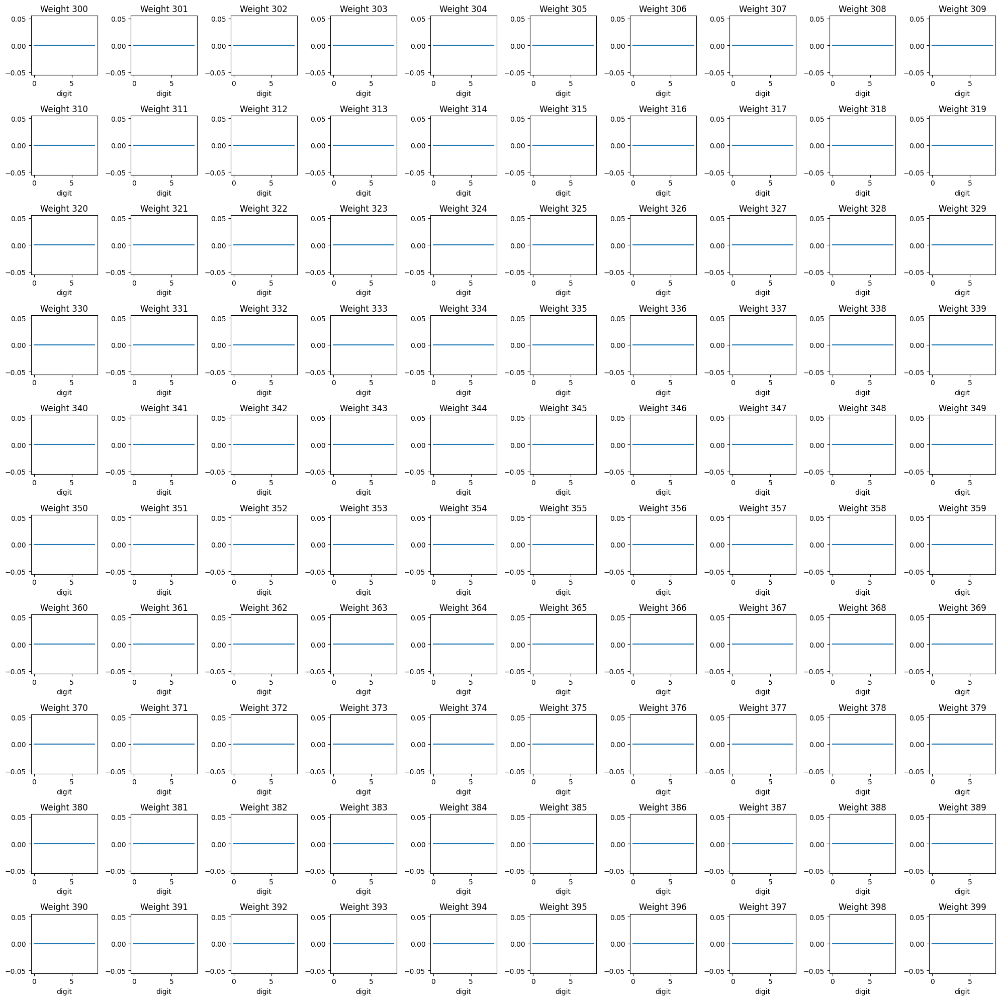

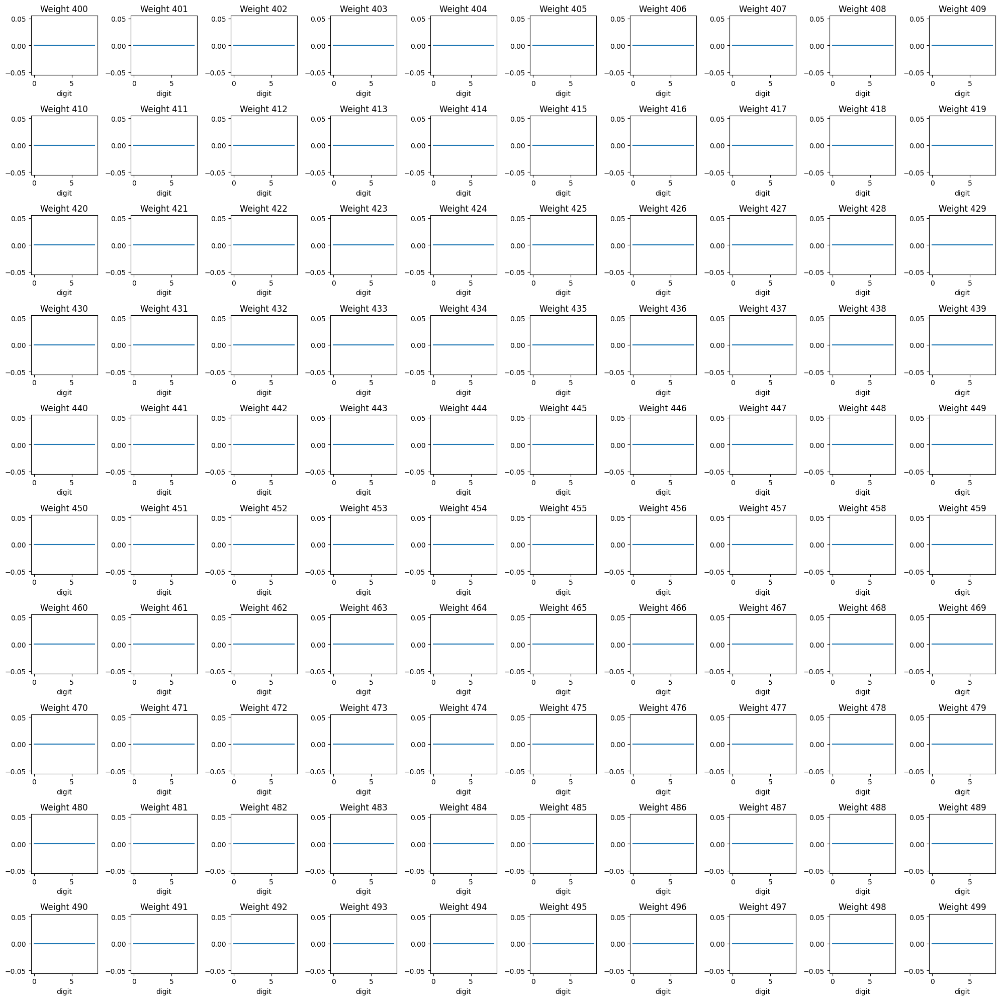

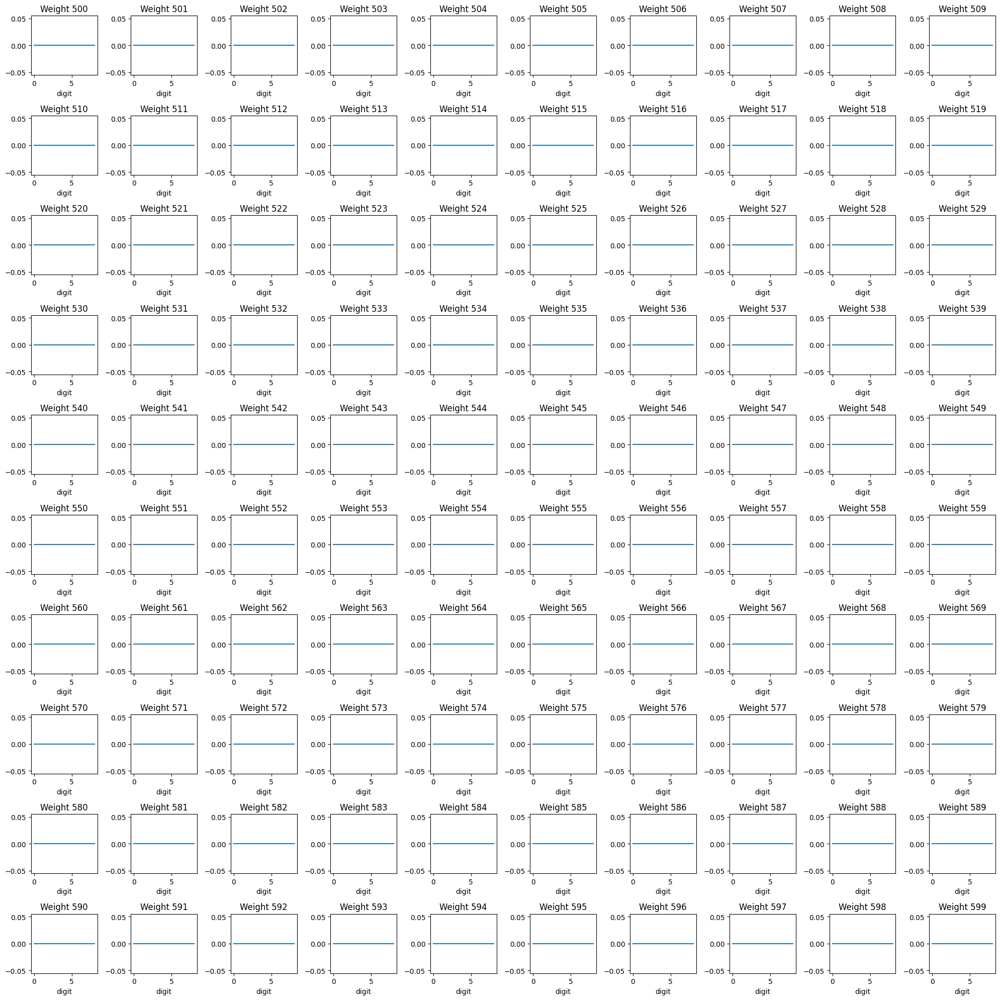

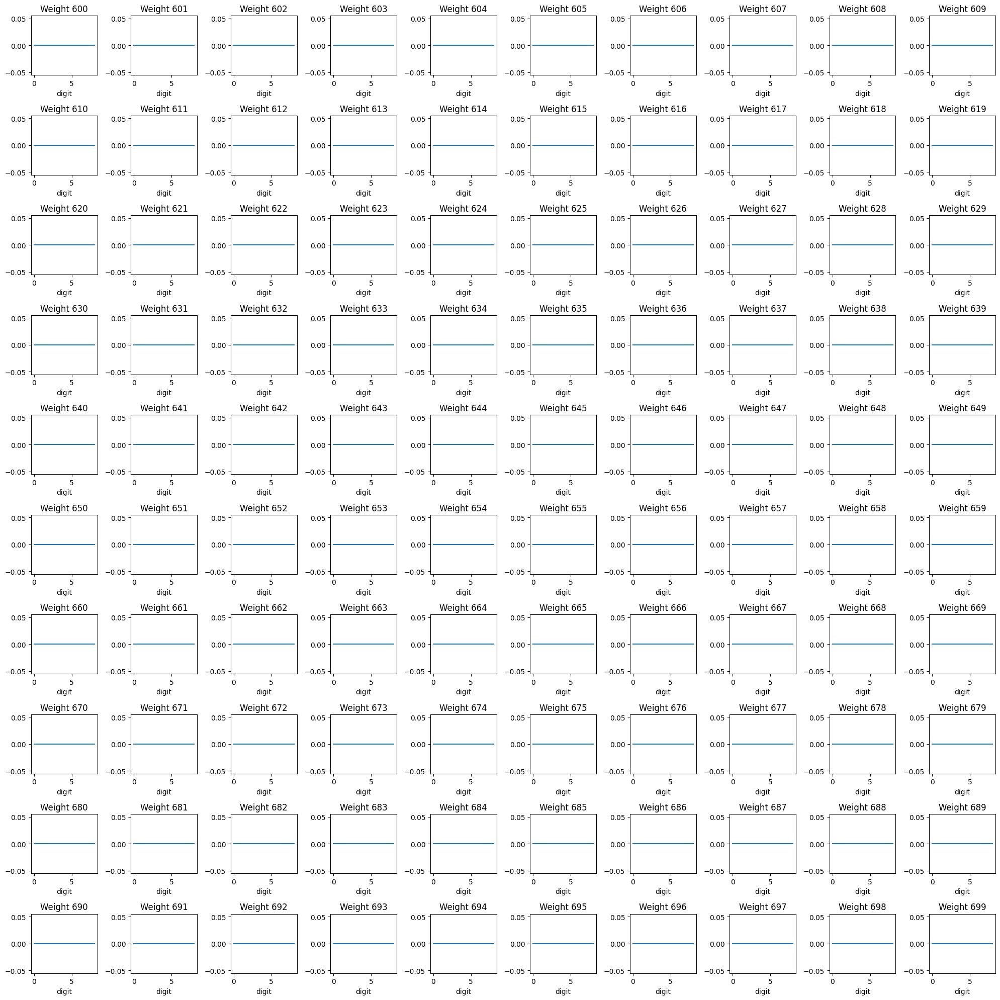

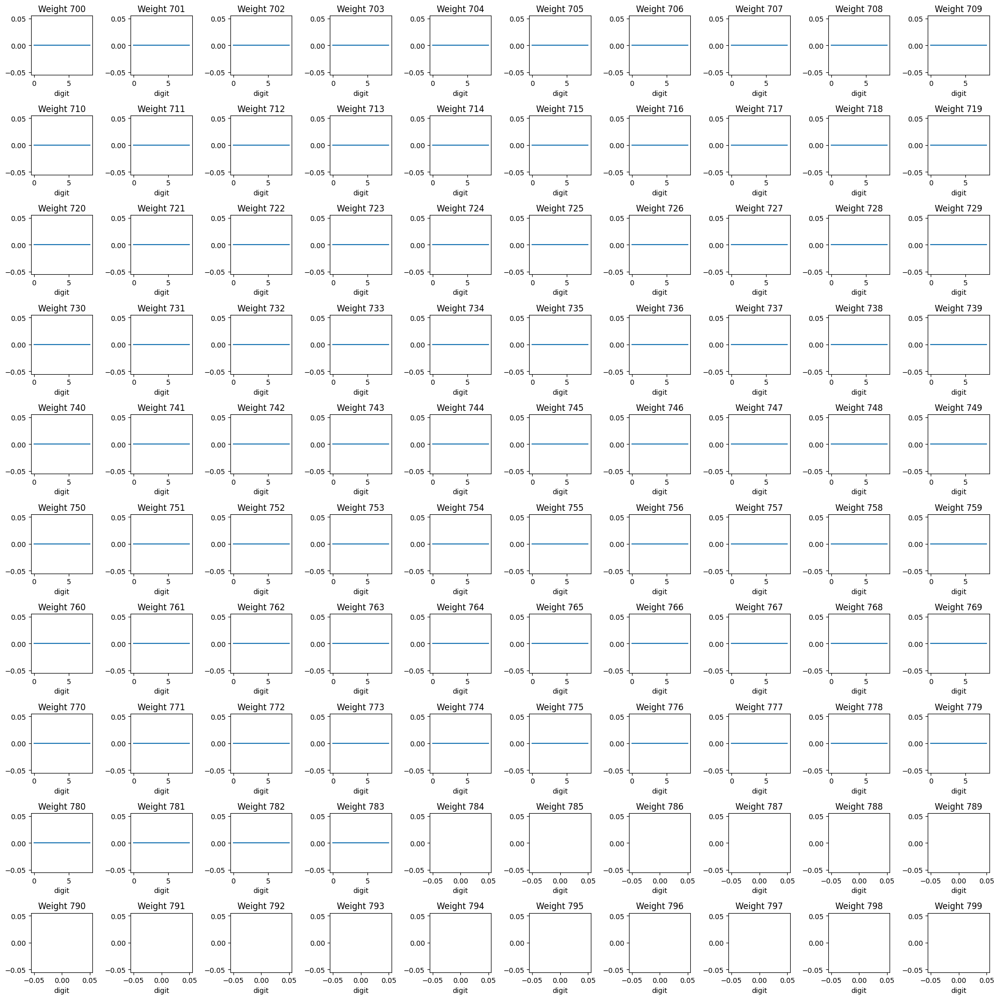

In [23]:
plot_neuron_weights(tii_D1, na_neuron)
plot_neuron_weights(tii_D1, na_neuron, pad=100)
plot_neuron_weights(tii_D1, na_neuron, pad=200)
plot_neuron_weights(tii_D1, na_neuron, pad=300)
plot_neuron_weights(tii_D1, na_neuron, pad=400)
plot_neuron_weights(tii_D1, na_neuron, pad=500)
plot_neuron_weights(tii_D1, na_neuron, pad=600)
plot_neuron_weights(tii_D1, na_neuron, pad=700)

In [26]:
D1[str(na_neuron)].sum()

0.0

All the weights of this neuron were 0 after the CI operation. Thus, since no output was greater than zero, the weights were kept as zero.

## Neurons with Outputs that hit zero

### First Neuron

In [29]:
hz_neuron = 17

In [30]:
tii_X1[tii_X1.neuron == hz_neuron]

,neuron,digit,output
17,17,0,0.045906
66,17,1,0.125041
115,17,2,0.000000
164,17,3,0.000000
213,17,4,0.031627
262,17,5,0.028819
311,17,6,0.053196
360,17,7,0.000000
409,17,8,0.000000


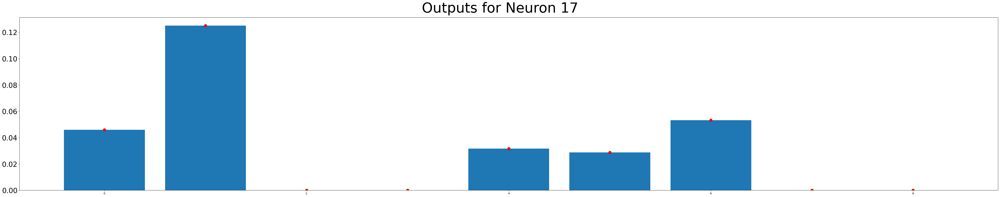

In [31]:
output_hz = tii_X1[tii_X1.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #2. 

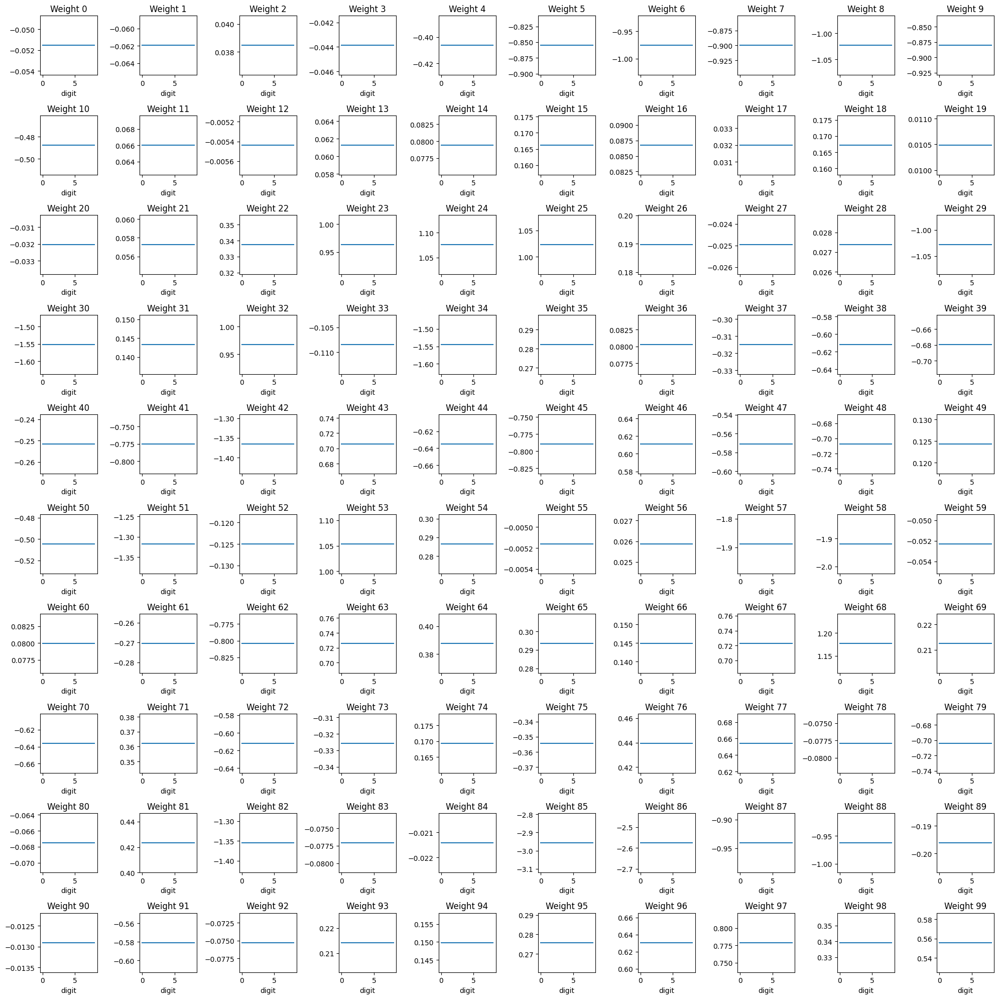

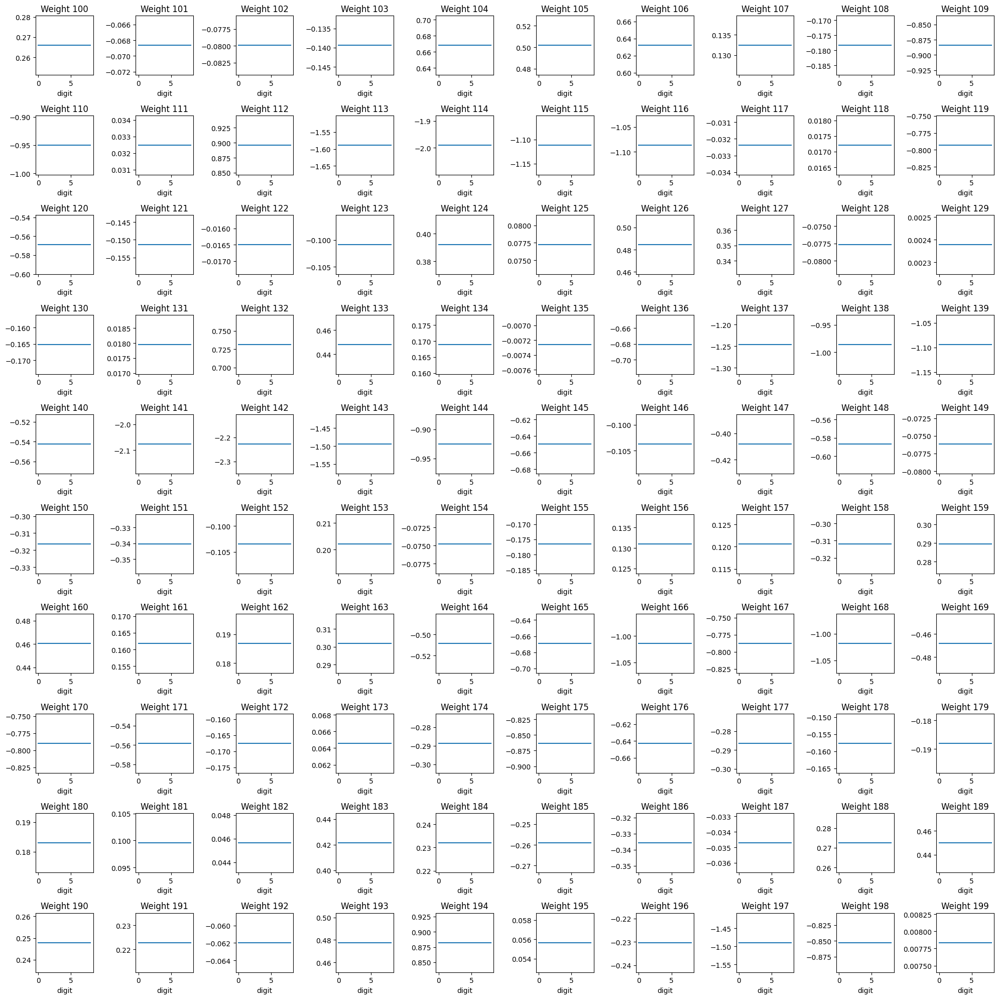

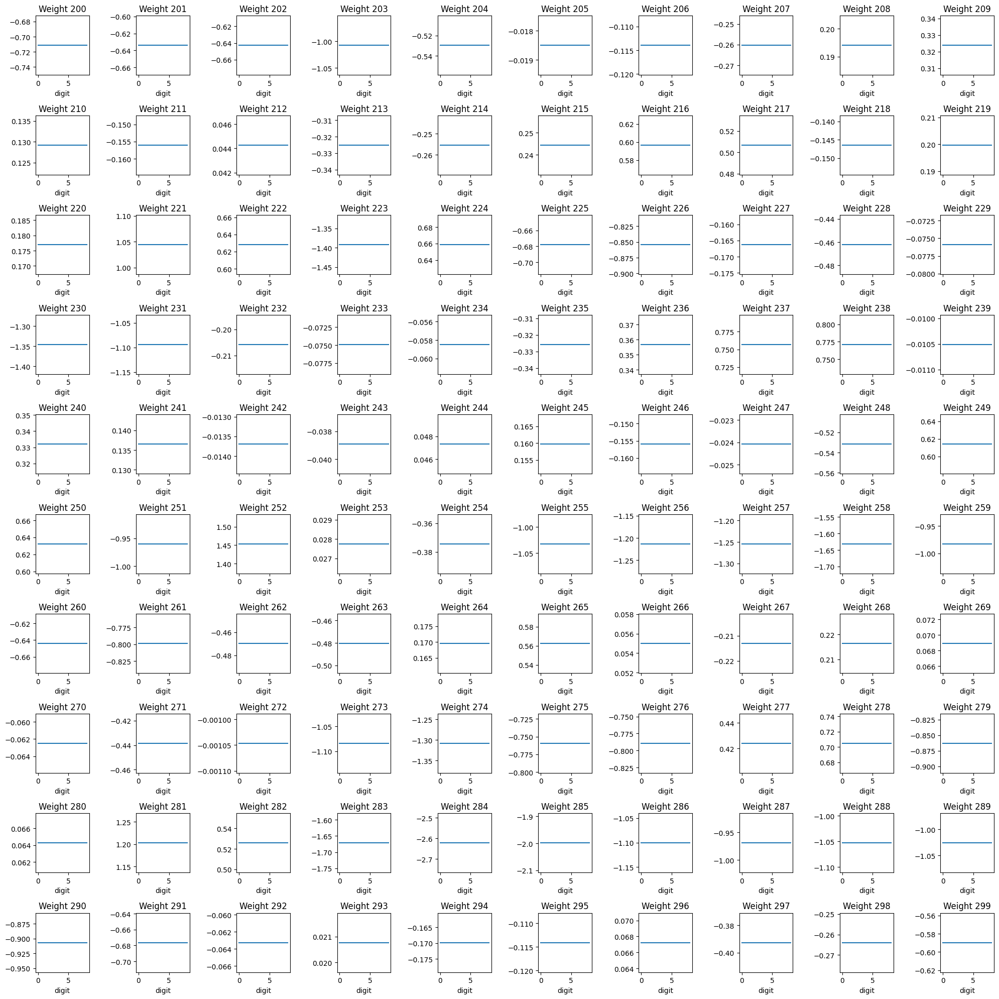

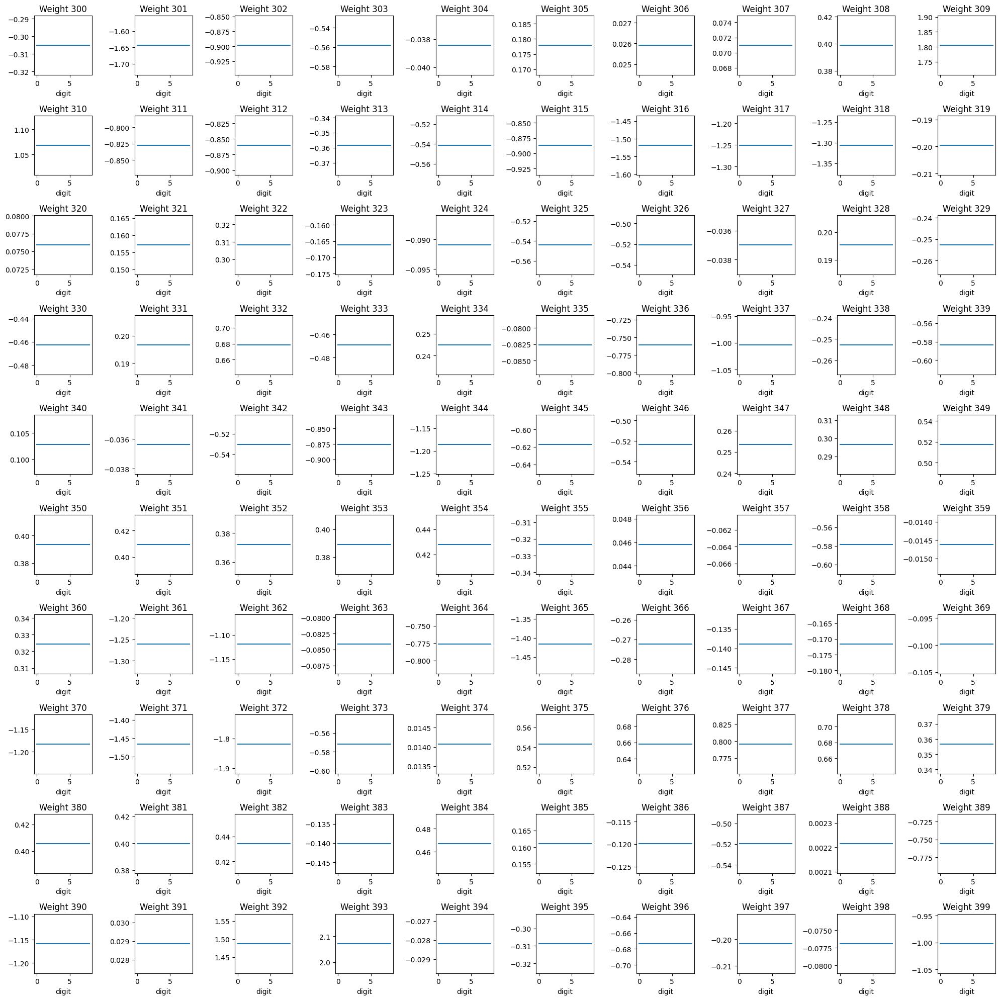

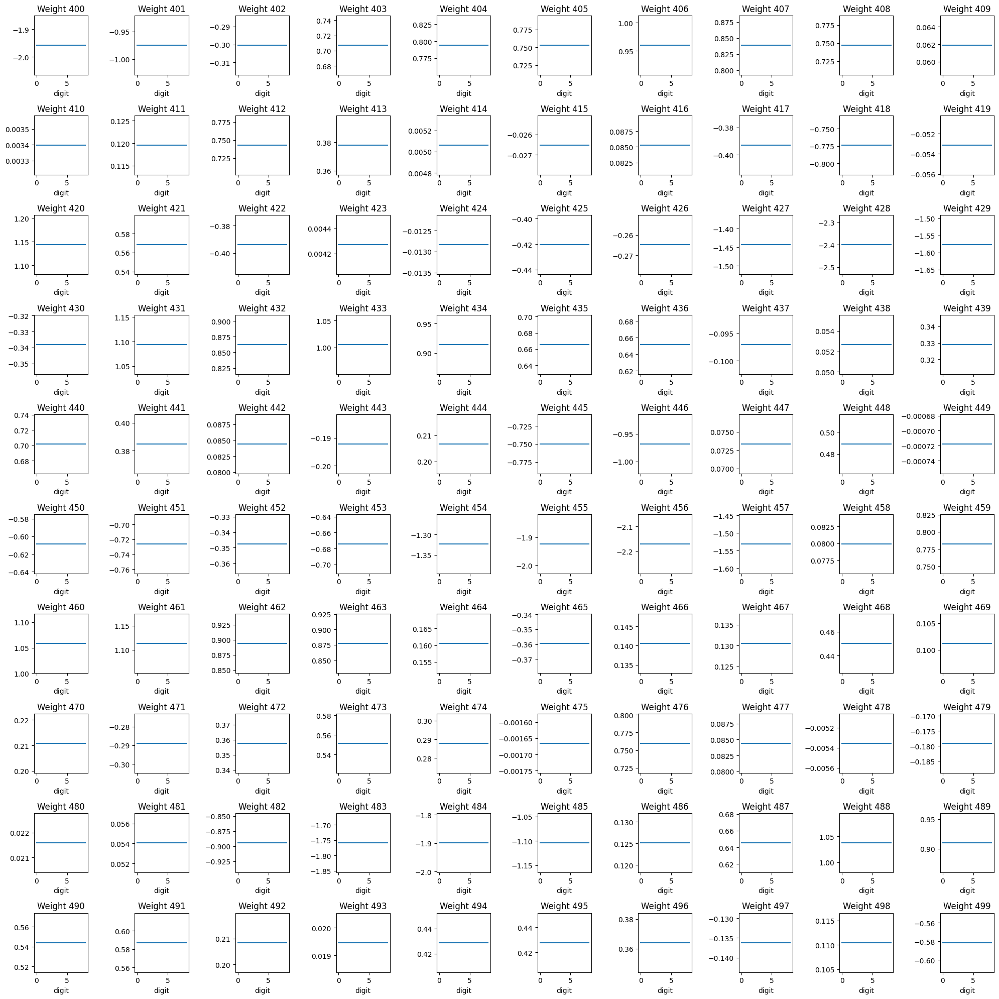

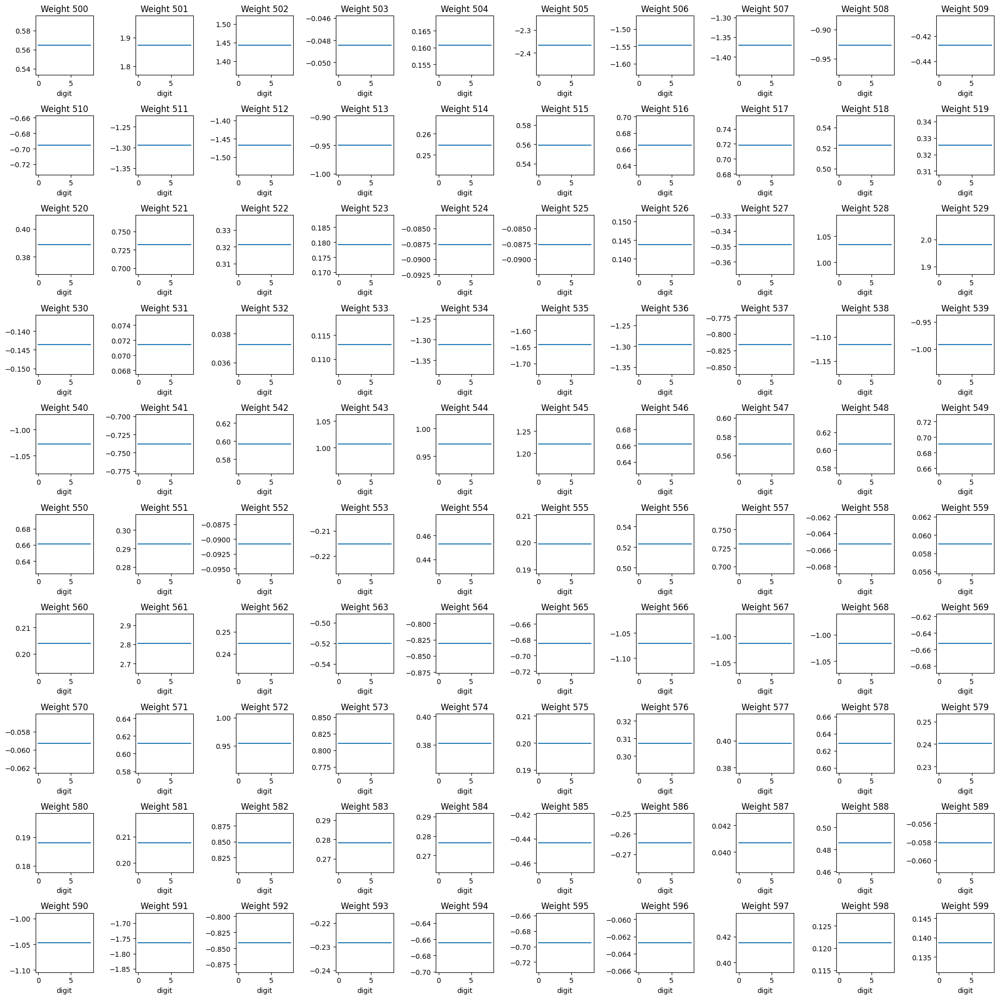

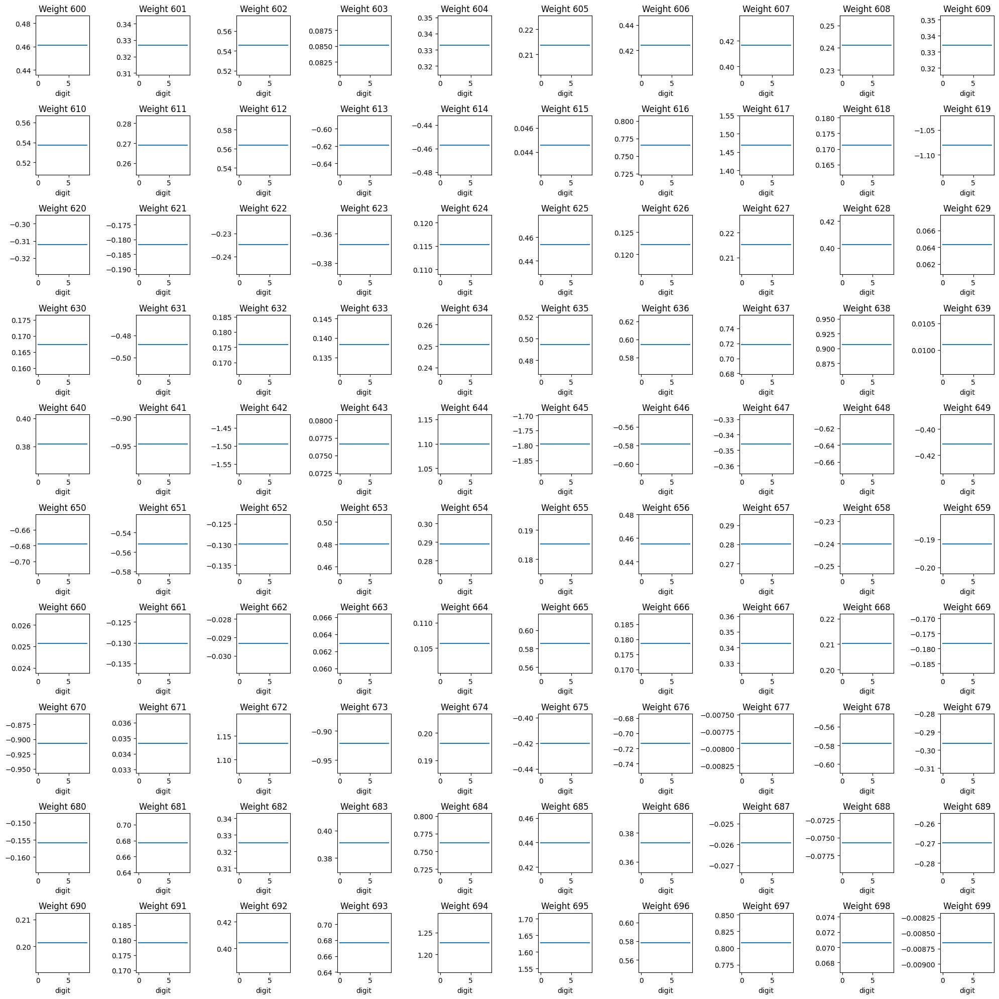

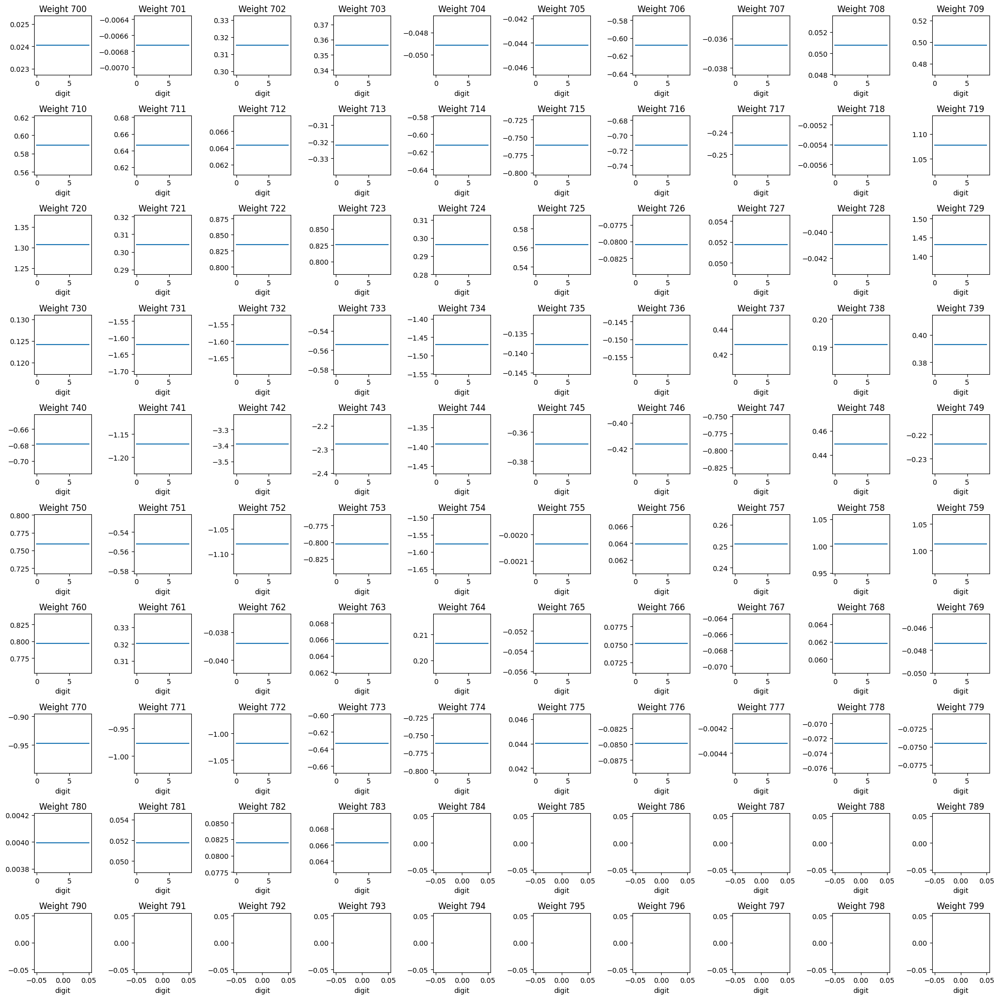

In [32]:
plot_neuron_weights(tii_D1, hz_neuron)
plot_neuron_weights(tii_D1, hz_neuron, pad=100)
plot_neuron_weights(tii_D1, hz_neuron, pad=200)
plot_neuron_weights(tii_D1, hz_neuron, pad=300)
plot_neuron_weights(tii_D1, hz_neuron, pad=400)
plot_neuron_weights(tii_D1, hz_neuron, pad=500)
plot_neuron_weights(tii_D1, hz_neuron, pad=600)
plot_neuron_weights(tii_D1, hz_neuron, pad=700)

Since the first output is greater than 0, the weights go back to their original value.

When the output is zero (example #2), the updated values are the same as the original weight values, which were changed in example #0. So, no updates were made.

### Second Neuron

In [33]:
hz_neuron = 11

In [34]:
tii_X1[tii_X1.neuron == hz_neuron]

,neuron,digit,output
11,11,0,0.000000
60,11,1,0.000000
109,11,2,0.000000
158,11,3,0.000000
207,11,4,0.007699
256,11,5,0.000000
305,11,6,0.000000
354,11,7,0.016276
403,11,8,0.000000


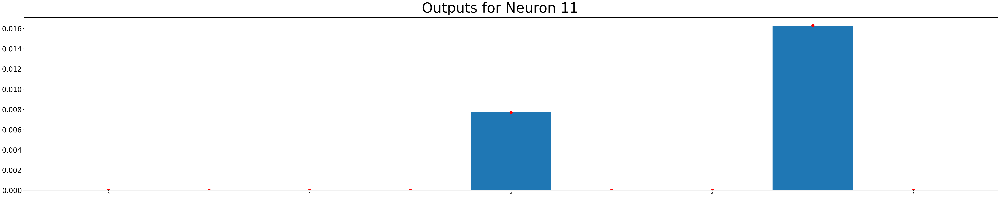

In [35]:
output_hz = tii_X1[tii_X1.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #0. 

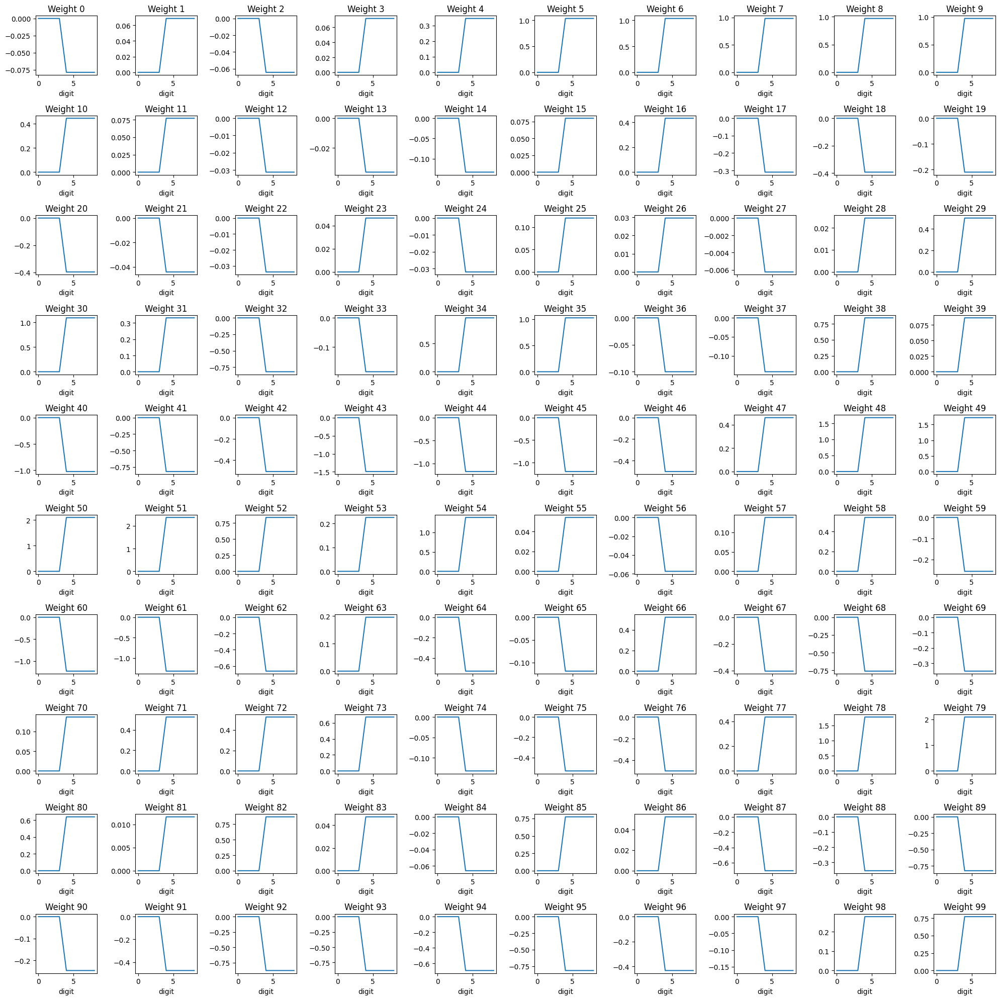

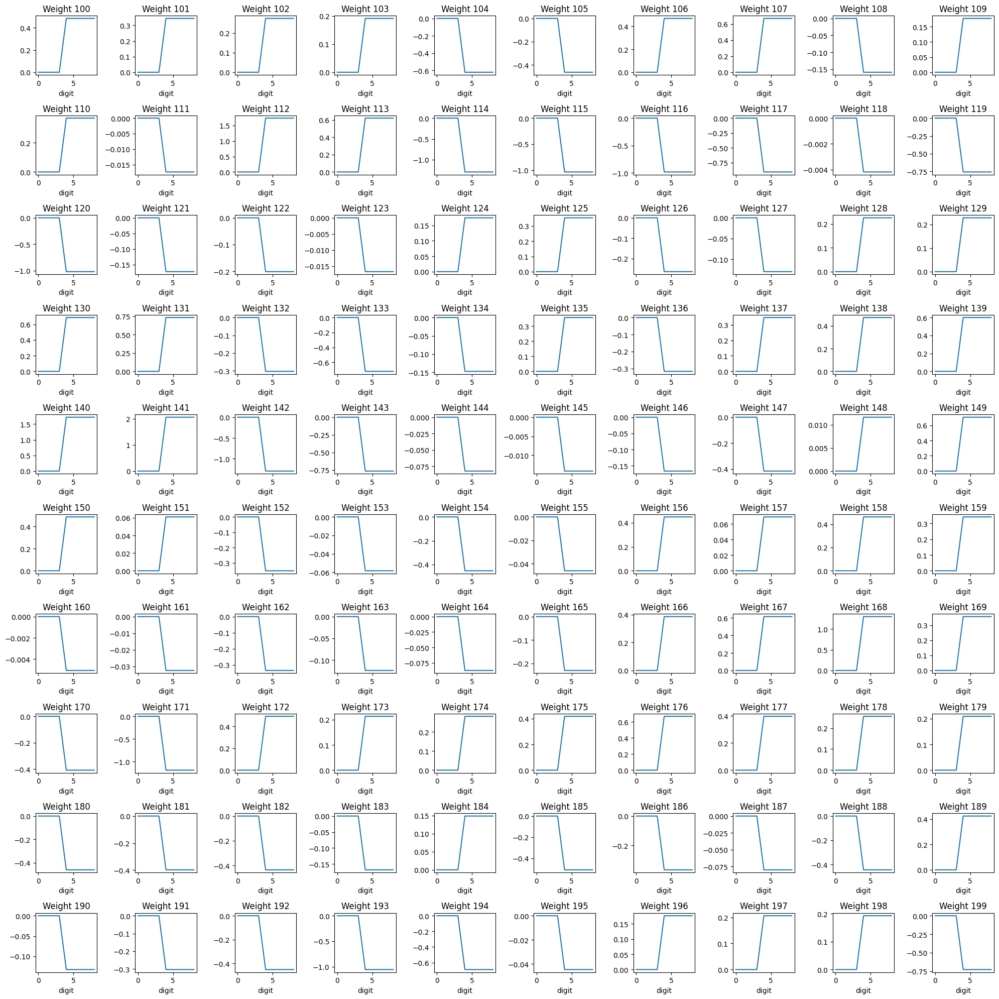

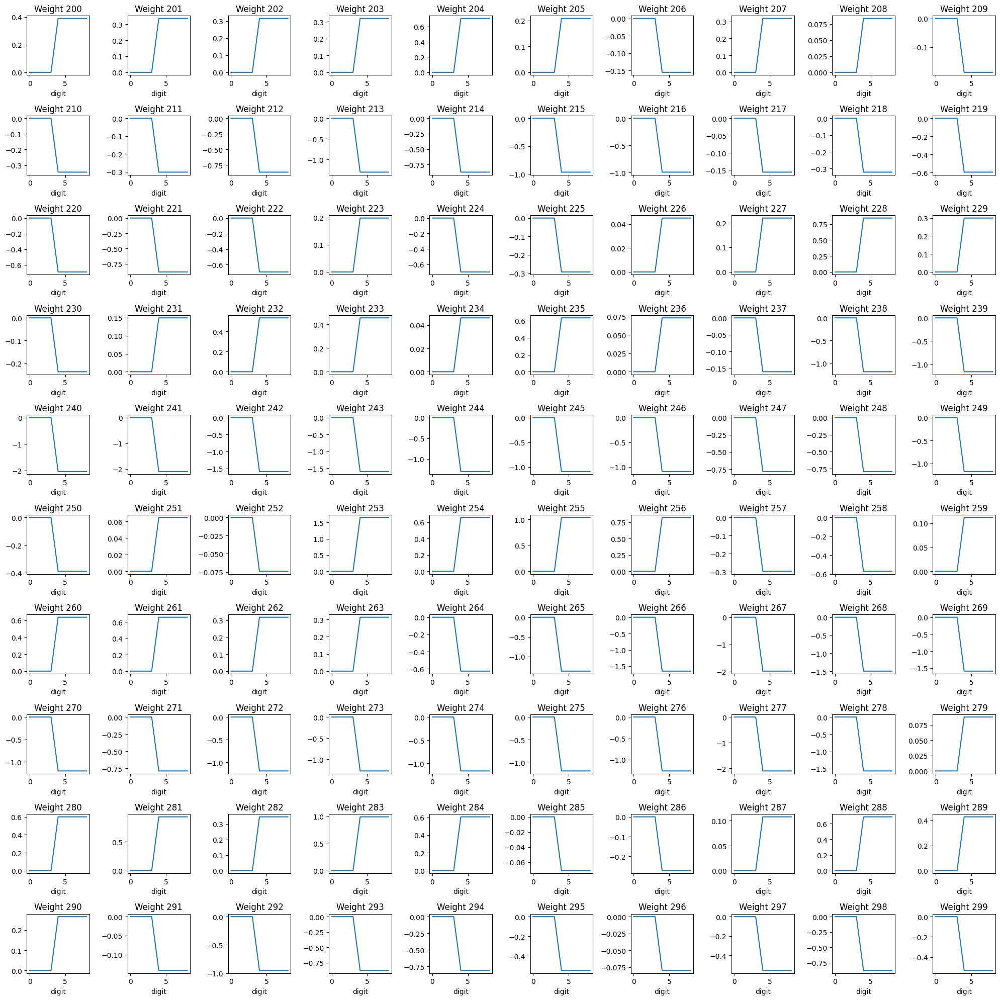

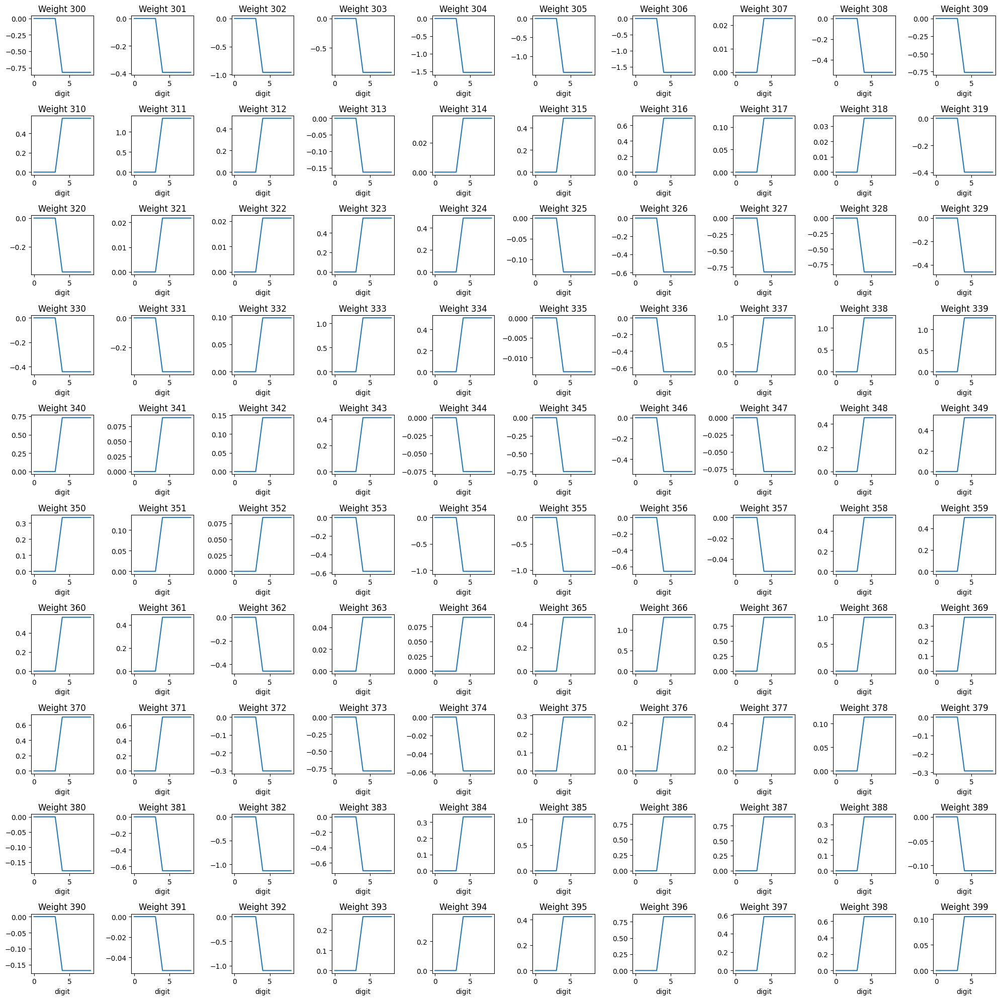

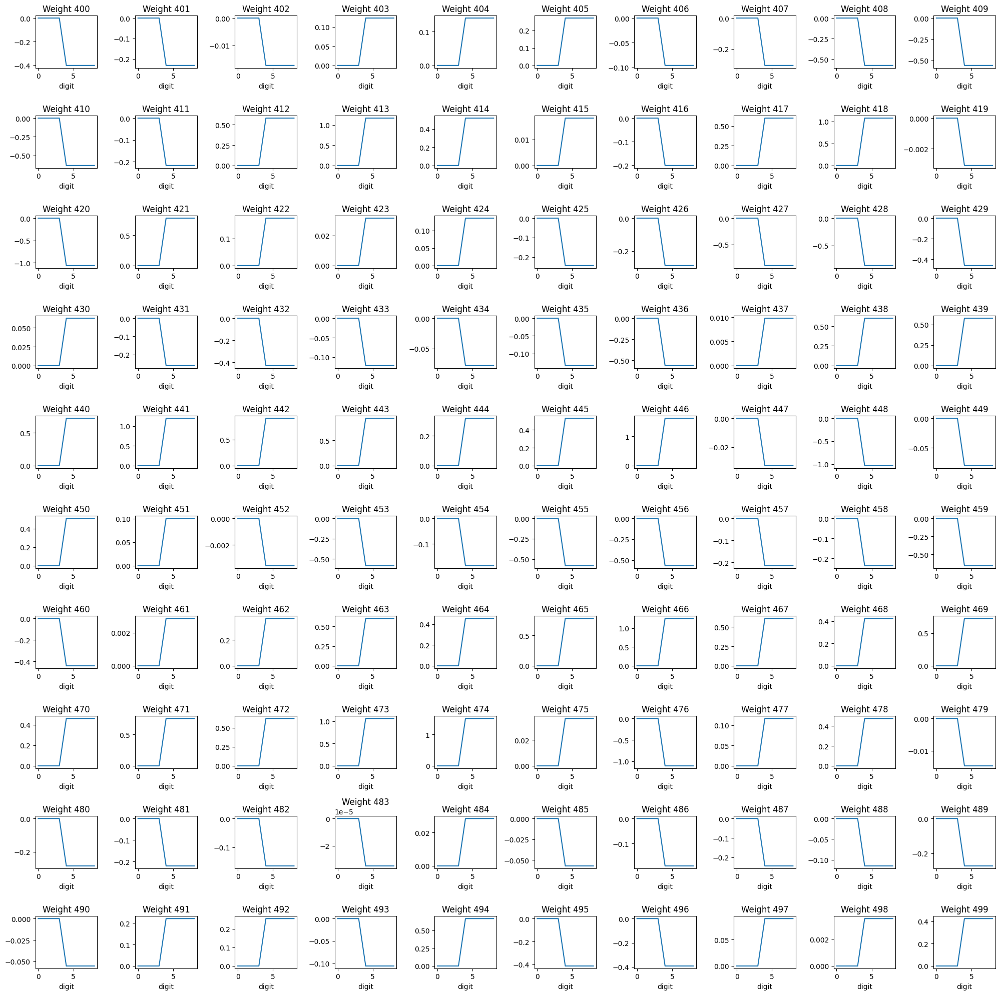

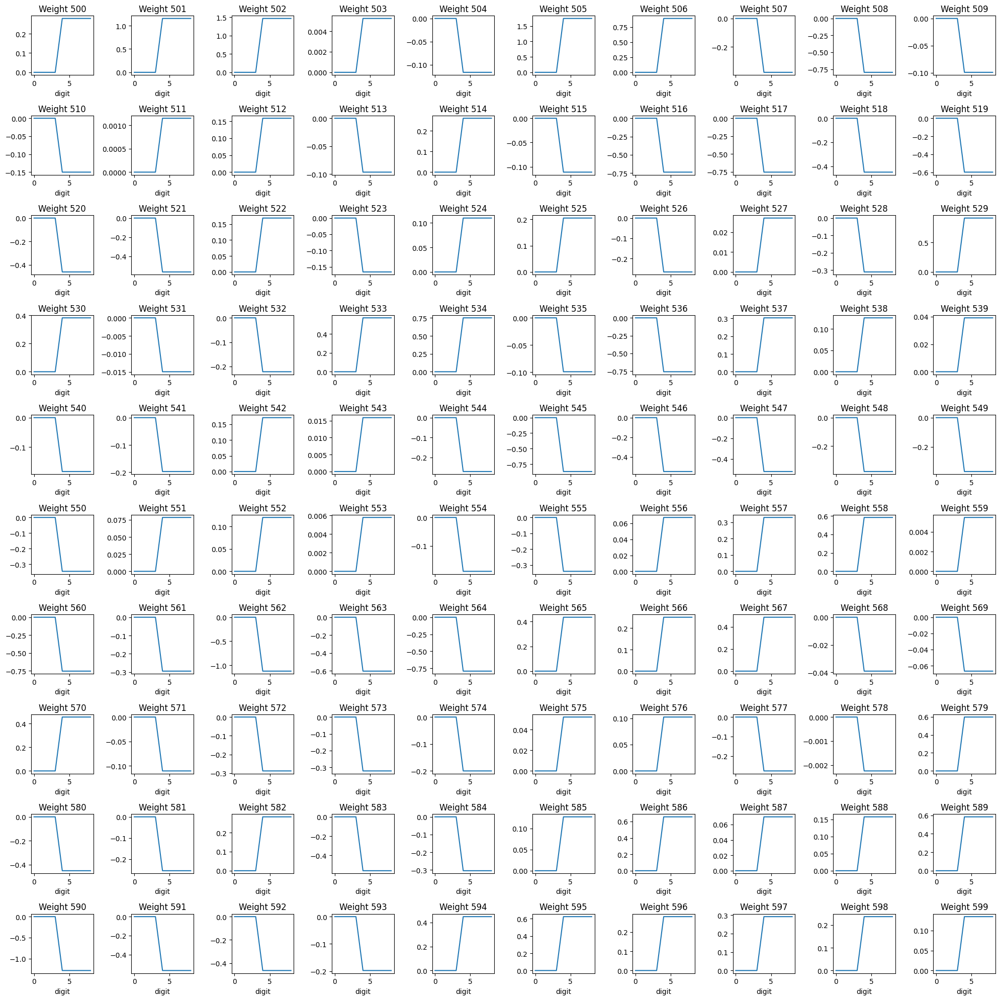

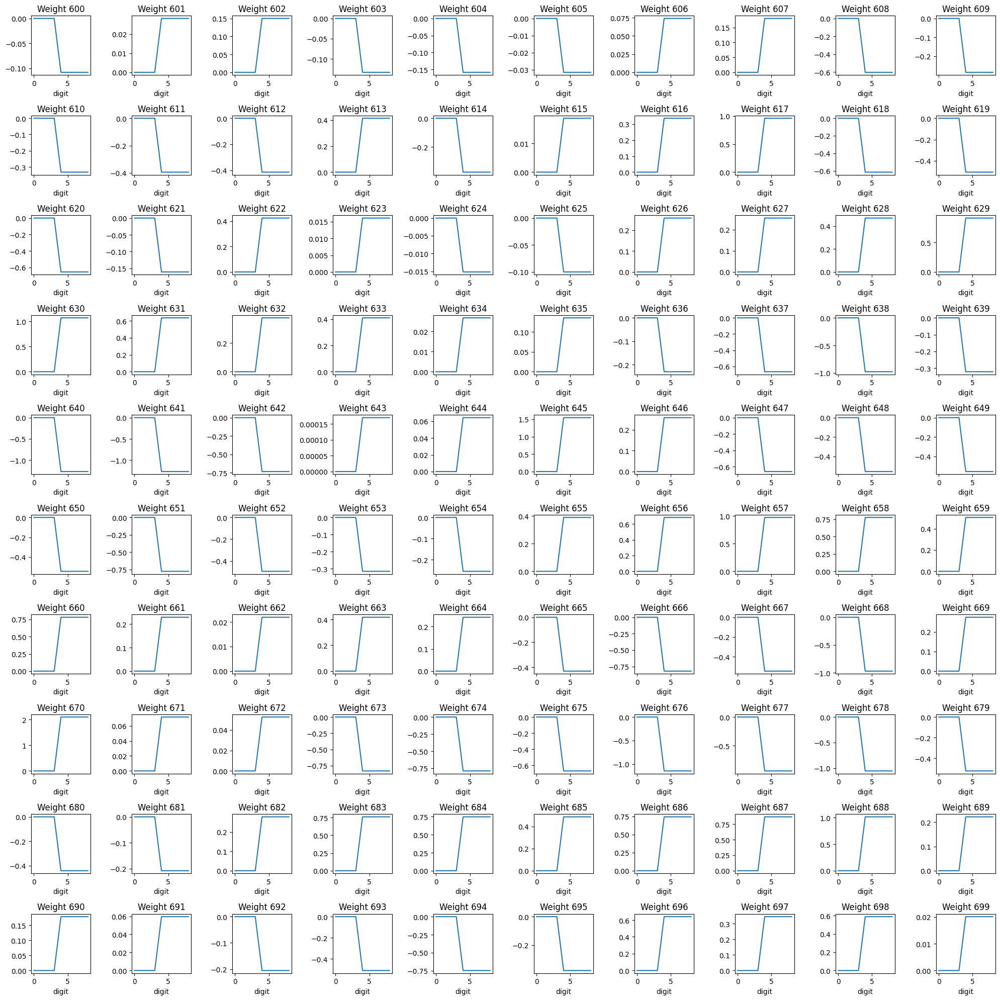

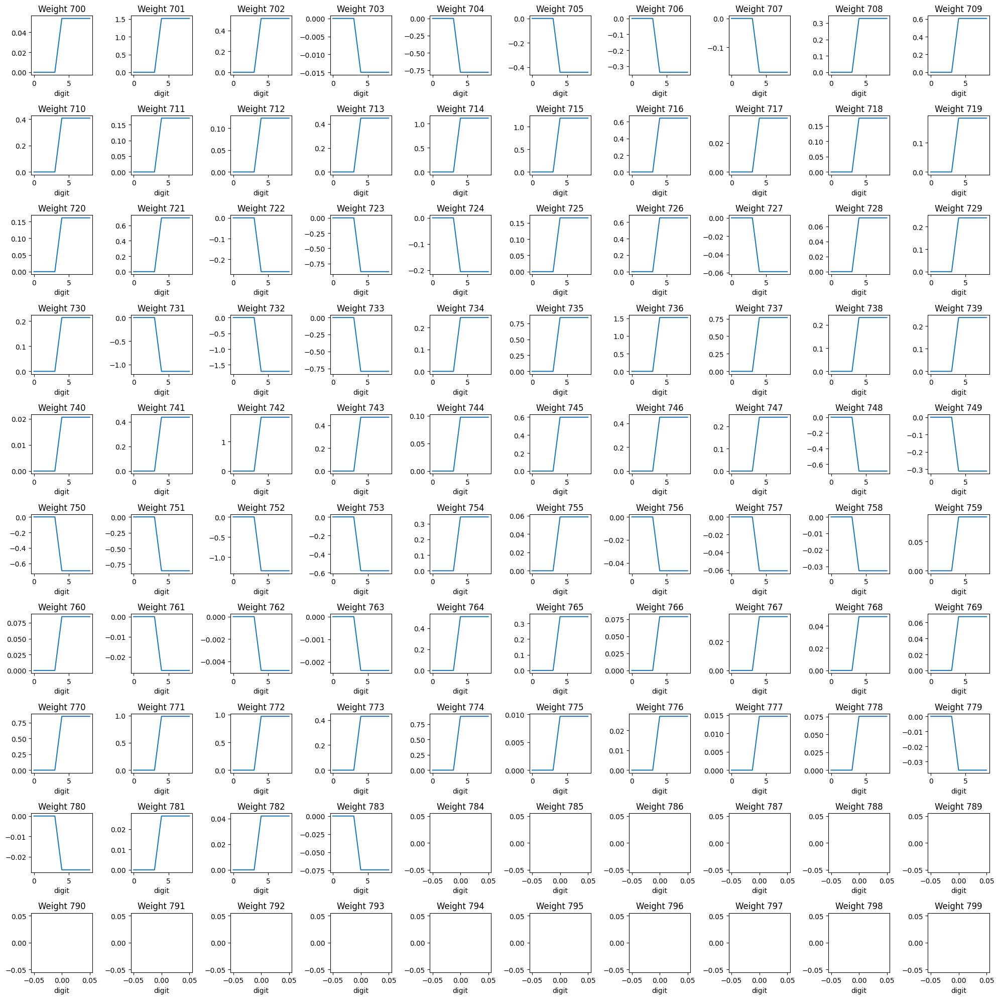

In [36]:
plot_neuron_weights(tii_D1, hz_neuron)
plot_neuron_weights(tii_D1, hz_neuron, pad=100)
plot_neuron_weights(tii_D1, hz_neuron, pad=200)
plot_neuron_weights(tii_D1, hz_neuron, pad=300)
plot_neuron_weights(tii_D1, hz_neuron, pad=400)
plot_neuron_weights(tii_D1, hz_neuron, pad=500)
plot_neuron_weights(tii_D1, hz_neuron, pad=600)
plot_neuron_weights(tii_D1, hz_neuron, pad=700)

In [37]:
D1[str(hz_neuron)]

0     -0.078748
1      0.068527
2     -0.064235
3      0.071931
4      0.345319
         ...   
779    0.000000
780    0.000000
781    0.000000
782    0.000000
783    0.000000
Name: 11, Length: 569968, dtype: float64

Originally, all the weights for this neuron were zero. In the first example, the output of the neuron was zero. So, the weights of the CI operation were kept. In the 4th digit, the output was greater than zero. Then, the weights were updated to their original values. With this update, no other changes could be made, since comparisons always result in the original weight values.

## Selected neurons and Weights

In [20]:
post_tii_df = pd.DataFrame(slc.D1).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [21]:
before_tii_df = pd.DataFrame(D1_before_TII).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [22]:
print("Neurons with any positive weights:")
post_tii_df.sum().transform(lambda x: x != 0).astype(int).value_counts()

Neurons with any positive weights:


1    33
0    16
Name: count, dtype: int64

Text(0.5, 0.98, 'Selected Neurons')

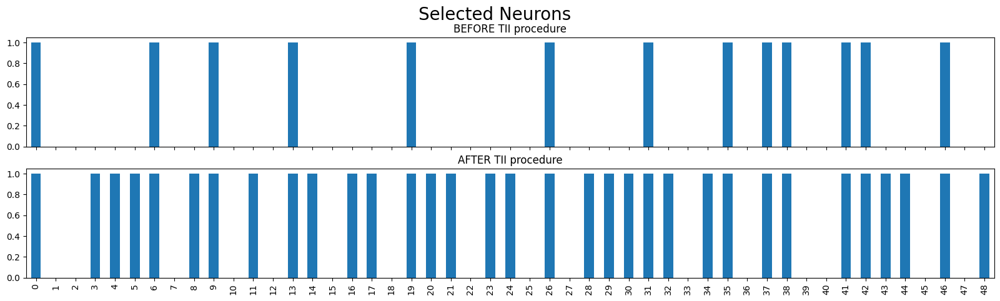

In [23]:
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=True)
before_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[0])
post_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[1])

axes[0].set_title('BEFORE TII procedure')
axes[1].set_title('AFTER TII procedure')
fig.suptitle('Selected Neurons', fontsize=20)

- All neurons selected before TII were kept. Several others were added.

33 neurons were selected during the TI phase of the algorithm.

<Axes: >

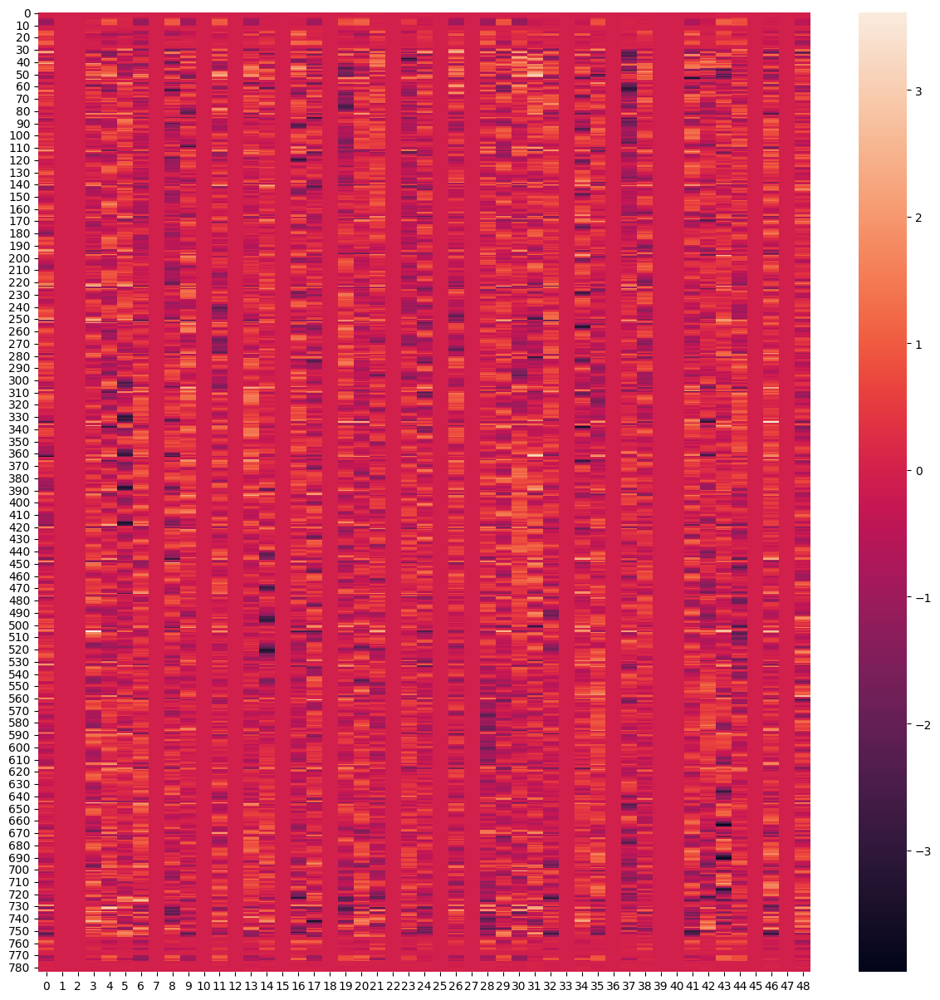

In [24]:
plt.figure(figsize=(15,15))
sns.heatmap(pd.DataFrame(slc.D1))#, annot=True)

Since the weights of some neurons were brought back, some negative weights are present in the final selection.

Text(0.5, 1.0, 'Selected Weights for the module after CI procedure')

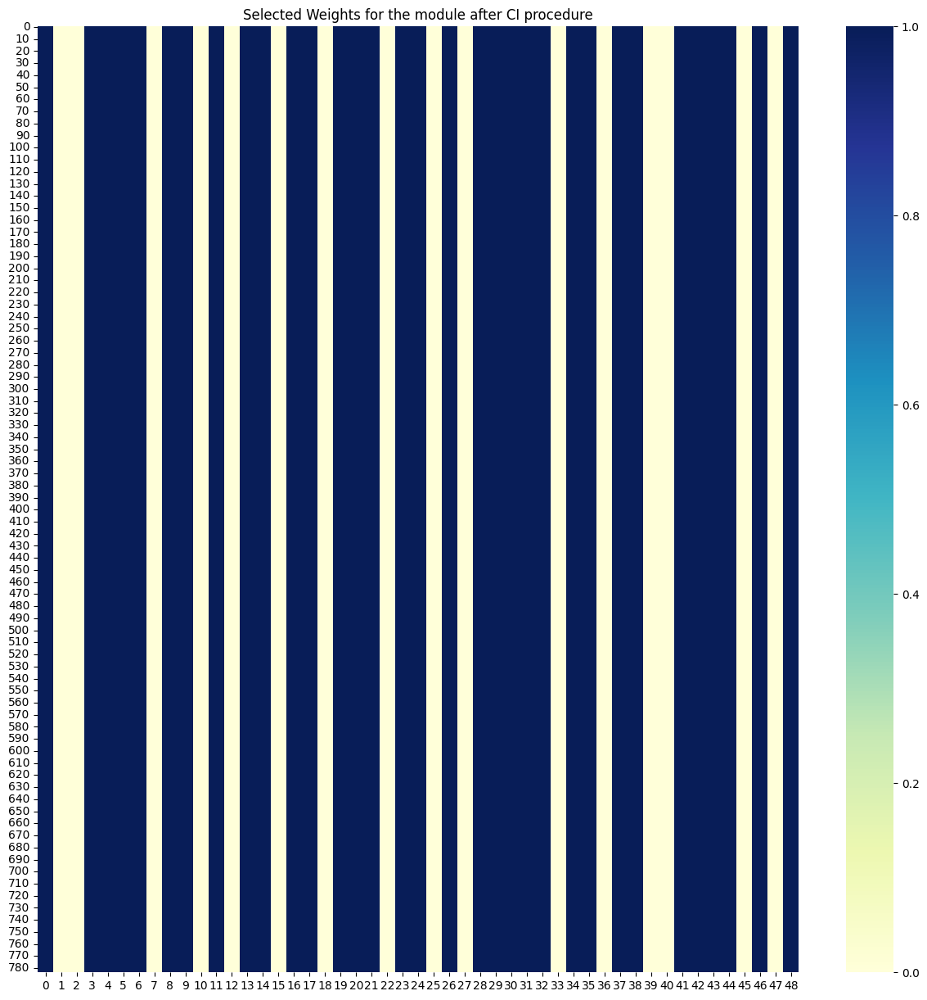

In [25]:
plt.figure(figsize=(15,15))
sns.heatmap(post_tii_df, cmap='YlGnBu', fmt="g")
plt.title('Selected Weights for the module after CI procedure')

All the weights of the selected neurons are utilized.

# 2nd Dense Layer

## Neurons Outputs

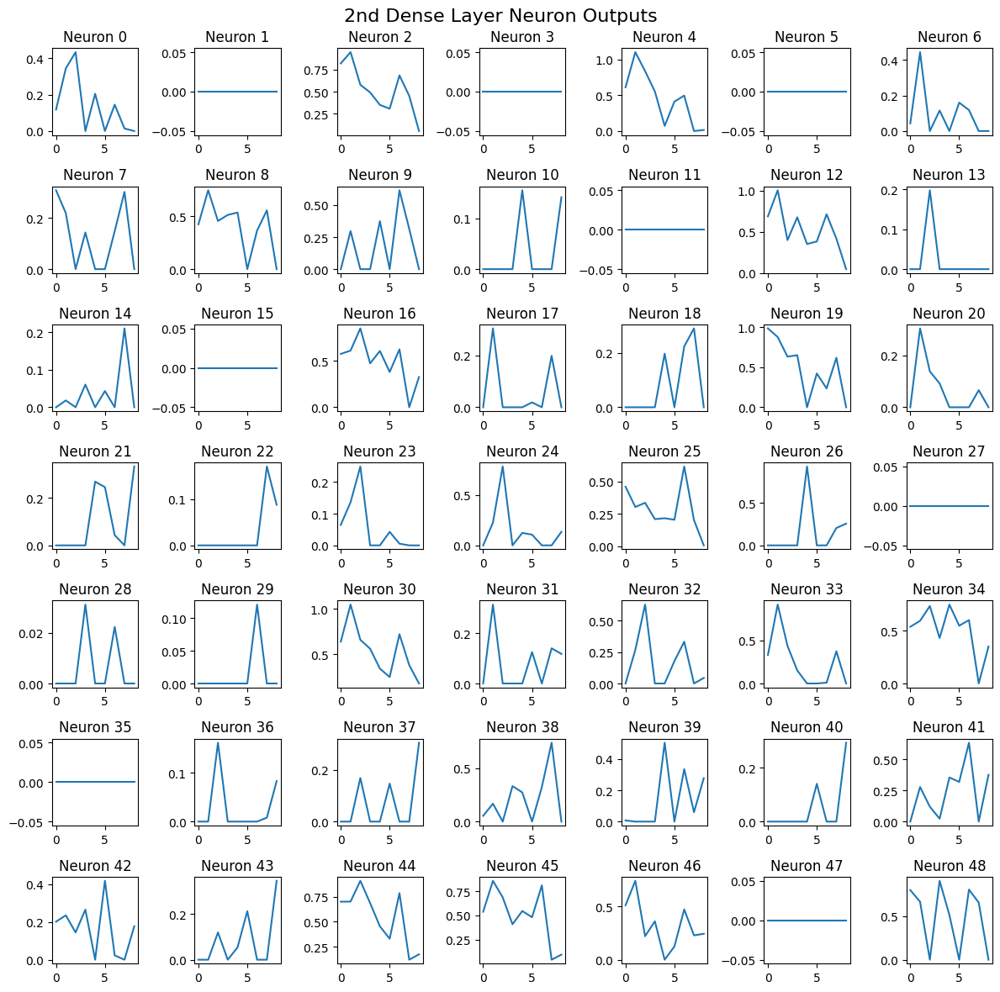

In [27]:
fig, axes = plt.subplots(7, 7, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    tii_X2[tii_X2.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("2nd Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

## Regular Neuron

In [28]:
r_neuron = 45

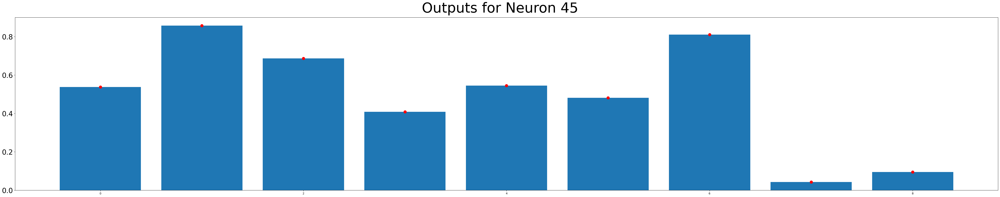

In [34]:
output_r = tii_X2[tii_X2.neuron == r_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_r.plot(kind='bar', ax=axes)
plt.bar(output_r.digit, output_r.output)
plt.scatter(output_r.digit, output_r.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {r_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

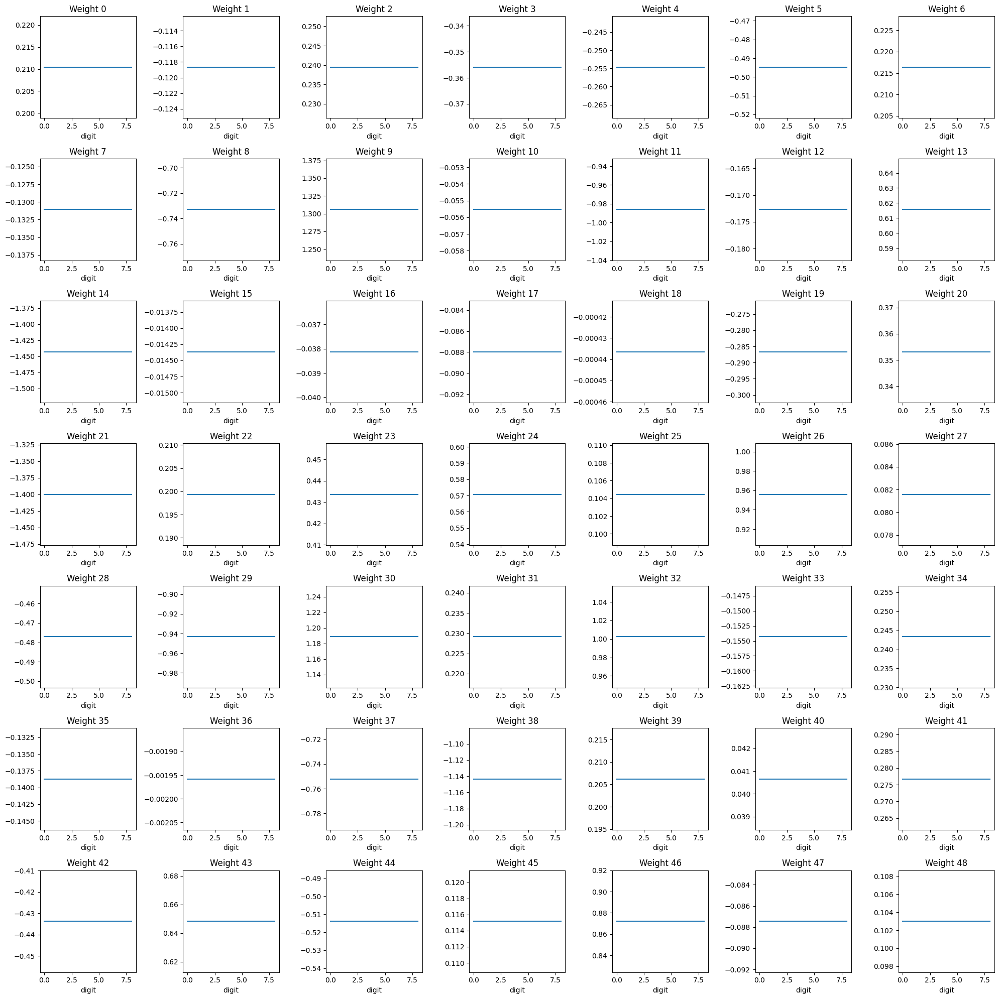

In [37]:
plot_neuron_weights(tii_D2, r_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

From the code, if the output of the neuron is greater than zero, the weights are set back to the model weights. Else, they receive the value of the updated weight.
- The CI result is kept only in cases where all the outputs are zero. If a single output is greater than zero, all the weights go back to their original values for that neuron.

## Nonactivated Neuron

In [38]:
na_neuron = 35

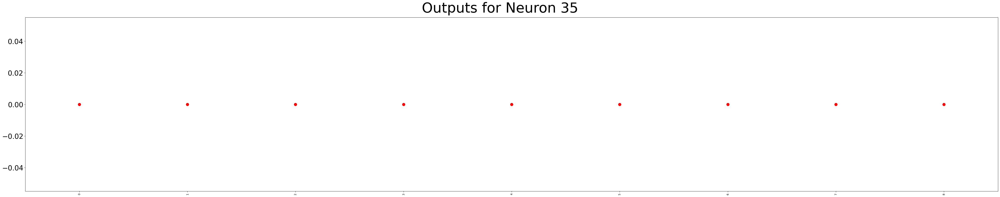

In [40]:
output_na = tii_X2[tii_X2.neuron == na_neuron].output.reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
output_na.plot(kind='bar', ax=axes)
plt.scatter(output_na.index, output_na.values, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {na_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

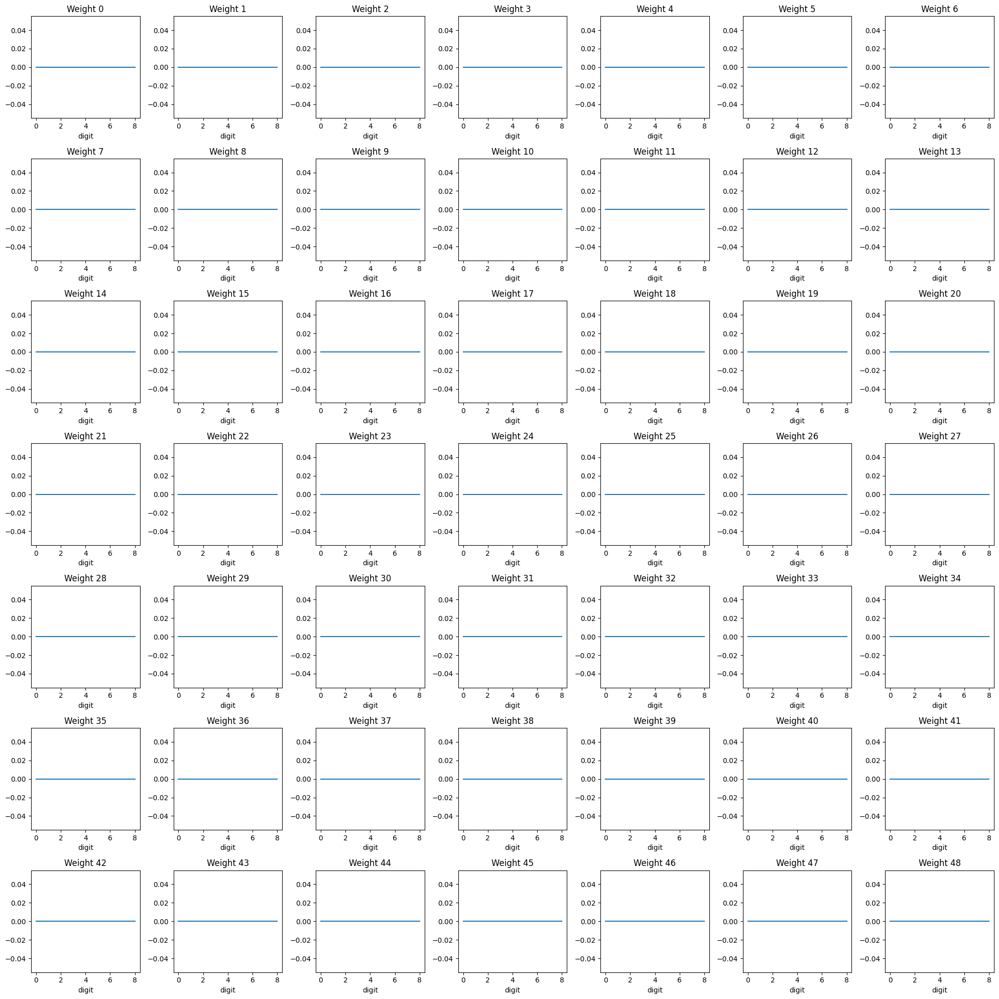

In [41]:
plot_neuron_weights(tii_D2, na_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

In [42]:
D1[str(na_neuron)].sum()

91275.53013016998

All the weights of this neuron were 0 after the CI operation. Thus, since no output was greater than zero, the weights were kept as zero.

## Neurons with Outputs that hit zero

### First Neuron

In [46]:
hz_neuron = 8

In [47]:
tii_X2[tii_X2.neuron == hz_neuron]

,neuron,digit,output
8,8,0,0.422207
57,8,1,0.743144
106,8,2,0.453967
155,8,3,0.510665
204,8,4,0.533474
253,8,5,0.000000
302,8,6,0.363420
351,8,7,0.554124
400,8,8,0.000000


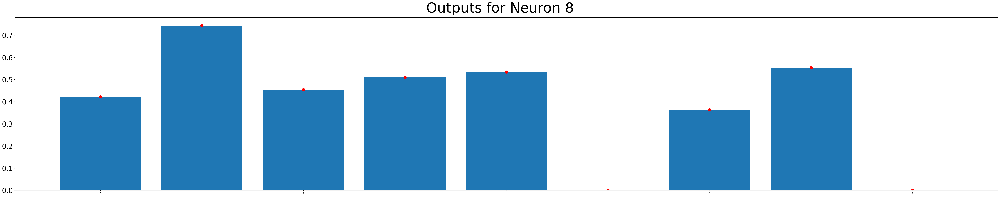

In [48]:
output_hz = tii_X2[tii_X2.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #2. 

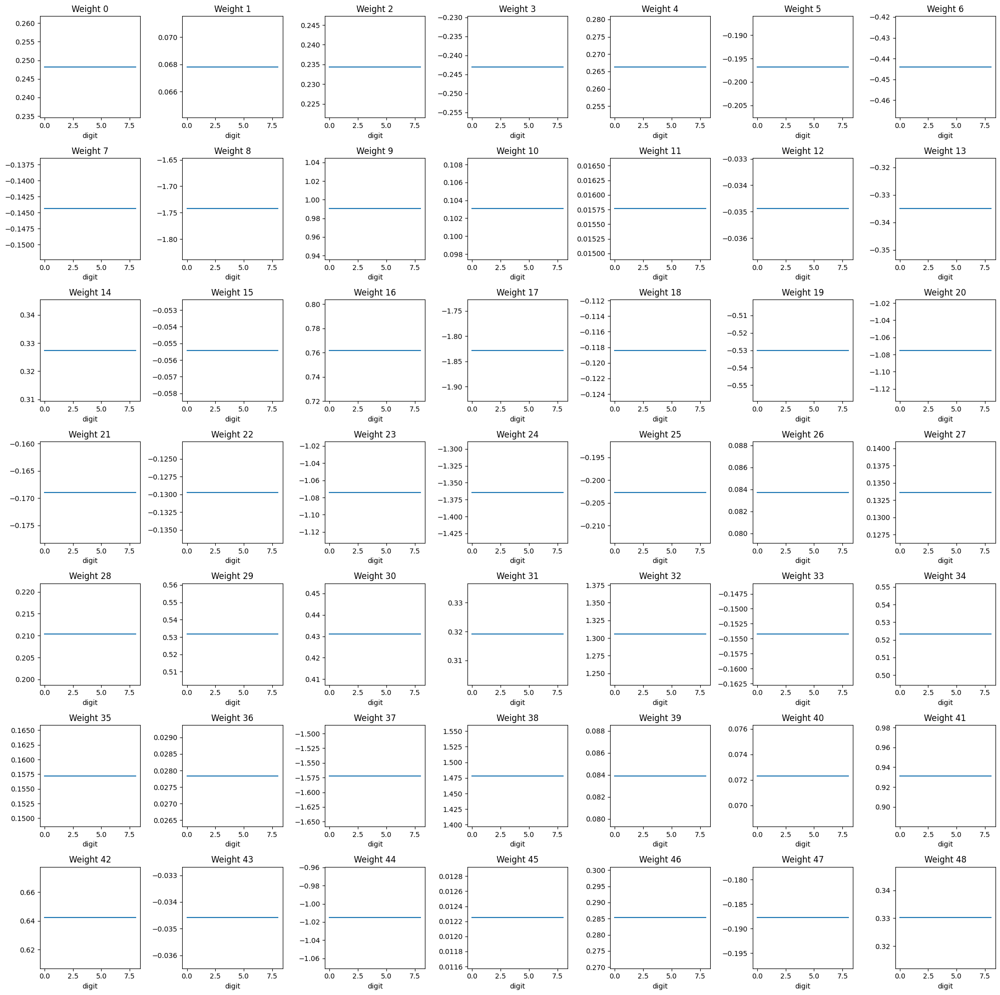

In [49]:
plot_neuron_weights(tii_D2, hz_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

Since the first output is greater than 0, the weights go back to their original value.

When the output is zero (example #2), the updated values are the same as the original weight values, which were changed in example #0. So, no updates were made.

### Second Neuron

In [50]:
hz_neuron = 26

In [51]:
tii_X2[tii_X2.neuron == hz_neuron]

,neuron,digit,output
26,26,0,0.000000
75,26,1,0.000000
124,26,2,0.000000
173,26,3,0.000000
222,26,4,0.931550
271,26,5,0.000000
320,26,6,0.000000
369,26,7,0.205311
418,26,8,0.256472


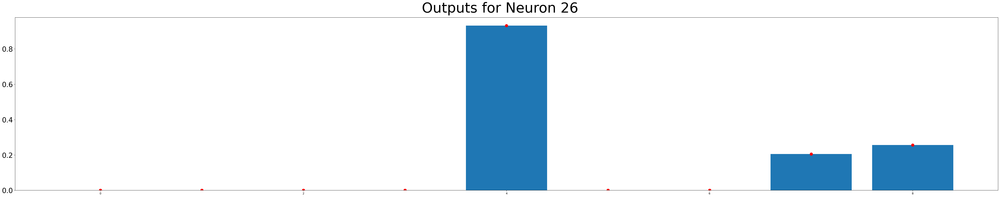

In [52]:
output_hz = tii_X2[tii_X2.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #0. 

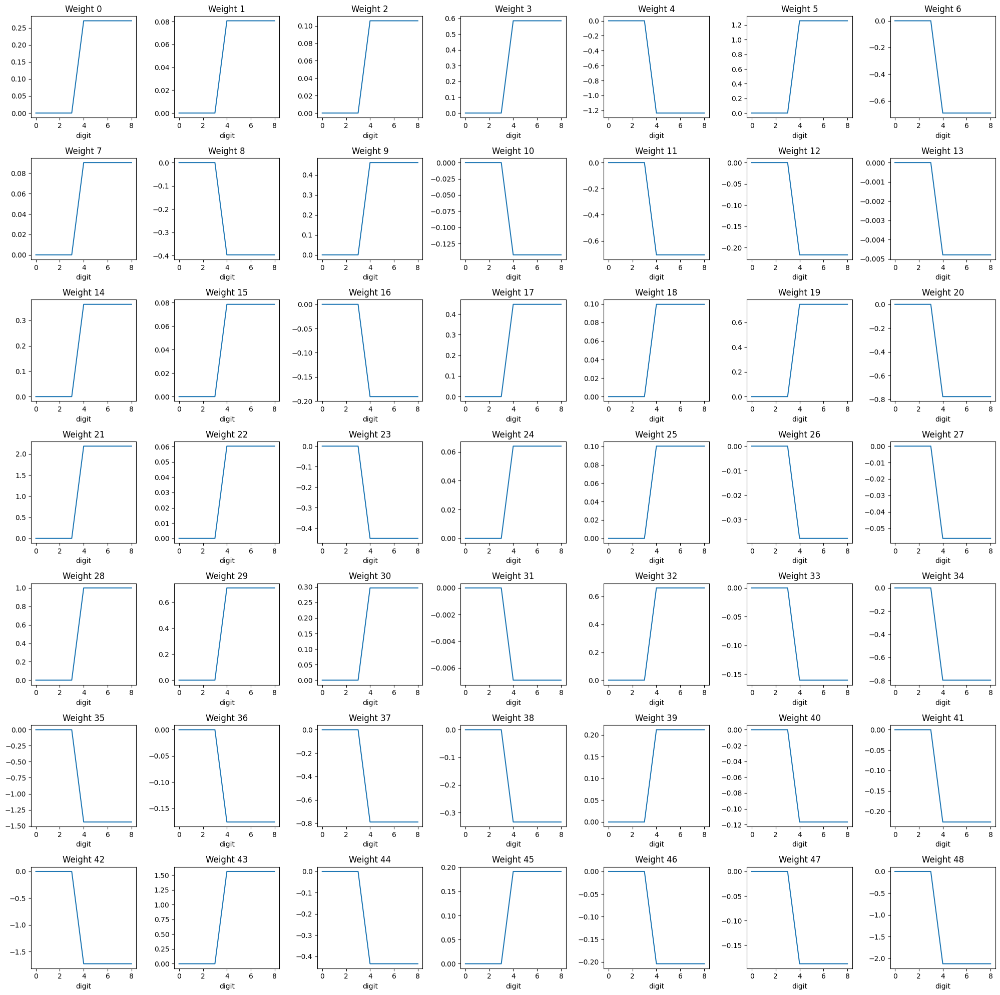

In [53]:
plot_neuron_weights(tii_D2, hz_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

In [54]:
D2[str(hz_neuron)]

0     0.0
1     0.0
2     0.0
3     0.0
4     0.0
     ... 
44    0.0
45    0.0
46    0.0
47    0.0
48    0.0
Name: 26, Length: 35623, dtype: float64

Originally, all the weights for this neuron were zero. In the first example, the output of the neuron was zero. So, the weights of the CI operation were kept. In the 3rd digit, the output was greater than zero. Then, the weights were updated to their original values. With this update, no other changes could be made, since comparisons always result in the original weight values.

## Selected neurons and Weights

In [55]:
post_tii_df = pd.DataFrame(slc.D2).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [56]:
before_tii_df = pd.DataFrame(D2_before_TII).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [57]:
print("Neurons with any positive weights:")
post_tii_df.sum().transform(lambda x: x != 0).astype(int).value_counts()

Neurons with any positive weights:


1    42
0     7
Name: count, dtype: int64

Text(0.5, 0.98, 'Selected Neurons')

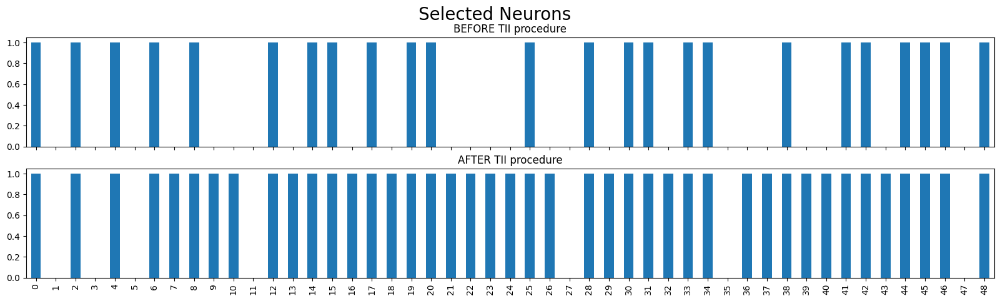

In [58]:
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=True)
before_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[0])
post_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[1])

axes[0].set_title('BEFORE TII procedure')
axes[1].set_title('AFTER TII procedure')
fig.suptitle('Selected Neurons', fontsize=20)

- All neurons selected before TII were kept. Several others were added.

42 neurons were selected during the TI phase of the algorithm.

<Axes: >

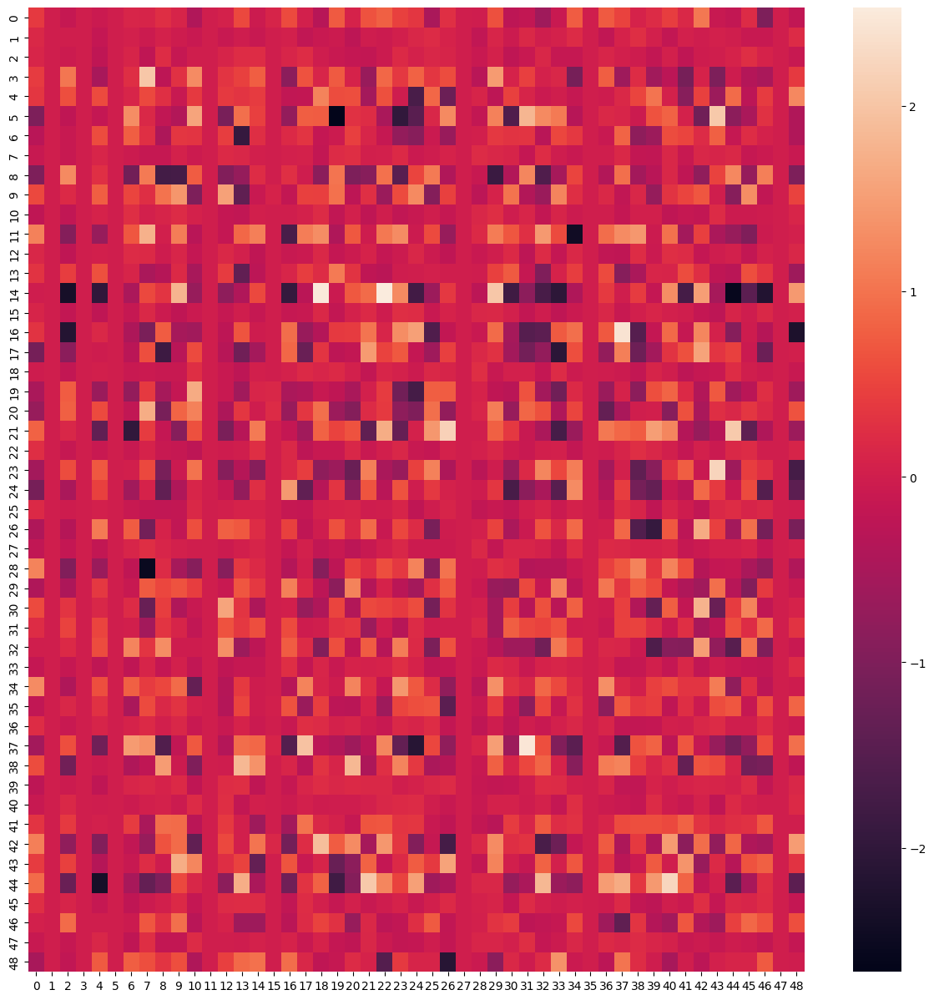

In [59]:
plt.figure(figsize=(15,15))
sns.heatmap(pd.DataFrame(slc.D2))#, annot=True)

Since the weights of some neurons were brought back, some negative weights are present in the final selection.

Text(0.5, 1.0, 'Selected Weights for the module after CI procedure')

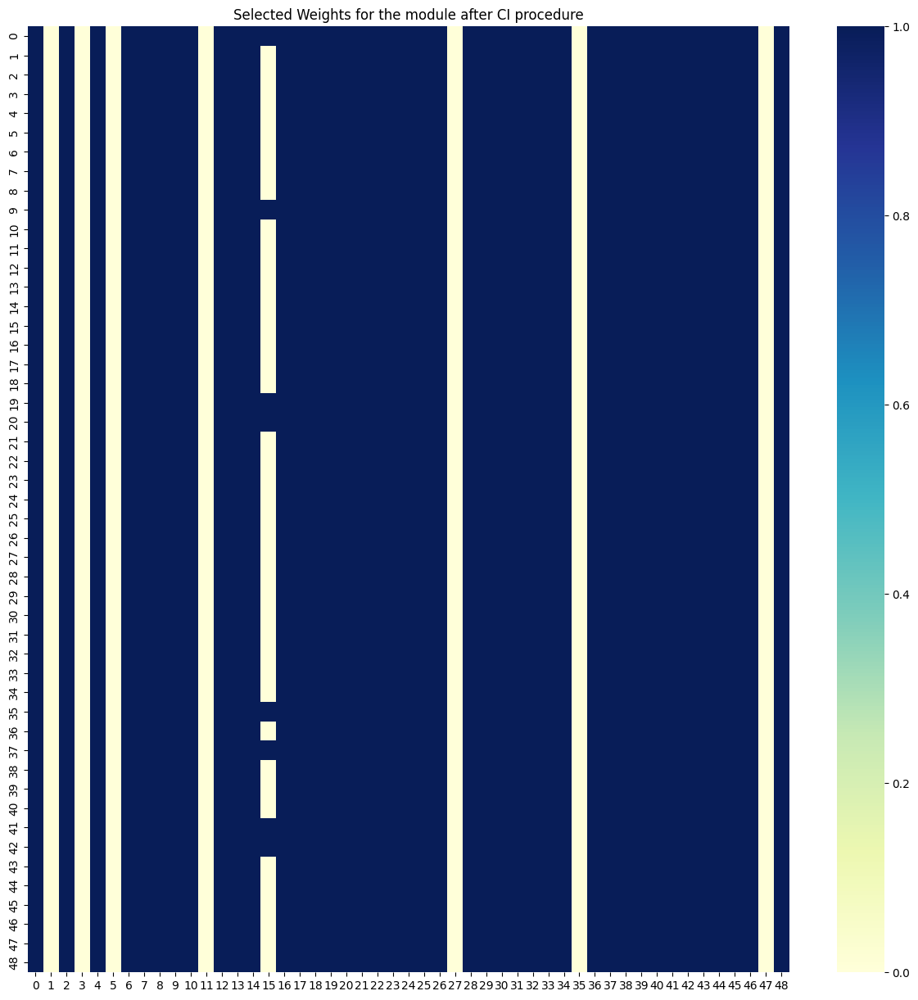

In [60]:
plt.figure(figsize=(15,15))
sns.heatmap(post_tii_df, cmap='YlGnBu', fmt="g")
plt.title('Selected Weights for the module after CI procedure')

Not all weights from neuron 15 were selected.

### n15

In [61]:
hz_neuron = 15

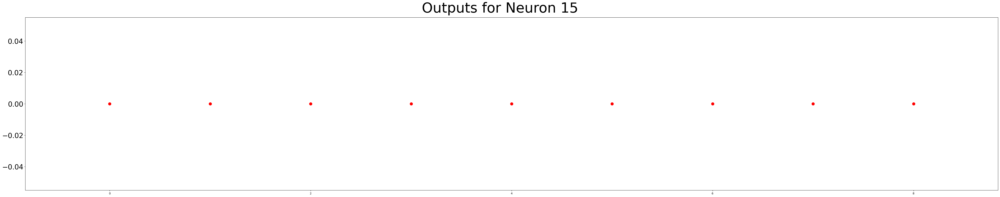

In [63]:
output_hz = tii_X2[tii_X2.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

n15 is all zeros. It is the only all zeroes output neuron that was selected, and thus the weights from CII were kept.

In [117]:
df = pd.DataFrame()

df['before_tii'] = pd.DataFrame(D2_before_TII)[hz_neuron]
df['after_tii'] = pd.DataFrame(slc.D2)[hz_neuron]
df

,before_tii,after_tii
0,0.100614,0.100614
1,0.000000,0.000000
2,0.000000,0.000000
3,0.000000,0.000000
4,0.000000,0.000000
5,0.000000,0.000000
6,0.000000,0.000000
7,0.000000,0.000000
8,0.000000,0.000000
9,0.077514,0.077514


In [118]:
(pd.DataFrame(slc.D2)[hz_neuron] - pd.DataFrame(D2_before_TII)[hz_neuron]).sum()

0.0

# 3rd Dense Layer

## Neurons Outputs

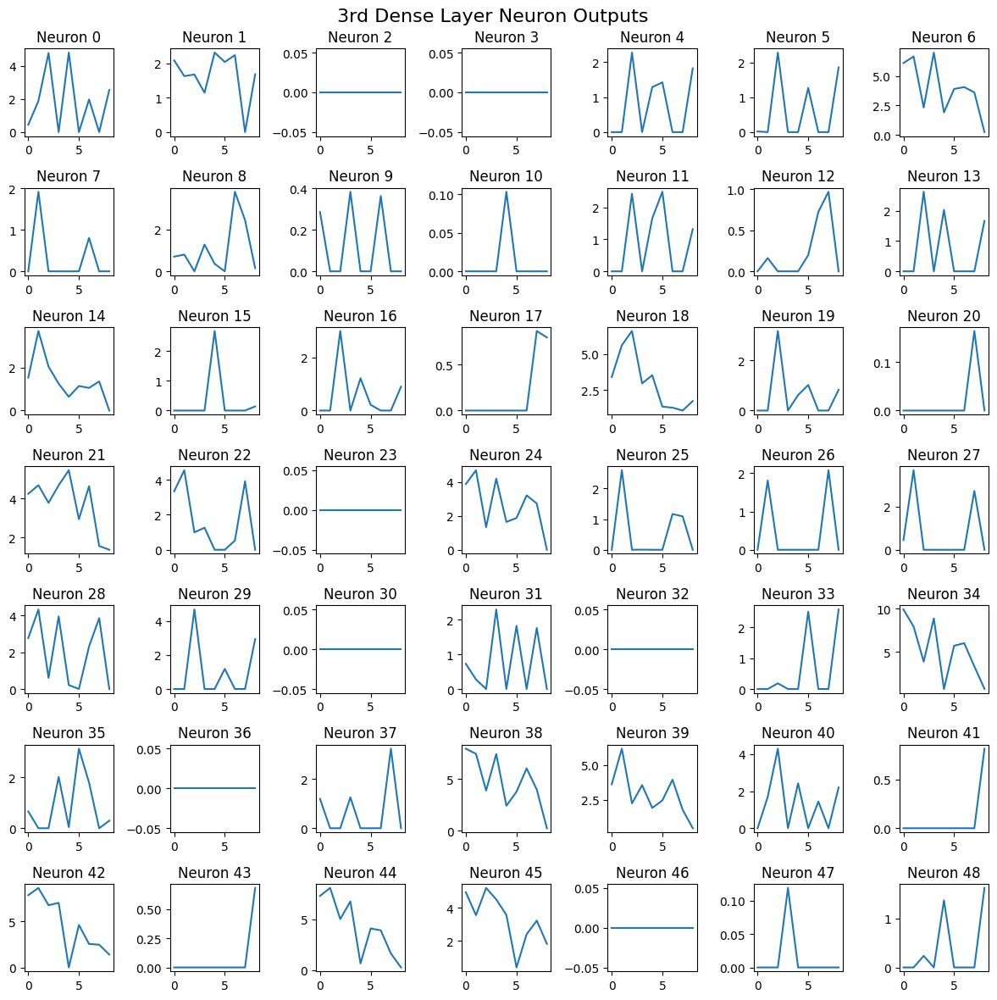

In [120]:
fig, axes = plt.subplots(7, 7, figsize=(12, 12))

for i, ax in enumerate(axes.flat):
    tii_X3[tii_X3.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("3rd Dense Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

## Regular Neuron

In [121]:
r_neuron = 18

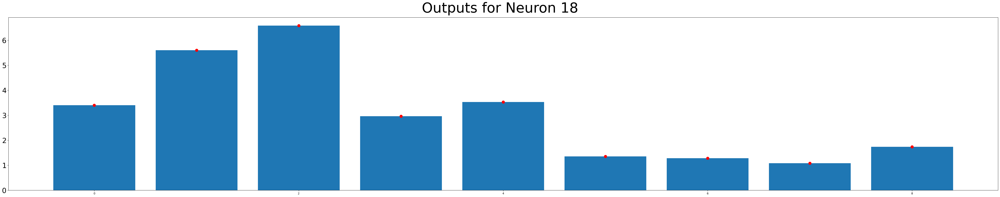

In [122]:
output_r = tii_X3[tii_X3.neuron == r_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_r.plot(kind='bar', ax=axes)
plt.bar(output_r.digit, output_r.output)
plt.scatter(output_r.digit, output_r.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {r_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

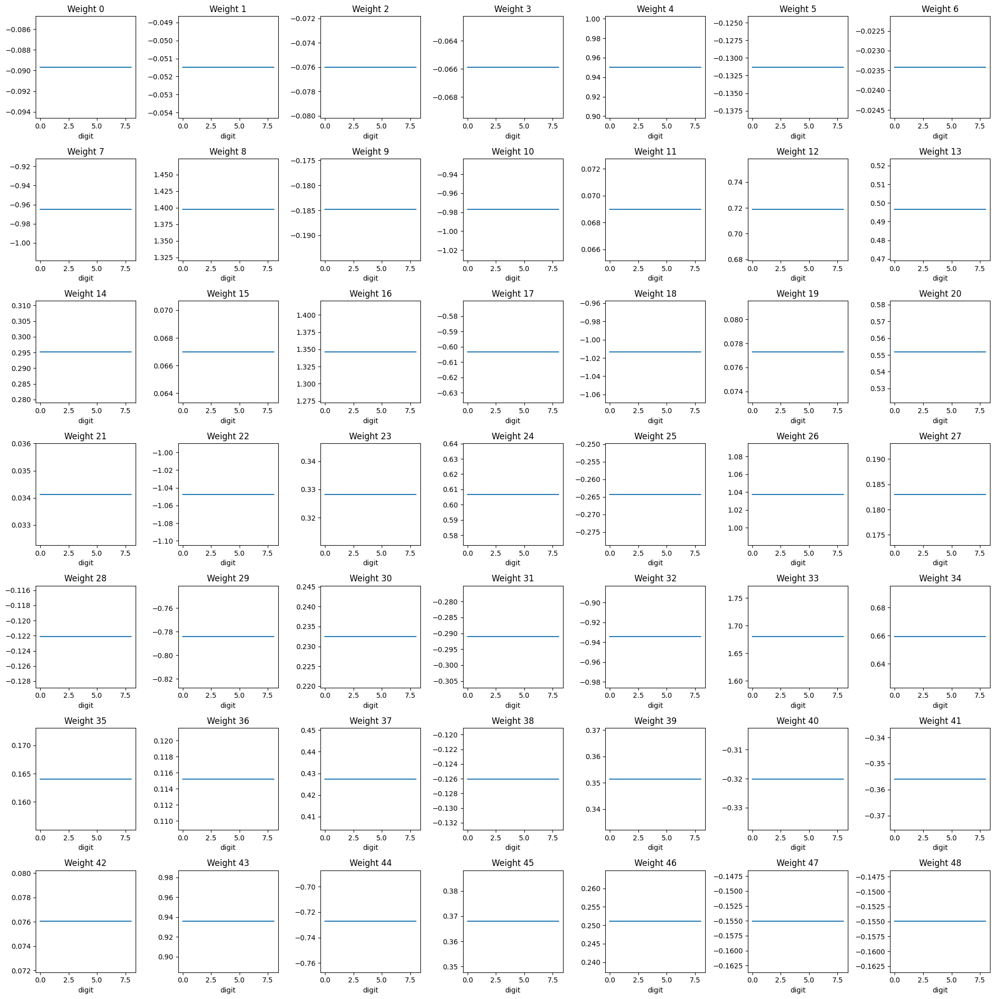

In [123]:
plot_neuron_weights(tii_D3, r_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

From the code, if the output of the neuron is greater than zero, the weights are set back to the model weights. Else, they receive the value of the updated weight.
- The CI result is kept only in cases where all the outputs are zero. If a single output is greater than zero, all the weights go back to their original values for that neuron.

## Nonactivated Neuron

In [124]:
na_neuron = 30

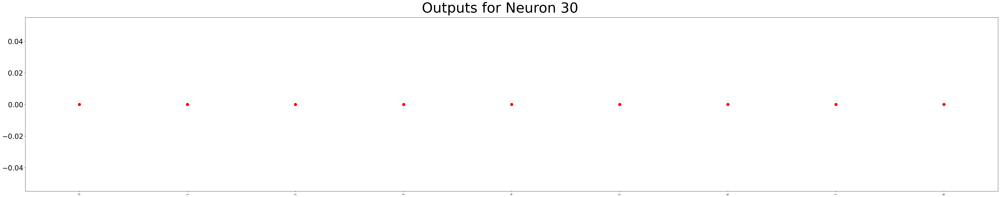

In [125]:
output_na = tii_X3[tii_X3.neuron == na_neuron].output.reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
output_na.plot(kind='bar', ax=axes)
plt.scatter(output_na.index, output_na.values, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {na_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

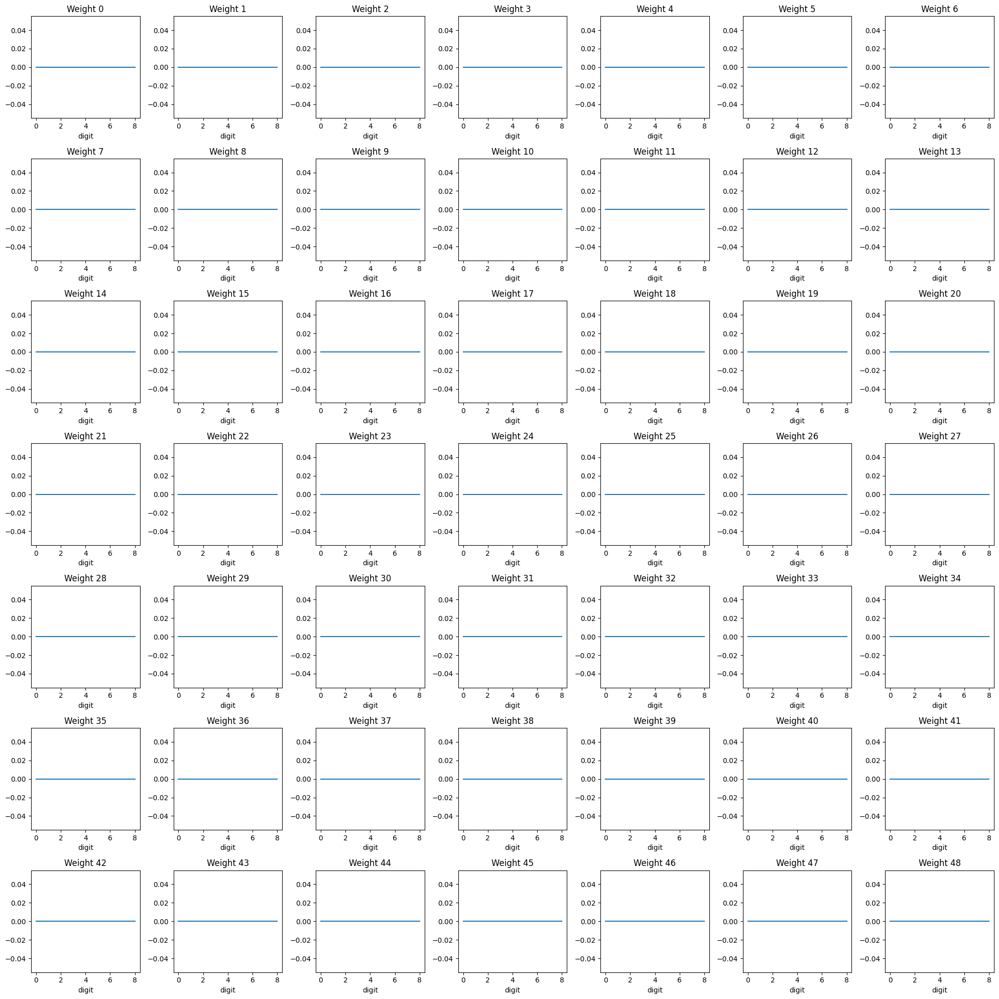

In [127]:
plot_neuron_weights(tii_D3, na_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

In [129]:
na_neuron

30

In [136]:
pd.DataFrame(D3_before_TII)[na_neuron].sum()

0.0

All the weights of this neuron were 0 after the CI operation. Thus, since no output was greater than zero, the weights were kept as zero.

## Neurons with Outputs that hit zero

### First Neuron

In [137]:
hz_neuron = 22

In [138]:
tii_X3[tii_X3.neuron == hz_neuron]

,neuron,digit,output
22,22,0,3.342659
71,22,1,4.548899
120,22,2,0.996027
169,22,3,1.262881
218,22,4,0.000000
267,22,5,0.000000
316,22,6,0.528034
365,22,7,3.916310
414,22,8,0.000000


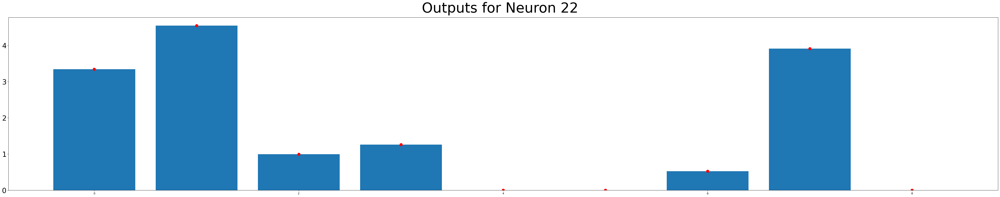

In [139]:
output_hz = tii_X3[tii_X3.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #2. 

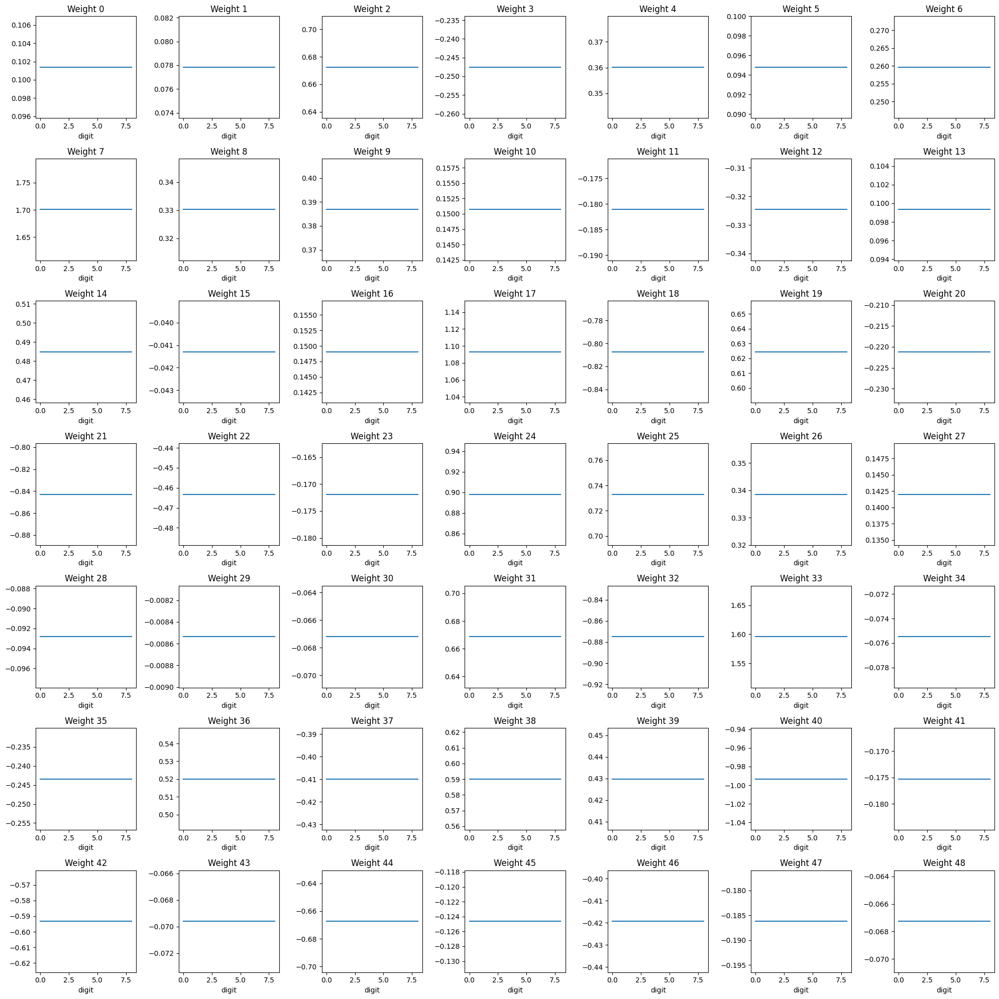

In [140]:
plot_neuron_weights(tii_D3, hz_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

Since the first output is greater than 0, the weights go back to their original value.

When the output is zero (digit #4), the updated values are the same as the original weight values, which were changed in example #0. So, no updates were made.

### Second Neuron

In [141]:
hz_neuron = 15

In [142]:
tii_X3[tii_X3.neuron == hz_neuron]

,neuron,digit,output
15,15,0,0.000000
64,15,1,0.000000
113,15,2,0.000000
162,15,3,0.000000
211,15,4,2.677379
260,15,5,0.000000
309,15,6,0.000000
358,15,7,0.000000
407,15,8,0.139121


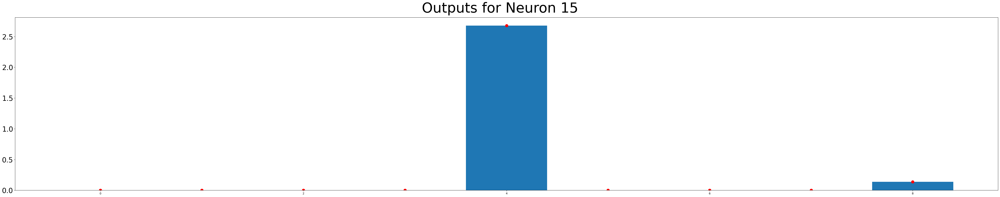

In [143]:
output_hz = tii_X3[tii_X3.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #0. 

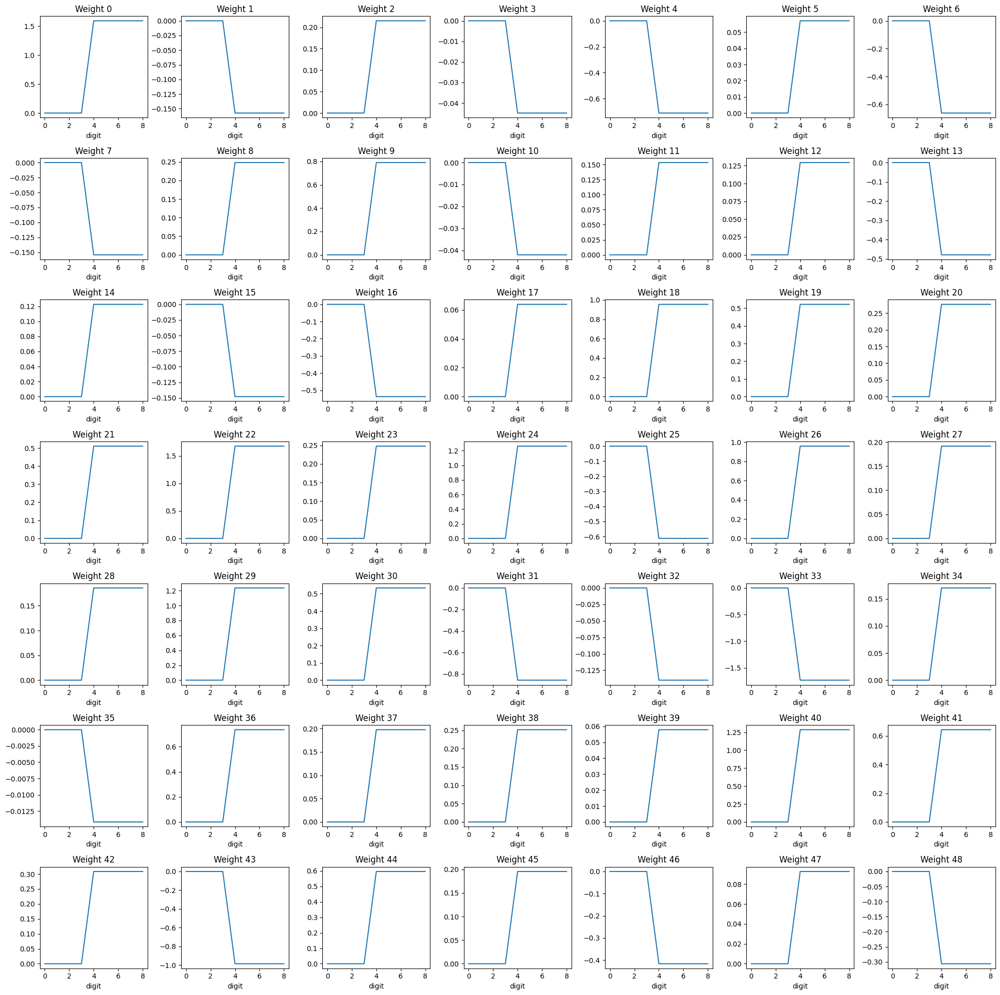

In [144]:
plot_neuron_weights(tii_D3, hz_neuron, pad=0, subplot_sizex=7, subplot_sizey=7)

In [145]:
pd.DataFrame(D3_before_TII)[hz_neuron].sum()

0.0

Originally, all the weights for this neuron were zero. In the first example, the output of the neuron was zero. So, the weights of the CI operation were kept. In the 4th digit, the output was greater than zero. Then, the weights were updated to their original values. With this update, no other changes could be made, since comparisons always result in the original weight values.

## Selected neurons and Weights

In [146]:
post_tii_df = pd.DataFrame(slc.D3).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [147]:
before_tii_df = pd.DataFrame(D3_before_TII).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [148]:
print("Neurons with any positive weights:")
post_tii_df.sum().transform(lambda x: x != 0).astype(int).value_counts()

Neurons with any positive weights:


1    42
0     7
Name: count, dtype: int64

Text(0.5, 0.98, 'Selected Neurons')

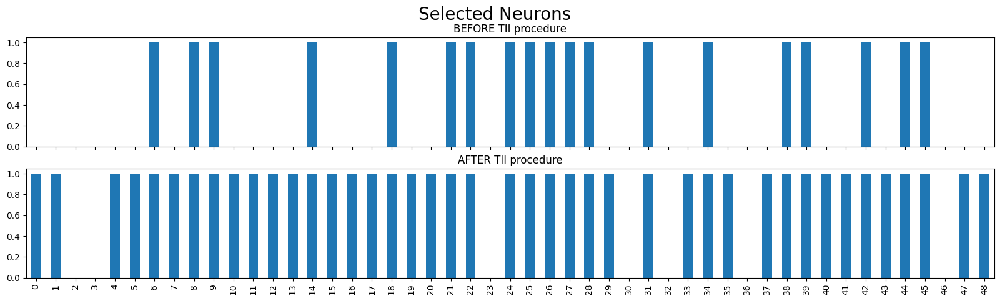

In [149]:
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=True)
before_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[0])
post_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[1])

axes[0].set_title('BEFORE TII procedure')
axes[1].set_title('AFTER TII procedure')
fig.suptitle('Selected Neurons', fontsize=20)

- All neurons selected before TII were kept. Several others were added.

42 neurons were selected during the TI phase of the algorithm.

<Axes: >

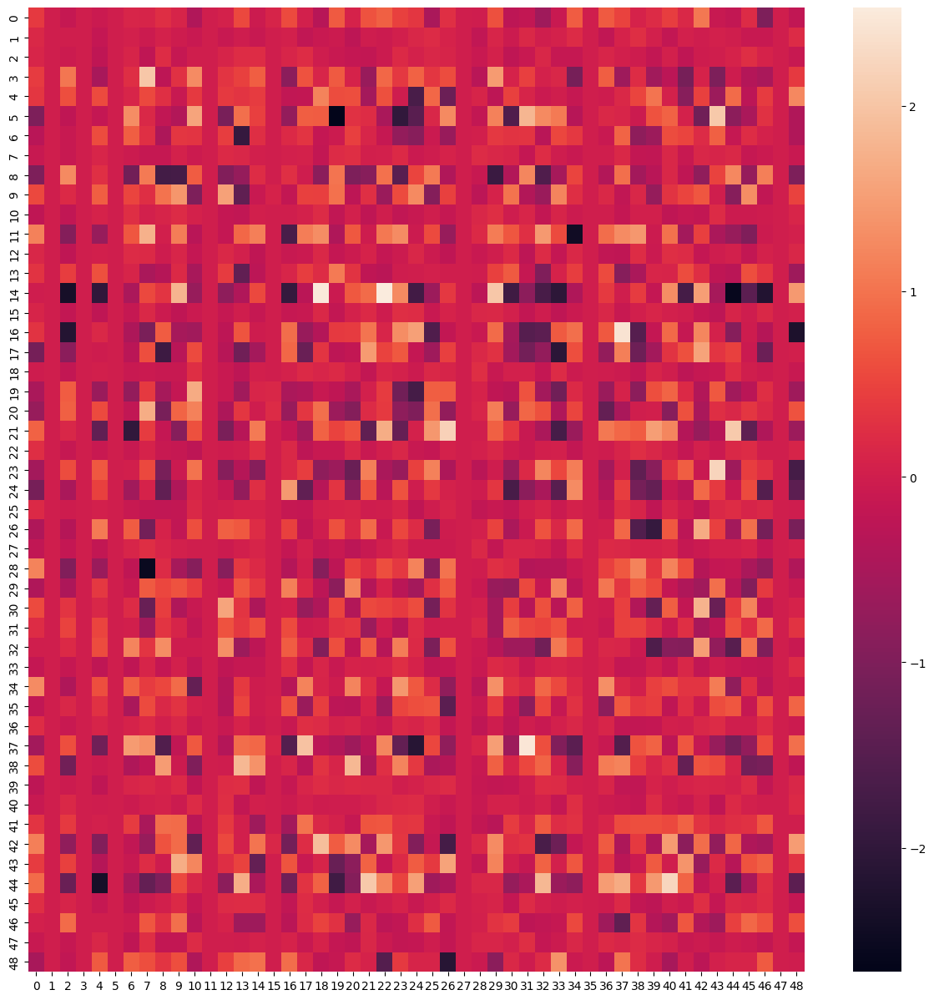

In [150]:
plt.figure(figsize=(15,15))
sns.heatmap(pd.DataFrame(slc.D2))#, annot=True)

Since the weights of some neurons were brought back, some negative weights are present in the final selection.

Text(0.5, 1.0, 'Selected Weights for the module after CI procedure')

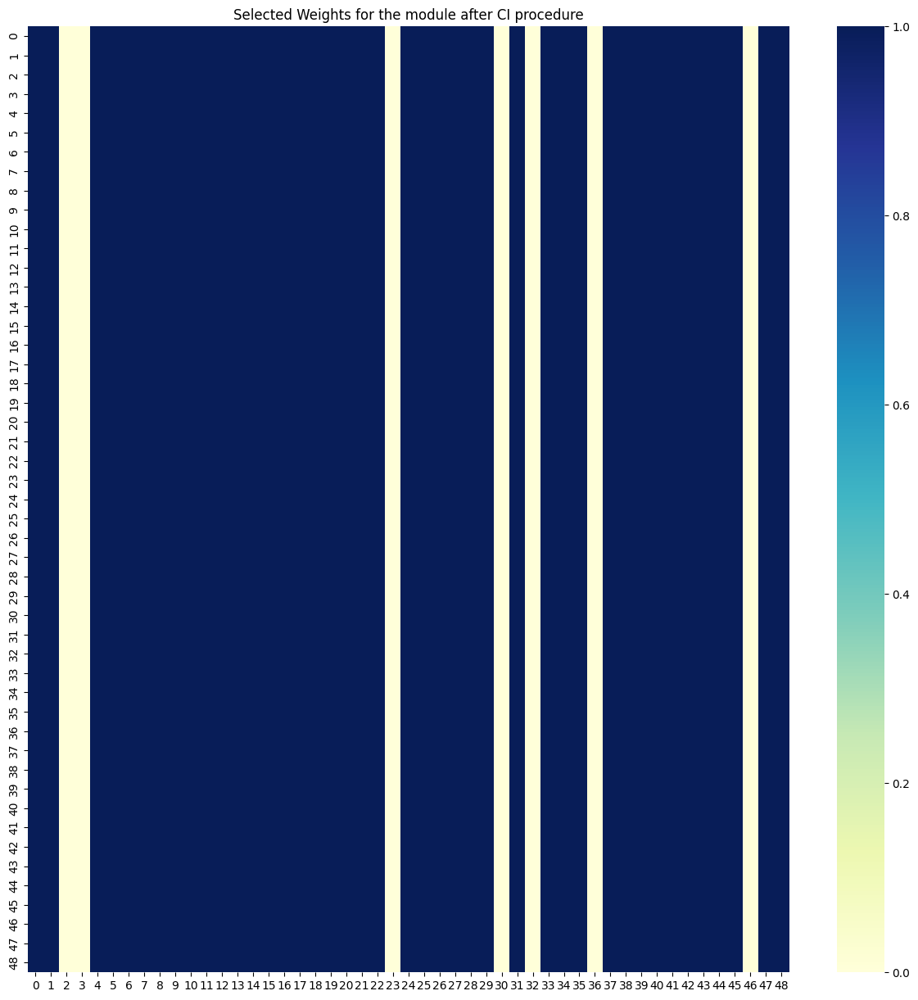

In [151]:
plt.figure(figsize=(15,15))
sns.heatmap(post_tii_df, cmap='YlGnBu', fmt="g")
plt.title('Selected Weights for the module after CI procedure')

# Output Layer

## Neurons Outputs

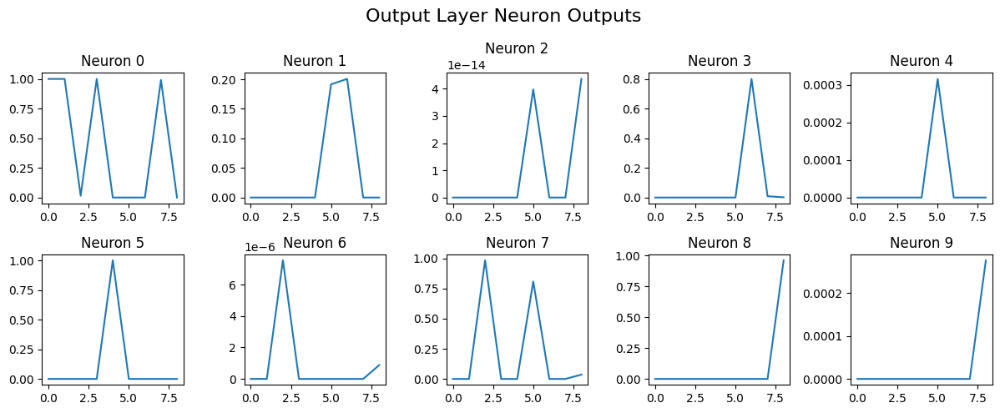

In [156]:
fig, axes = plt.subplots(2, 5, figsize=(12, 5))

for i, ax in enumerate(axes.flat):
    tii_X4[tii_X4.neuron == i].output.reset_index(drop=True).plot(ax=ax)
    ax.set_title(f'Neuron {i}')

fig.suptitle("Output Layer Neuron Outputs", fontsize=16)
plt.tight_layout()  # Adjust the spacing between subplots
plt.show()

## Regular Neuron

In [ ]:
tii_X4.query('output <=.5').neuron.value_counts().sort_index()

neuron
0    5
1    9
2    9
3    8
4    9
5    8
6    9
7    7
8    8
9    9
Name: count, dtype: int64

There are no 'regular' neurons. All of them hit zero - for the output layer 0.5 is consiered zero.

## Neurons with Outputs that hit zero

### First Neuron

In [182]:
hz_neuron = 0

In [186]:
tii_X4[tii_X4.neuron == hz_neuron].applymap(lambda x: 0 if x <= 0.5 else x)

,neuron,digit,output
0,0,0,0.999963
10,0,1,0.999997
20,0,2,0.000000
30,0,3,1.000000
40,0,4,0.000000
50,0,5,0.000000
60,0,6,0.000000
70,0,7,0.991331
80,0,8,0.000000


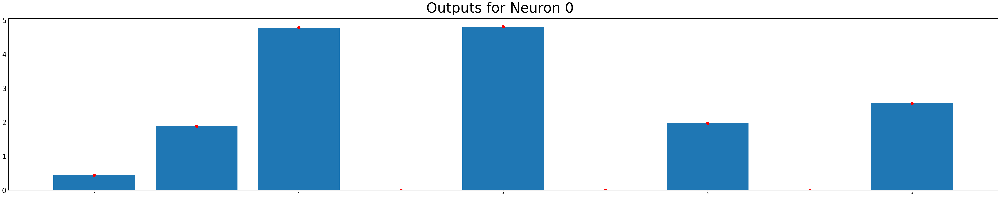

In [187]:
output_hz = tii_X3[tii_X3.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #3. 

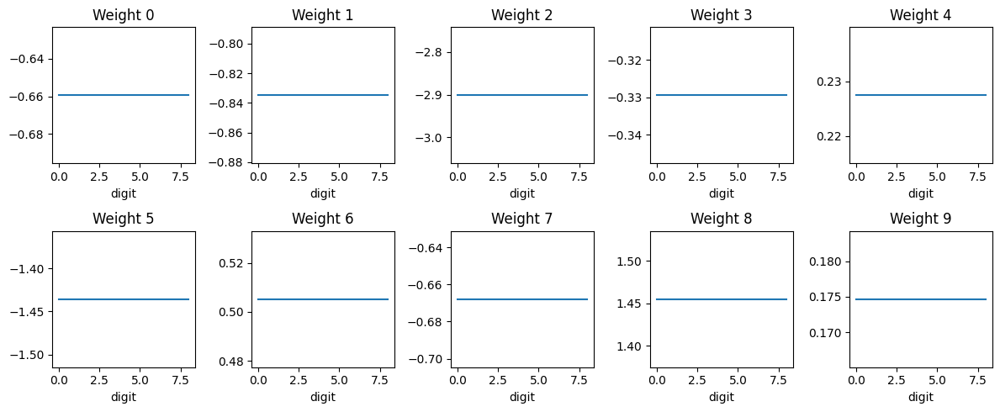

In [188]:
plot_neuron_weights(tii_D4, hz_neuron, pad=0, subplot_sizex=2, subplot_sizey=5, figsize=(12, 5))

Since the first output is greater than 0, the weights go back to their original value.

When the output is zero (digit #4), the updated values are the same as the original weight values, which were changed in example #0. So, no updates were made.

### Second Neuron

In [163]:
hz_neuron = 8

In [164]:
tii_X4[tii_X4.neuron == hz_neuron]

,neuron,digit,output
8,8,0,0.000000e+00
18,8,1,0.000000e+00
28,8,2,5.311360e-32
38,8,3,0.000000e+00
48,8,4,1.638689e-23
58,8,5,7.627027e-21
68,8,6,1.308899e-35
78,8,7,7.967309e-37
88,8,8,9.619151e-01


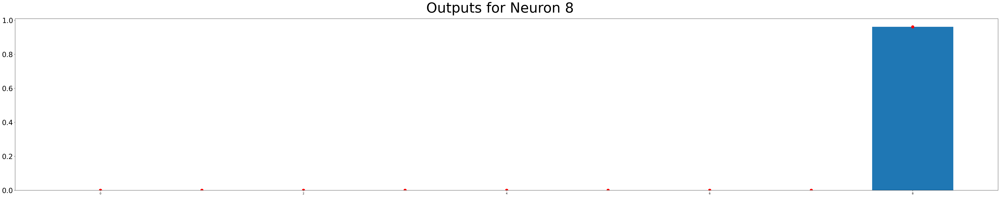

In [165]:
output_hz = tii_X4[tii_X4.neuron == hz_neuron][['output', 'digit']].reset_index(drop=True)

fig, axes = plt.subplots(1, 1, figsize=(50, 10), sharex=True)

# output_rn.plot(ax=axes, color='red')
# output_hz.plot(kind='bar', ax=axes)
plt.bar(output_hz.digit, output_hz.output)
plt.scatter(output_hz.digit, output_hz.output, color='red', s=100)

axes.tick_params(axis='y', labelsize=25)

fig.suptitle(f"Outputs for Neuron {hz_neuron}", fontsize=50)

# Display the plot
plt.tight_layout()
plt.show()

First zero is hit on example #8. 

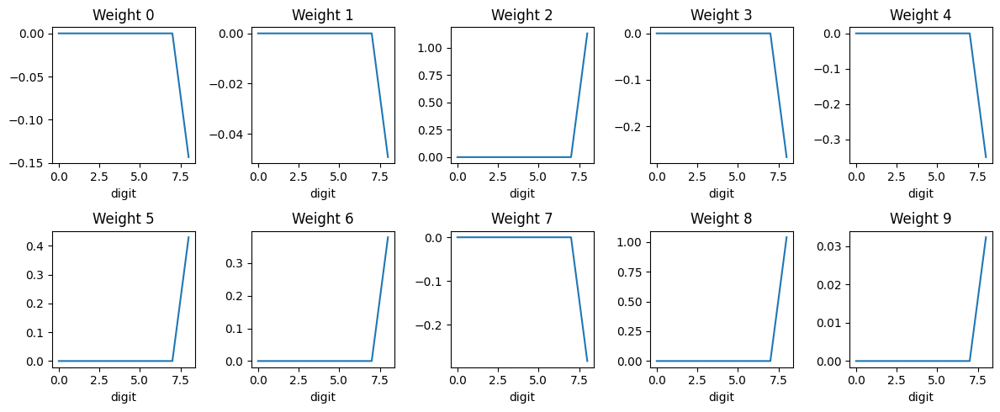

In [168]:
plot_neuron_weights(tii_D4, hz_neuron, pad=0, subplot_sizex=2, subplot_sizey=5, figsize=(12,5))

In [169]:
pd.DataFrame(D4_before_TII)[hz_neuron].sum()

0.0

Originally, all the weights for this neuron were zero. In the first example, the output of the neuron was zero. So, the weights of the CI operation were kept. In the last digit, the output was greater than zero (0.5). Then, the weights were updated to their original values. With this update, no other changes could be made, since comparisons always result in the original weight values.

## Selected neurons and Weights

In [189]:
post_tii_df = pd.DataFrame(slc.D4).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [190]:
before_tii_df = pd.DataFrame(D4_before_TII).transform(lambda x: x != 0).astype(int).reset_index(drop=True)

In [191]:
print("Neurons with any positive weights:")
post_tii_df.sum().transform(lambda x: x != 0).astype(int).value_counts()

Neurons with any positive weights:


1    5
0    5
Name: count, dtype: int64

Text(0.5, 0.98, 'Selected Neurons')

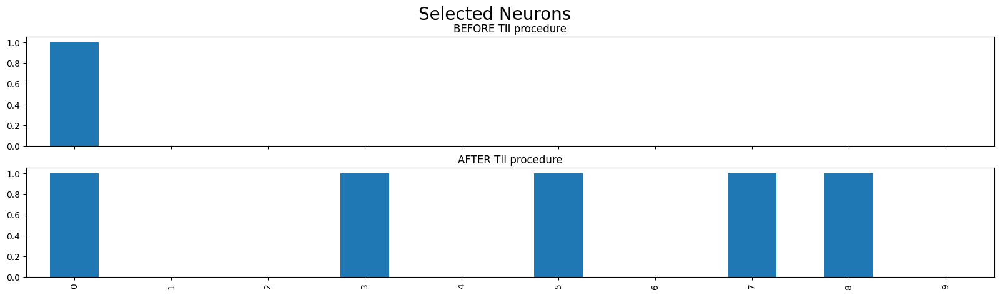

In [192]:
fig, axes = plt.subplots(2, 1, figsize=(20, 5), sharex=True)
before_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[0])
post_tii_df.sum().map(lambda x: 1 if x >= 1 else 0).plot(kind='bar', ax=axes[1])

axes[0].set_title('BEFORE TII procedure')
axes[1].set_title('AFTER TII procedure')
fig.suptitle('Selected Neurons', fontsize=20)

- All neurons selected before TII were kept. Several others were added.
- Funny enough, neuron 2 - responsible for the module's output was not selected.

5 neurons were selected during the TI phase of the algorithm.

<Axes: >

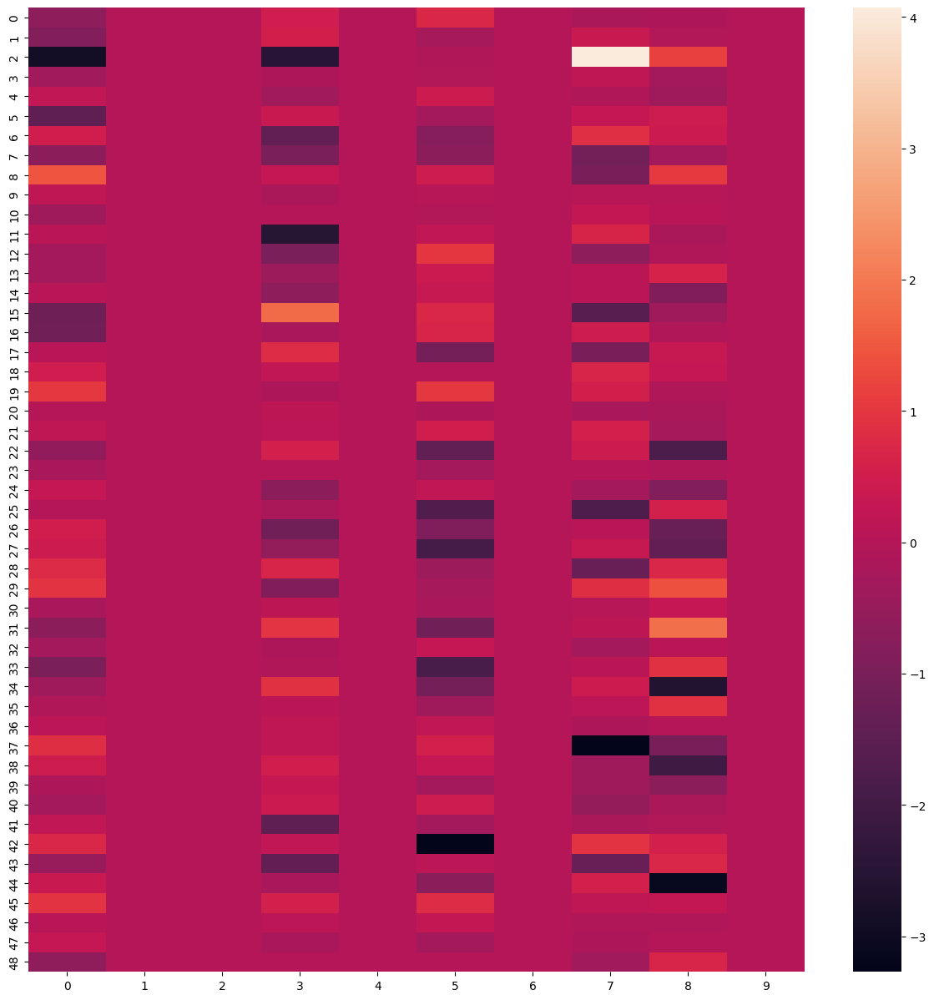

In [193]:
plt.figure(figsize=(15,15))
sns.heatmap(pd.DataFrame(slc.D4))#, annot=True)

Since the weights of some neurons were brought back, some negative weights are present in the final selection.

Text(0.5, 1.0, 'Selected Weights for the module after CI procedure')

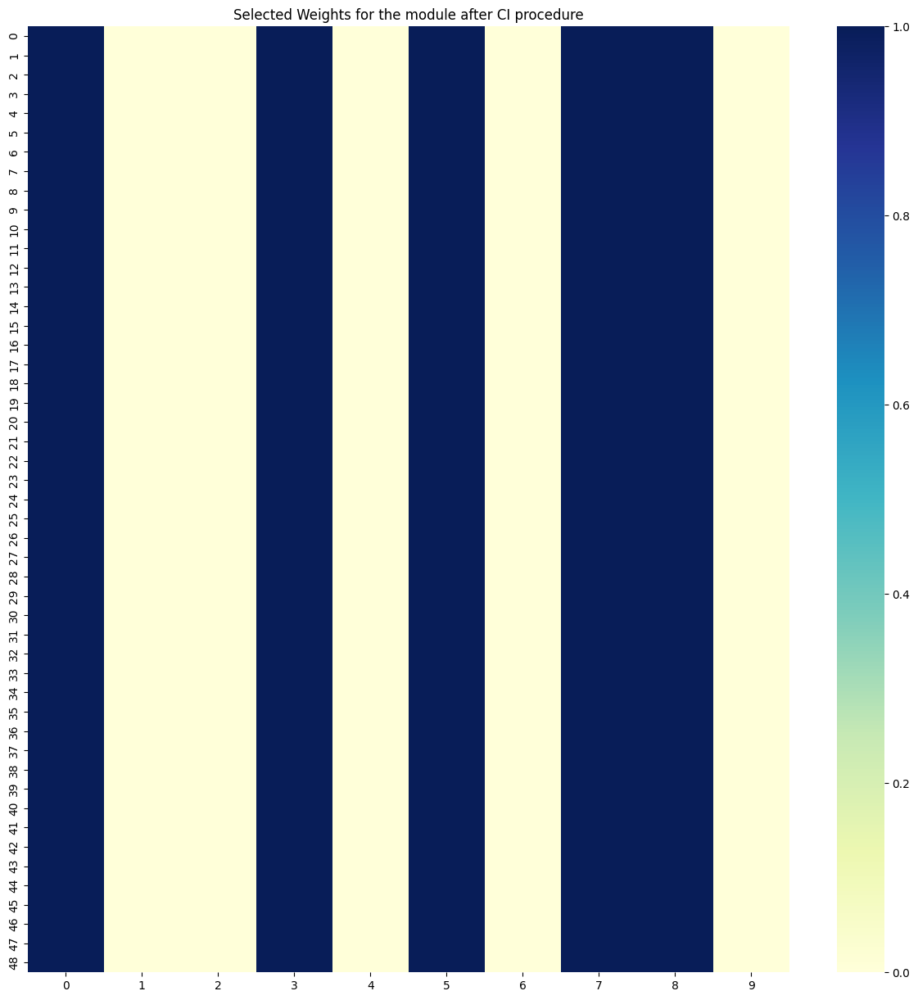

In [194]:
plt.figure(figsize=(15,15))
sns.heatmap(post_tii_df, cmap='YlGnBu', fmt="g")
plt.title('Selected Weights for the module after CI procedure')

All the weights of the selected neurons are utilized.